In [56]:
%matplotlib inline
%matplotlib inline

import PIL
import numpy as np
import pandas as pd
import torch
from easyimages import EasyImageList
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score, log_loss

from skorch.utils import *
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms


In [57]:
# %env CUDA_VISIBLE_DEVICES=None

In [58]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

### Define the new dataset

Keep in mind we are inheriting the Dataset base-class. And we have to override 2 methods:
 - \____len____
 - \____getitem____

1. load_image_and_target reads the data from the csv file and converts the image array into a PIL object - this is not mandatory but useful, as many handy functions like transform, operate on PIL.Images
2. getitem, takes a index and it should properly return for every number between (0, and len)
3. len should return the number of samples (images) in your dataset

In [60]:
label_dict = {
    0: 'T-shirt/top',
    1: 'Trouser',
    2: 'Pullover',
    3: 'Dress',
    4: 'Coat',
    5: 'Sandal',
    6: 'Shirt',
    7: 'Sneaker',
    8: 'Bag',
    9: 'Ankle boot'
}


class FashionMnist(Dataset):

    def __len__(self):
        return len(self.metadata_df)

    def __init__(self, 
                 metadata_df,
                 transform=None):

        self.metadata_df = metadata_df.copy()
        self.transform = transform

    def __getitem__(self, index):
        X, y = self.load_image_and_target(index)
        # We can transform the output images here, cast to torch data-format and/or do augmentations
        X = self.transform(X)

        return X, y

    def load_image_and_target(self, index):
        # .iloc is short for integer loc it returns a row of data based on its ored not index-value(if not the same)
        oneimage = self.metadata_df.iloc[index]
        image, y = PIL.Image.fromarray(np.array(oneimage[1:]).reshape(28, 28).astype('uint8'), 'L'), 
oneimage[0]

        return image, y

    def _load_image_metadata(self, index):

        image_path = df.iloc[index]

        image = PIL.Image.open(image_path)
        image.meta_data

        image, metada

    def collate_func(self, batch):
        pass


PATH_TO_FMNIST_TRAIN = './data/fashion-mnist_train.csv'
PATH_TO_FMNIST_TEST = './data/fashion-mnist_test.csv'


dftrain = pd.read_csv(PATH_TO_FMNIST_TRAIN).sample(frac=1)
dftest = pd.read_csv(PATH_TO_FMNIST_TEST).sample(frac=1)

transform_train = transforms.Compose([transforms.ToTensor()])
fmnist_train = FashionMnist(dftrain, transform=transform_train)

transform_test = transforms.Compose([transforms.ToTensor()])
fmnist_test = FashionMnist(dftest, transform=transform_test)

IndentationError: unindent does not match any outer indentation level (<tokenize>, line 42)

In [61]:
X, y = fmnist_test[0]
X.shape

torch.Size([1, 28, 28])

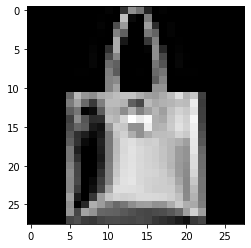

In [62]:
one_sample_image = dftrain.iloc[30].tolist()
label, image = one_sample_image[0], one_sample_image[1:]
label
im = np.array(image).reshape((28, 28))
plt.imshow(im, cmap='gray')

### our datasets supports getitem wich means we can do:

In [63]:
image, label = fmnist_train[0]
print(type(image))
print(type(label), label)

image, label = fmnist_train.load_image_and_target(0)
print(type(image), image)

<class 'torch.Tensor'>
<class 'numpy.int64'> 3
<class 'PIL.Image.Image'> <PIL.Image.Image image mode=L size=28x28 at 0x7FA94CA54D10>


In [64]:
fmnist_dl = DataLoader(fmnist_train, batch_size=32, num_workers=1)
batch_iterator = iter(fmnist_dl)
X, y = next(batch_iterator)

for batch in fmnist_dl:
    break
for batch in fmnist_dl:
    break

print("y:", batch[1].shape)
print("X: ", batch[0].shape)

y: torch.Size([32])
X:  torch.Size([32, 1, 28, 28])


In [65]:
batch[0].shape

torch.Size([32, 1, 28, 28])

### Explore your dataset
Its always good to start with getting some inside about your dataset. Thats usuall much easier and less important in image datasets - but it does not mean you should not do it.

Things you should always think about working with an image dataset are:
- Check target distribiution (counts) do you see a strong imbalance?
- Check sizes of images, if not all images are of the same size you might destroy your data with wrong transformations


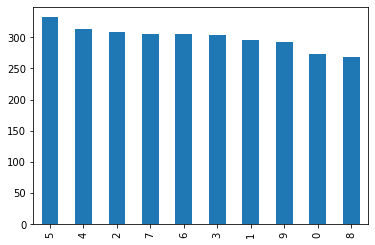

In [66]:
dftrain.label.value_counts().plot(kind='bar')

### visualize a batch
Its always a good idea to sanity check the output of our loaders

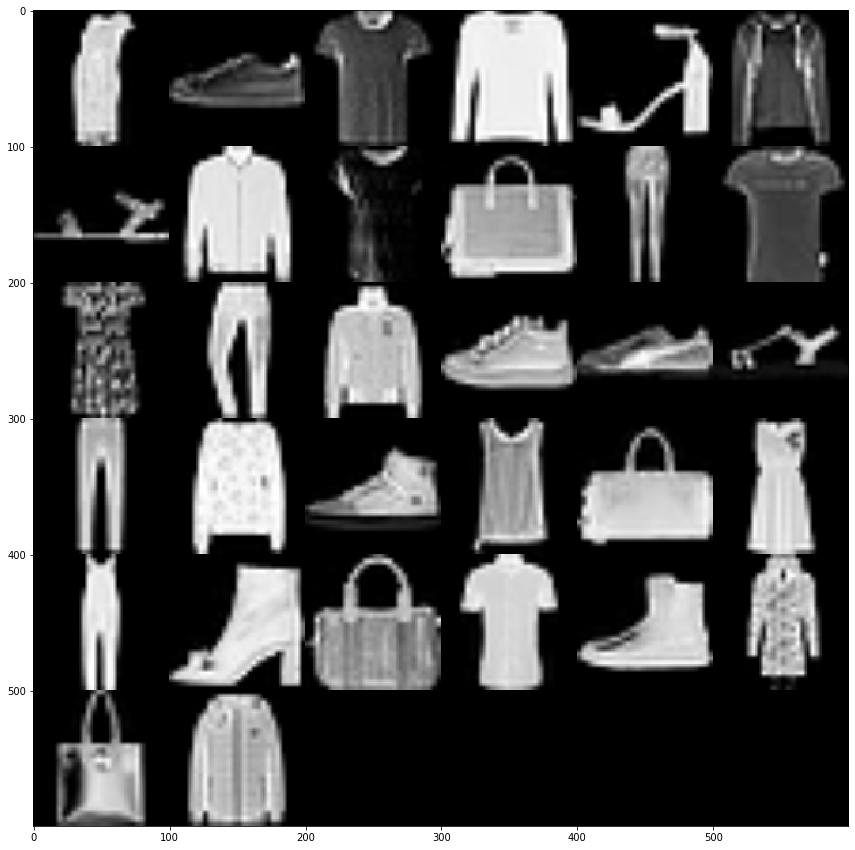

In [67]:
im = EasyImageList.from_torch_batch(X.repeat(1, 3, 1, 1),  # we need to add 3 channels to the images
                                    mean=None,
                                    std=None)
im.numpy_grid()

### Define your model architecture
As a baseline model dont  overcomplicate, either use some very simple architecture or go with something well established like resnet. There will be time to go more fancy

Here we define a model with two CONV blocks comprising of a typical:
*Conv>BN>RELU>POOL* setting

In [68]:
class SimpleCNN(nn.Module):
    def __init__(self, num_of_class):
        super(SimpleCNN, self).__init__()

        self.layer1 = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
#             nn.MaxPool2d(kernel_size=2, stride=2),
        )
                
        self.layer2 = nn.Sequential(
            nn.Conv2d(16, 16, kernel_size=5, stride=1, padding=2),
            nn.BatchNorm2d(16),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # we reduce the volume shape 1 times (1 Pooling Operations)
        self.fc = nn.Linear(int(28/2) * int(28/2) * 16, 100)
        
        self.fc2 = nn.Linear(100,10)
        
    def forward(self, x):
        out = self.layer1(x)        
        out = self.layer2(out)
        out = out.reshape(out.size(0), -1)
        

        out = self.fc(out)
        F.dropout(out)
        out = self.fc2(out)
        return out

In [69]:
# Always check your model are you atleasy able to make a forward pass and shapes match your expectations?
image = torch.randn(32, 1, 28, 28)
cnn = SimpleCNN(10)
# out_layer2 = cnn.layer2(cnn.layer1(image))
# out_layer2.reshape(out_layer2.size(0), -1).shape
# output = cnn(image)
print("input shape:")
print(image.shape)
print("output shape:")

input shape:
torch.Size([32, 1, 28, 28])
output shape:


### Define your loss function / crieterion and optimizer
Its a good idea to create some dummy data and pass it trough the cost function to make sure you uderstand what the shapes shoudl be

In case of CrossEntropyLosss We want our predictions to be of shape (BATCH_SIZE, N_CLASSES) and y_true of shape (BS)
(Basically a vector of number that corespond to the class)


In [70]:
LR = 0.001
BATCH_SIZE = 256
DATASET_USAGE_SIZE = 0.05

# MEAN = [0.485, 0.456, 0.406]
# STD = [0.229, 0.224, 0.225]
RESIZE = 28

cnn = SimpleCNN(10)

# one of ['ASGD','Adadelta', 'Adagrad','Adam', 'Adamax','LBFGS', 'RMSprop','Rprop','SGD',SparseAdam']
OPTIMIZER = 'Adam'
optimizer = getattr(torch.optim, OPTIMIZER)(cnn.parameters(), lr=LR)
criterion = nn.CrossEntropyLoss()

cnn.to(DEVICE)

# Create dataset loaders

dftrain = pd.read_csv(PATH_TO_FMNIST_TRAIN).sample(frac=DATASET_USAGE_SIZE)
dftest = pd.read_csv(PATH_TO_FMNIST_TEST).sample(frac=0.1)

transform_train = transforms.Compose(
    [transforms.Resize(RESIZE), transforms.ToTensor()])
fmnist_train = FashionMnist(dftrain, transform=transform_train)

transform_test = transforms.Compose(
    [transforms.Resize(RESIZE), transforms.ToTensor()])
fmnist_test = FashionMnist(dftest, transform=transform_test)

fmnist_train_dl = DataLoader(fmnist_train, batch_size=BATCH_SIZE)
fmnist_test_dl = DataLoader(fmnist_test, batch_size=BATCH_SIZE)

# Lets try to use the criterion with dummy data
yp = torch.randn(BATCH_SIZE, 10)
yt = torch.randint(10, (BATCH_SIZE,))
criterion(yp, yt.long())

# print(len(fmnist_train_dl))
# print(len(dftrain))

tensor(2.6494)

In [81]:
def process_train_batch(batch):
    X, y = batch
    return X.to(DEVICE), y.to(DEVICE)


def process_eval_batch(batch):
    X, y = batch
    X = X.to(DEVICE)
    y = y.to(DEVICE).detach().cpu().numpy()
    return X, y

@torch.no_grad()
def evaluate_model(model, test_loader, print_info=False):
    model.eval()
    collect_results = []
    collect_target = []
    for batch in test_loader:
        X, y = process_eval_batch(batch)
        pred = model(X)
        collect_results.append(
            F.softmax(pred, dim=1).detach().cpu().numpy())
        collect_target.append(y)

    preds_proba = np.concatenate(collect_results)
    preds = preds_proba.argmax(axis=1)
    
    print(preds)

    targets = np.concatenate(collect_target)

    ll = log_loss(targets, preds_proba)
    acc = accuracy_score(targets, preds)
    if print_info:
        print("test log-loss: {}".format(ll))
        print("overall accuracy:  {}".format(ac))
        #print(classification_report(targets, preds))
    model.train()
    return ll, acc



import neptune

neptune.init('i008/dsr',
             api_token='eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vdWkubmVwdHVuZS5haSIsImFwaV91cmwiOiJodHRwczovL3VpLm5lcHR1bmUuYWkiLCJhcGlfa2V5IjoiYmM5ODcxMWYtMTJiZS00OWVjLTkxODEtMWQwNzNmMTRmN2VkIn0=')

with neptune.create_experiment(name='fashion_mnist_cnn_2_layer'):
    collect_metrics = []
    collect_loss = []

    for epoch in range(25):
        lossacc = 0
        for i, batch in enumerate(fmnist_train_dl):
            optimizer.zero_grad()
            X, y = process_train_batch(batch)
            y_pred = cnn(X)
            loss = criterion(y_pred, y)
            loss.backward()
            optimizer.step()
            collect_loss.append(float(loss.detach().cpu().numpy()))
            neptune.send_metric('loss', collect_loss[-1])

        lltest, acctest = evaluate_model(cnn, fmnist_test_dl)
        lltrain, acctrain = evaluate_model(cnn, fmnist_train_dl)
        collect_metrics.append([lltest, lltrain, acctest, acctrain])
        neptune.send_metric('acctest', acctest)
        neptune.send_metric('acctrain', acctrain)
        print("test: loss: {}  acc: {}".format(lltest, acctest))
        print("train: loss: {}  acc: {}".format(lltrain, acctrain))

https://ui.neptune.ai/i008/dsr/e/DSR-55
printing layer1 activiation tensor([[[[0.1305, 0.1383, 0.1519,  ..., 0.1388, 0.1402, 0.1402],
          [0.1378, 0.1417, 0.0703,  ..., 0.2173, 0.1402, 0.1402],
          [0.1287, 0.1256, 0.0000,  ..., 0.6987, 0.1402, 0.1402],
          ...,
          [0.1402, 0.1402, 0.1313,  ..., 0.1402, 0.1402, 0.1402],
          [0.1402, 0.1402, 0.1342,  ..., 0.1402, 0.1402, 0.1402],
          [0.1402, 0.1402, 0.1373,  ..., 0.1402, 0.1402, 0.1402]],

         [[0.0441, 0.0492, 0.0268,  ..., 0.0499, 0.0428, 0.0428],
          [0.0523, 0.0247, 0.1184,  ..., 0.0000, 0.0428, 0.0428],
          [0.0629, 0.0449, 0.5358,  ..., 0.0000, 0.0428, 0.0428],
          ...,
          [0.0428, 0.0428, 0.0469,  ..., 0.0428, 0.0428, 0.0428],
          [0.0428, 0.0428, 0.0482,  ..., 0.0428, 0.0428, 0.0428],
          [0.0428, 0.0428, 0.0541,  ..., 0.0428, 0.0428, 0.0428]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

printing layer1 activiation tensor([[[[1.3129e-01, 1.3129e-01, 1.1574e-01,  ..., 1.3918e-01,
           1.3599e-01, 1.2988e-01],
          [1.3129e-01, 1.3129e-01, 1.2613e-01,  ..., 1.3141e-01,
           1.2590e-01, 1.2721e-01],
          [1.3129e-01, 1.3129e-01, 1.2859e-01,  ..., 1.3366e-01,
           1.2437e-01, 1.3103e-01],
          ...,
          [1.3129e-01, 0.0000e+00, 0.0000e+00,  ..., 1.9154e+00,
           0.0000e+00, 0.0000e+00],
          [1.3129e-01, 0.0000e+00, 0.0000e+00,  ..., 5.5397e-01,
           0.0000e+00, 0.0000e+00],
          [1.3129e-01, 1.2856e-01, 2.7857e-01,  ..., 5.7075e-01,
           3.9709e-01, 0.0000e+00]],

         [[1.6570e-02, 1.6570e-02, 2.3226e-02,  ..., 1.1429e-02,
           2.4953e-02, 2.3669e-02],
          [1.6570e-02, 1.6570e-02, 3.7234e-02,  ..., 2.5235e-02,
           2.6998e-02, 1.8084e-02],
          [1.6570e-02, 1.6570e-02, 2.7243e-02,  ..., 4.2876e-03,
           1.4010e-02, 8.3207e-03],
          ...,
          [1.6570e-02, 3.9142e-

printing layer1 activiation tensor([[[[1.3388e-01, 1.3388e-01, 1.3388e-01,  ..., 1.3388e-01,
           1.3388e-01, 1.3388e-01],
          [1.3388e-01, 1.3388e-01, 1.3388e-01,  ..., 1.3388e-01,
           1.3388e-01, 1.3388e-01],
          [1.3388e-01, 1.3388e-01, 1.3388e-01,  ..., 1.3388e-01,
           1.3388e-01, 1.3388e-01],
          ...,
          [1.3388e-01, 1.3388e-01, 1.3388e-01,  ..., 1.3388e-01,
           1.3388e-01, 1.3388e-01],
          [1.3388e-01, 1.3388e-01, 1.3388e-01,  ..., 1.3388e-01,
           1.3388e-01, 1.3388e-01],
          [1.3388e-01, 1.3388e-01, 1.3388e-01,  ..., 1.3388e-01,
           1.3388e-01, 1.3388e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[1.4692e-01, 1.4692e-01, 1.4692e-01,  ..., 1.4692e-01,
           1.4692e-01, 1.4692e-01],
          [1.4692e-01, 1.4692e-01, 1.4692e-01,  ..., 1.4692e-01,
           1.4692e-01, 1.4692e-01],
          [1.4692e-01, 1.4692e-01, 1.4692e-01,  ..., 1.4692e-01,
           1.4692e-01, 1.4692e-01],
          ...,
          [1.4692e-01, 1.4692e-01, 1.4692e-01,  ..., 1.4692e-01,
           1.4692e-01, 1.4692e-01],
          [1.4692e-01, 1.4692e-01, 1.4692e-01,  ..., 1.4692e-01,
           1.4692e-01, 1.4692e-01],
          [1.4692e-01, 1.4692e-01, 1.4692e-01,  ..., 1.4692e-01,
           1.4692e-01, 1.4692e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[1.5769e-01, 1.5769e-01, 1.5360e-01,  ..., 1.5291e-01,
           1.6195e-01, 1.5769e-01],
          [1.5769e-01, 1.5769e-01, 1.5288e-01,  ..., 1.6380e-01,
           1.5626e-01, 1.5769e-01],
          [1.5769e-01, 1.5769e-01, 1.5651e-01,  ..., 3.2678e-01,
           1.5358e-01, 1.5769e-01],
          ...,
          [1.5769e-01, 1.5769e-01, 2.3057e-01,  ..., 0.0000e+00,
           1.2978e-01, 1.5769e-01],
          [1.5769e-01, 1.5769e-01, 3.2072e-01,  ..., 0.0000e+00,
           2.6120e-01, 1.5769e-01],
          [1.5769e-01, 1.5769e-01, 1.7953e-01,  ..., 0.0000e+00,
           1.6395e-01, 1.5769e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[1.6620e-01, 1.6620e-01, 1.6620e-01,  ..., 1.6620e-01,
           1.6620e-01, 1.6620e-01],
          [1.6620e-01, 1.6620e-01, 1.6620e-01,  ..., 1.6620e-01,
           1.6620e-01, 1.6620e-01],
          [1.6620e-01, 1.6620e-01, 1.6620e-01,  ..., 1.6620e-01,
           1.6620e-01, 1.6620e-01],
          ...,
          [1.6620e-01, 1.6620e-01, 1.6620e-01,  ..., 0.0000e+00,
           1.6620e-01, 1.6620e-01],
          [1.6620e-01, 1.6620e-01, 1.6620e-01,  ..., 0.0000e+00,
           1.6620e-01, 1.6620e-01],
          [1.6620e-01, 1.6620e-01, 1.6620e-01,  ..., 0.0000e+00,
           1.6620e-01, 1.6620e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.1621, 0.0000, 0.0000,  ..., 0.5335, 0.3152, 0.2951],
          [0.1621, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.6344],
          [0.1621, 0.0000, 0.0000,  ..., 0.3230, 0.0000, 0.5159],
          ...,
          [0.1375, 0.6363, 0.8804,  ..., 0.0000, 0.6836, 0.7371],
          [0.1561, 0.2245, 0.4888,  ..., 0.2763, 0.4865, 0.1555],
          [0.1540, 0.1500, 0.4147,  ..., 0.2232, 0.3380, 0.1664]],

         [[0.0000, 0.1189, 1.5723,  ..., 0.0000, 0.1811, 0.0000],
          [0.0000, 0.4672, 3.3735,  ..., 0.6653, 0.0000, 0.0000],
          [0.0000, 0.7516, 3.1656,  ..., 0.0000, 0.0000, 0.0453],
          ...,
          [0.0000, 0.0000, 2.1980,  ..., 1.7259, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0503],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1225,  ..., 0.1258, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1162,  ..., 0.1214, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1150,  ..., 0.1193, 0.1225, 0.1225],
          ...,
          [0.1225, 0.1225, 0.0000,  ..., 0.3685, 0.0000, 0.1225],
          [0.1225, 0.1225, 0.1513,  ..., 0.0000, 0.0000, 0.1225],
          [0.1225, 0.1225, 0.1506,  ..., 0.0000, 0.0000, 0.1225]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.1114,  ..., 0.2967, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0176, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1225,  ..., 0.4474, 0.2421, 0.1442],
          [0.1225, 0.1225, 0.1225,  ..., 0.0264, 0.0000, 0.0649],
          [0.1225, 0.1225, 0.1225,  ..., 0.4062, 0.0000, 0.0000],
          ...,
          [0.0000, 0.5061, 0.6314,  ..., 0.7555, 0.0000, 0.0000],
          [0.4249, 0.0000, 0.5589,  ..., 0.2736, 0.0000, 0.0000],
          [1.0201, 0.6709, 0.9080,  ..., 0.9794, 0.5004, 0.2046]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.2292, 0.0188],
          [0.0000, 0.0000, 0.0000,  ..., 0.7390, 0.2797, 0.0111],
          [0.0000, 0.0000, 0.0000,  ..., 0.5641, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 1.3362,  ..., 1.4938, 0.3613, 0.0000],
          [0.3715, 0.2484, 0.3847,  ..., 0.5052, 0.0000, 0.0000],
          [0.0000, 0.6930, 0.7307,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1104,  ..., 0.1286, 0.1261, 0.1214],
          [0.1225, 0.1225, 0.1186,  ..., 0.1225, 0.1183, 0.1193],
          [0.1225, 0.1225, 0.1206,  ..., 0.1243, 0.1171, 0.1223],
          ...,
          [0.1225, 0.0000, 0.0000,  ..., 1.4808, 0.0000, 0.0000],
          [0.1225, 0.0000, 0.0000,  ..., 0.4291, 0.0000, 0.0000],
          [0.1225, 0.1271, 0.2552,  ..., 0.4483, 0.3184, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.2026, 0.2891,  ..., 0.9417, 0.7009, 0.4819],
          [0.0000, 0.5152, 0.0000,  ..., 0.7568, 0.1584, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          ...,
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          ...,
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1193,  ..., 0.1188, 0.1258, 0.1225],
          [0.1225, 0.1225, 0.1188,  ..., 0.1272, 0.1214, 0.1225],
          [0.1225, 0.1225, 0.1216,  ..., 0.2530, 0.1193, 0.1225],
          ...,
          [0.1225, 0.1225, 0.1840,  ..., 0.0000, 0.1000, 0.1225],
          [0.1225, 0.1225, 0.2513,  ..., 0.0000, 0.2023, 0.1225],
          [0.1225, 0.1225, 0.1397,  ..., 0.0000, 0.1273, 0.1225]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.1225, 0.1225, 0.1225],
          ...,
          [0.1225, 0.1225, 0.1225,  ..., 0.0000, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.0000, 0.1225, 0.1225],
          [0.1225, 0.1225, 0.1225,  ..., 0.0000, 0.1225, 0.1225]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1225, 0.0000, 0.0000,  ..., 0.4048, 0.2387, 0.2234],
          [0.1225, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.4809],
          [0.1225, 0.0000, 0.0000,  ..., 0.2455, 0.0000, 0.3910],
          ...,
          [0.1039, 0.4842, 0.6728,  ..., 0.0000, 0.5183, 0.5588],
          [0.1180, 0.1701, 0.3734,  ..., 0.2090, 0.3686, 0.1175],
          [0.1164, 0.1133, 0.3156,  ..., 0.1687, 0.2560, 0.1258]],

         [[0.0000, 0.0767, 0.9682,  ..., 0.0000, 0.1161, 0.0000],
          [0.0000, 0.2900, 2.0754,  ..., 0.4158, 0.0000, 0.0000],
          [0.0000, 0.4645, 1.9484,  ..., 0.0000, 0.0000, 0.0324],
          ...,
          [0.0000, 0.0000, 1.3602,  ..., 1.0728, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0349],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1481, 0.1559, 0.1696,  ..., 0.1563, 0.1578, 0.1578],
          [0.1555, 0.1593, 0.0872,  ..., 0.2350, 0.1578, 0.1578],
          [0.1464, 0.1432, 0.0000,  ..., 0.7164, 0.1578, 0.1578],
          ...,
          [0.1578, 0.1578, 0.1488,  ..., 0.1578, 0.1578, 0.1578],
          [0.1578, 0.1578, 0.1518,  ..., 0.1578, 0.1578, 0.1578],
          [0.1578, 0.1578, 0.1551,  ..., 0.1578, 0.1578, 0.1578]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0099,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4202,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1453, 0.1453, 0.1453,  ..., 0.1747, 0.1329, 0.1538],
          [0.1453, 0.1453, 0.0000,  ..., 0.4236, 0.1397, 0.1510],
          [0.1356, 0.0963, 0.0000,  ..., 0.4785, 0.1458, 0.1342],
          ...,
          [0.1453, 0.1453, 0.1453,  ..., 0.1530, 0.1480, 0.1510],
          [0.1453, 0.1453, 0.1453,  ..., 0.1690, 0.1549, 0.1342],
          [0.1453, 0.1453, 0.1453,  ..., 0.1550, 0.1474, 0.1280]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1390,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4347,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1455, 0.1455, 0.1455,  ..., 0.1499, 0.1455, 0.1455],
          [0.1455, 0.1455, 0.1414,  ..., 0.1392, 0.1499, 0.1455],
          [0.1455, 0.1455, 0.1406,  ..., 0.1475, 0.1441, 0.1455],
          ...,
          [0.1455, 0.1455, 0.0000,  ..., 1.1728, 0.0000, 0.1455],
          [0.1455, 0.1455, 0.0000,  ..., 0.3554, 0.0000, 0.1455],
          [0.1455, 0.1455, 0.2041,  ..., 0.5955, 0.0000, 0.1455]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.4595,  ..., 1.1457, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.2663,  ..., 1.5142, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1455, 0.1455, 0.1455,  ..., 0.1455, 0.1455, 0.1455],
          [0.1455, 0.1455, 0.1455,  ..., 0.1455, 0.1455, 0.1455],
          [0.1455, 0.1455, 0.0000,  ..., 0.2486, 0.1455, 0.1455],
          ...,
          [0.1455, 0.1455, 0.1395,  ..., 0.1454, 0.1455, 0.1455],
          [0.1455, 0.1455, 0.1428,  ..., 0.1315, 0.1455, 0.1455],
          [0.1455, 0.1455, 0.1462,  ..., 0.1275, 0.1455, 0.1455]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0688,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1502, 0.1502, 0.1502,  ..., 0.1406, 0.1588, 0.1502],
          [0.1502, 0.1502, 0.1502,  ..., 0.1625, 0.1473, 0.1502],
          [0.1502, 0.1502, 0.1502,  ..., 0.1561, 0.1418, 0.1502],
          ...,
          [0.1502, 0.1502, 0.1378,  ..., 0.1435, 0.1502, 0.1502],
          [0.1502, 0.1502, 0.1486,  ..., 0.1217, 0.1502, 0.1502],
          [0.1502, 0.1502, 0.1494,  ..., 0.1292, 0.1502, 0.1502]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1822, 0.1822, 0.1822,  ..., 0.1822, 0.1822, 0.1822],
          [0.1822, 0.1822, 0.1822,  ..., 0.1822, 0.1822, 0.1822],
          [0.1822, 0.1822, 0.1822,  ..., 0.1822, 0.1822, 0.1822],
          ...,
          [0.1822, 0.1822, 0.1822,  ..., 0.1822, 0.1822, 0.1822],
          [0.1822, 0.1822, 0.1822,  ..., 0.1822, 0.1822, 0.1822],
          [0.1822, 0.1822, 0.1822,  ..., 0.1822, 0.1822, 0.1822]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[1.4944e-01, 1.4944e-01, 1.4944e-01,  ..., 1.4944e-01,
           1.4944e-01, 1.4944e-01],
          [1.4944e-01, 1.4944e-01, 1.4944e-01,  ..., 1.4944e-01,
           1.4944e-01, 1.4944e-01],
          [1.4944e-01, 1.4944e-01, 1.4944e-01,  ..., 1.4754e-01,
           1.4500e-01, 1.5335e-01],
          ...,
          [1.4944e-01, 1.4944e-01, 1.4944e-01,  ..., 3.9058e-01,
           2.6958e-01, 3.0274e-01],
          [1.4944e-01, 1.4944e-01, 1.4944e-01,  ..., 1.4944e-01,
           1.4944e-01, 1.4944e-01],
          [1.4944e-01, 1.4944e-01, 1.4944e-01,  ..., 1.4944e-01,
           1.4944e-01, 1.4944e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.1494, 0.1494, 0.1494,  ..., 0.1460, 0.1629, 0.1481],
          [0.1494, 0.1494, 0.1494,  ..., 0.2399, 0.1435, 0.1411],
          [0.1494, 0.1494, 0.1494,  ..., 1.0159, 0.1552, 0.1464],
          ...,
          [0.0000, 0.8995, 0.8356,  ..., 1.6217, 2.5584, 0.0000],
          [0.5277, 0.5790, 0.0000,  ..., 1.5134, 2.4581, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0389, 1.4932, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.5442,  ..., 0.0000, 2.1355, 0.0000],
          [0.0000, 0.9562, 1.3871,  ..., 0.0000, 3.2790, 0.0000],
          [0.0000, 0.1230, 0.3635,  ..., 0.7493, 2.2455, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1405, 0.1477, 0.1603,  ..., 0.1481, 0.1494, 0.1494],
          [0.1473, 0.1508, 0.0848,  ..., 0.2199, 0.1494, 0.1494],
          [0.1390, 0.1360, 0.0000,  ..., 0.6591, 0.1494, 0.1494],
          ...,
          [0.1494, 0.1494, 0.1412,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1439,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1470,  ..., 0.1494, 0.1494, 0.1494]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0270,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.3571,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1494, 0.1494, 0.1494,  ..., 0.1765, 0.1378, 0.1573],
          [0.1494, 0.1494, 0.0000,  ..., 0.4054, 0.1441, 0.1545],
          [0.1404, 0.1040, 0.0000,  ..., 0.4528, 0.1497, 0.1389],
          ...,
          [0.1494, 0.1494, 0.1494,  ..., 0.1565, 0.1518, 0.1545],
          [0.1494, 0.1494, 0.1494,  ..., 0.1712, 0.1582, 0.1389],
          [0.1494, 0.1494, 0.1494,  ..., 0.1582, 0.1512, 0.1332]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1518,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.3943,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1494, 0.1494, 0.1494,  ..., 0.1534, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1457,  ..., 0.1436, 0.1534, 0.1494],
          [0.1494, 0.1494, 0.1450,  ..., 0.1512, 0.1481, 0.1494],
          ...,
          [0.1494, 0.1494, 0.0000,  ..., 1.0333, 0.0000, 0.1494],
          [0.1494, 0.1494, 0.0000,  ..., 0.2983, 0.0000, 0.1494],
          [0.1494, 0.1494, 0.2058,  ..., 0.5245, 0.0000, 0.1494]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.3926,  ..., 0.9838, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.2406,  ..., 1.2900, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.0000,  ..., 0.2434, 0.1494, 0.1494],
          ...,
          [0.1494, 0.1494, 0.1439,  ..., 0.1492, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1470,  ..., 0.1364, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1501,  ..., 0.1328, 0.1494, 0.1494]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0872,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1494, 0.1494, 0.1494,  ..., 0.1406, 0.1573, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1607, 0.1467, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1548, 0.1417, 0.1494],
          ...,
          [0.1494, 0.1494, 0.1380,  ..., 0.1429, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1480,  ..., 0.1230, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1487,  ..., 0.1298, 0.1494, 0.1494]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          ...,
          [0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494],
          [0.1494, 0.1494, 0.1494,  ..., 0.1494, 0.1494, 0.1494]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1887, 0.1966, 0.2104,  ..., 0.1970, 0.1985, 0.1985],
          [0.1962, 0.2000, 0.1273,  ..., 0.2761, 0.1985, 0.1985],
          [0.1871, 0.1837, 0.0000,  ..., 0.7599, 0.1985, 0.1985],
          ...,
          [0.1985, 0.1985, 0.1894,  ..., 0.1985, 0.1985, 0.1985],
          [0.1985, 0.1985, 0.1924,  ..., 0.1985, 0.1985, 0.1985],
          [0.1985, 0.1985, 0.1958,  ..., 0.1985, 0.1985, 0.1985]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0426,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4477,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.0059e-01, 2.0059e-01, 2.0059e-01,  ..., 2.3003e-01,
           1.8792e-01, 2.0912e-01],
          [2.0059e-01, 2.0059e-01, 0.0000e+00,  ..., 4.7955e-01,
           1.9472e-01, 2.0612e-01],
          [1.9071e-01, 1.5110e-01, 0.0000e+00,  ..., 5.3101e-01,
           2.0079e-01, 1.8912e-01],
          ...,
          [2.0059e-01, 2.0059e-01, 2.0059e-01,  ..., 2.0824e-01,
           2.0319e-01, 2.0612e-01],
          [2.0059e-01, 2.0059e-01, 2.0059e-01,  ..., 2.2433e-01,
           2.1011e-01, 1.8912e-01],
          [2.0059e-01, 2.0059e-01, 2.0059e-01,  ..., 2.1016e-01,
           2.0246e-01, 1.8280e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 2.0480e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 7.1456e-03, 4.9154e-01,  ..., 0.0000e+00,
           0.0000e+00, 2.5873e-03],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[2.0355e-01, 2.0355e-01, 2.0355e-01,  ..., 2.0791e-01,
           2.0355e-01, 2.0355e-01],
          [2.0355e-01, 2.0355e-01, 1.9934e-01,  ..., 1.9708e-01,
           2.0791e-01, 2.0355e-01],
          [2.0355e-01, 2.0355e-01, 1.9858e-01,  ..., 2.0549e-01,
           2.0201e-01, 2.0355e-01],
          ...,
          [2.0355e-01, 2.0355e-01, 0.0000e+00,  ..., 1.1786e+00,
           0.0000e+00, 2.0355e-01],
          [2.0355e-01, 2.0355e-01, 2.9441e-02,  ..., 3.5933e-01,
           0.0000e+00, 2.0355e-01],
          [2.0355e-01, 2.0355e-01, 2.6777e-01,  ..., 6.1197e-01,
           0.0000e+00, 2.0355e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.1888, 0.1888, 0.1888,  ..., 0.1888, 0.1888, 0.1888],
          [0.1888, 0.1888, 0.1888,  ..., 0.1888, 0.1888, 0.1888],
          [0.1888, 0.1888, 0.0105,  ..., 0.2924, 0.1888, 0.1888],
          ...,
          [0.1888, 0.1888, 0.1828,  ..., 0.1886, 0.1888, 0.1888],
          [0.1888, 0.1888, 0.1861,  ..., 0.1745, 0.1888, 0.1888],
          [0.1888, 0.1888, 0.1896,  ..., 0.1704, 0.1888, 0.1888]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1046,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1717, 0.1717, 0.1717,  ..., 0.1620, 0.1804, 0.1717],
          [0.1717, 0.1717, 0.1717,  ..., 0.1842, 0.1687, 0.1717],
          [0.1717, 0.1717, 0.1717,  ..., 0.1776, 0.1631, 0.1717],
          ...,
          [0.1717, 0.1717, 0.1593,  ..., 0.1644, 0.1717, 0.1717],
          [0.1717, 0.1717, 0.1703,  ..., 0.1424, 0.1717, 0.1717],
          [0.1717, 0.1717, 0.1710,  ..., 0.1500, 0.1717, 0.1717]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1848, 0.1848, 0.1848,  ..., 0.1848, 0.1848, 0.1848],
          [0.1848, 0.1848, 0.1848,  ..., 0.1848, 0.1848, 0.1848],
          [0.1848, 0.1848, 0.1848,  ..., 0.1848, 0.1848, 0.1848],
          ...,
          [0.1848, 0.1848, 0.1848,  ..., 0.1848, 0.1848, 0.1848],
          [0.1848, 0.1848, 0.1848,  ..., 0.1848, 0.1848, 0.1848],
          [0.1848, 0.1848, 0.1848,  ..., 0.1848, 0.1848, 0.1848]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1767, 0.1740, 0.1830],
          ...,
          [0.1788, 0.1788, 0.1788,  ..., 0.4356, 0.3057, 0.3421],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.1751, 0.1932, 0.1773],
          [0.1788, 0.1788, 0.1788,  ..., 0.2757, 0.1724, 0.1698],
          [0.1788, 0.1788, 0.1788,  ..., 1.1061, 0.1848, 0.1755],
          ...,
          [0.0000, 1.0012, 0.9299,  ..., 1.7651, 2.7498, 0.0000],
          [0.6134, 0.6698, 0.0000,  ..., 1.6466, 2.6421, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0578, 1.6073, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.6036,  ..., 0.0000, 2.4817, 0.0000],
          [0.0000, 1.0662, 1.5765,  ..., 0.0000, 3.7831, 0.0000],
          [0.0000, 0.1604, 0.4434,  ..., 0.9108, 2.5950, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1692, 0.1769, 0.1905,  ..., 0.1773, 0.1788, 0.1788],
          [0.1766, 0.1803, 0.1099,  ..., 0.2542, 0.1788, 0.1788],
          [0.1678, 0.1645, 0.0000,  ..., 0.7240, 0.1788, 0.1788],
          ...,
          [0.1788, 0.1788, 0.1700,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1729,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1762,  ..., 0.1788, 0.1788, 0.1788]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0321,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4053,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.2077, 0.1663, 0.1872],
          [0.1788, 0.1788, 0.0000,  ..., 0.4528, 0.1730, 0.1842],
          [0.1691, 0.1303, 0.0000,  ..., 0.5018, 0.1789, 0.1674],
          ...,
          [0.1788, 0.1788, 0.1788,  ..., 0.1864, 0.1813, 0.1842],
          [0.1788, 0.1788, 0.1788,  ..., 0.2023, 0.1882, 0.1674],
          [0.1788, 0.1788, 0.1788,  ..., 0.1883, 0.1806, 0.1612]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1737,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4461,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.1830, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1748,  ..., 0.1725, 0.1830, 0.1788],
          [0.1788, 0.1788, 0.1740,  ..., 0.1806, 0.1773, 0.1788],
          ...,
          [0.1788, 0.1788, 0.0000,  ..., 1.1055, 0.0000, 0.1788],
          [0.1788, 0.1788, 0.0290,  ..., 0.3180, 0.0000, 0.1788],
          [0.1788, 0.1788, 0.2541,  ..., 0.5643, 0.0000, 0.1788]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.4270,  ..., 1.1750, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.2603,  ..., 1.5138, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0157, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.0053,  ..., 0.2794, 0.1788, 0.1788],
          ...,
          [0.1788, 0.1788, 0.1729,  ..., 0.1785, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1762,  ..., 0.1647, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1796,  ..., 0.1608, 0.1788, 0.1788]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1004,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.1693, 0.1872, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1909, 0.1758, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1845, 0.1704, 0.1788],
          ...,
          [0.1788, 0.1788, 0.1667,  ..., 0.1714, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1774,  ..., 0.1501, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1781,  ..., 0.1575, 0.1788, 0.1788]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          ...,
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788],
          [0.1788, 0.1788, 0.1788,  ..., 0.1788, 0.1788, 0.1788]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1839, 0.1918, 0.2059,  ..., 0.1923, 0.1938, 0.1938],
          [0.1916, 0.1954, 0.1222,  ..., 0.2722, 0.1938, 0.1938],
          [0.1824, 0.1789, 0.0000,  ..., 0.7604, 0.1938, 0.1938],
          ...,
          [0.1938, 0.1938, 0.1847,  ..., 0.1938, 0.1938, 0.1938],
          [0.1938, 0.1938, 0.1877,  ..., 0.1938, 0.1938, 0.1938],
          [0.1938, 0.1938, 0.1912,  ..., 0.1938, 0.1938, 0.1938]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0076,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4116,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[1.9989e-01, 1.9989e-01, 1.9989e-01,  ..., 2.2955e-01,
           1.8700e-01, 2.0848e-01],
          [1.9989e-01, 1.9989e-01, 0.0000e+00,  ..., 4.8082e-01,
           1.9385e-01, 2.0539e-01],
          [1.8989e-01, 1.5007e-01, 0.0000e+00,  ..., 5.3053e-01,
           1.9999e-01, 1.8816e-01],
          ...,
          [1.9989e-01, 1.9989e-01, 1.9989e-01,  ..., 2.0764e-01,
           2.0248e-01, 2.0539e-01],
          [1.9989e-01, 1.9989e-01, 1.9989e-01,  ..., 2.2395e-01,
           2.0947e-01, 1.8816e-01],
          [1.9989e-01, 1.9989e-01, 1.9989e-01,  ..., 2.0958e-01,
           2.0170e-01, 1.8177e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 1.8598e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 4.7008e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[2.1481e-01, 2.1481e-01, 2.1481e-01,  ..., 2.1919e-01,
           2.1481e-01, 2.1481e-01],
          [2.1481e-01, 2.1481e-01, 2.1058e-01,  ..., 2.0822e-01,
           2.1919e-01, 2.1481e-01],
          [2.1481e-01, 2.1481e-01, 2.0980e-01,  ..., 2.1671e-01,
           2.1323e-01, 2.1481e-01],
          ...,
          [2.1481e-01, 2.1481e-01, 0.0000e+00,  ..., 1.1654e+00,
           0.0000e+00, 2.1481e-01],
          [2.1481e-01, 2.1481e-01, 5.9030e-02,  ..., 3.4295e-01,
           0.0000e+00, 2.1481e-01],
          [2.1481e-01, 2.1481e-01, 2.9485e-01,  ..., 6.0502e-01,
           0.0000e+00, 2.1481e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2106, 0.2106, 0.2106,  ..., 0.2106, 0.2106, 0.2106],
          [0.2106, 0.2106, 0.2106,  ..., 0.2106, 0.2106, 0.2106],
          [0.2106, 0.2106, 0.0312,  ..., 0.3144, 0.2106, 0.2106],
          ...,
          [0.2106, 0.2106, 0.2045,  ..., 0.2102, 0.2106, 0.2106],
          [0.2106, 0.2106, 0.2080,  ..., 0.1959, 0.2106, 0.2106],
          [0.2106, 0.2106, 0.2114,  ..., 0.1919, 0.2106, 0.2106]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1325,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0053, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0009, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2043, 0.2043, 0.2043,  ..., 0.1944, 0.2130, 0.2043],
          [0.2043, 0.2043, 0.2043,  ..., 0.2168, 0.2012, 0.2043],
          [0.2043, 0.2043, 0.2043,  ..., 0.2102, 0.1956, 0.2043],
          ...,
          [0.2043, 0.2043, 0.1919,  ..., 0.1964, 0.2043, 0.2043],
          [0.2043, 0.2043, 0.2030,  ..., 0.1743, 0.2043, 0.2043],
          [0.2043, 0.2043, 0.2038,  ..., 0.1821, 0.2043, 0.2043]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2188, 0.2188, 0.2188,  ..., 0.2188, 0.2188, 0.2188],
          [0.2188, 0.2188, 0.2188,  ..., 0.2188, 0.2188, 0.2188],
          [0.2188, 0.2188, 0.2188,  ..., 0.2188, 0.2188, 0.2188],
          ...,
          [0.2188, 0.2188, 0.2188,  ..., 0.2188, 0.2188, 0.2188],
          [0.2188, 0.2188, 0.2188,  ..., 0.2188, 0.2188, 0.2188],
          [0.2188, 0.2188, 0.2188,  ..., 0.2188, 0.2188, 0.2188]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2020, 0.1992, 0.2085],
          ...,
          [0.2042, 0.2042, 0.2042,  ..., 0.4652, 0.3321, 0.3705],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2042, 0.2042, 0.2042,  ..., 0.2003, 0.2189, 0.2026],
          [0.2042, 0.2042, 0.2042,  ..., 0.3033, 0.1975, 0.1949],
          [0.2042, 0.2042, 0.2042,  ..., 1.1516, 0.2102, 0.2006],
          ...,
          [0.0000, 1.0431, 0.9585,  ..., 1.8096, 2.7977, 0.0000],
          [0.6629, 0.7114, 0.0000,  ..., 1.6933, 2.6949, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0600, 1.6401, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.5294,  ..., 0.0000, 2.5690, 0.0000],
          [0.0000, 1.0704, 1.5990,  ..., 0.0000, 3.9599, 0.0000],
          [0.0000, 0.1489, 0.4338,  ..., 0.9834, 2.7237, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[1.9435e-01, 2.0218e-01, 2.1616e-01,  ..., 2.0259e-01,
           2.0416e-01, 2.0416e-01],
          [2.0199e-01, 2.0574e-01, 1.3344e-01,  ..., 2.8126e-01,
           2.0416e-01, 2.0416e-01],
          [1.9298e-01, 1.8943e-01, 0.0000e+00,  ..., 7.6108e-01,
           2.0416e-01, 2.0416e-01],
          ...,
          [2.0416e-01, 2.0416e-01, 1.9512e-01,  ..., 2.0416e-01,
           2.0416e-01, 2.0416e-01],
          [2.0416e-01, 2.0416e-01, 1.9817e-01,  ..., 2.0416e-01,
           2.0416e-01, 2.0416e-01],
          [2.0416e-01, 2.0416e-01, 2.0163e-01,  ..., 2.0416e-01,
           2.0416e-01, 2.0416e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 4.8580e-02,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 4.2767e-01,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2042, 0.2042, 0.2042,  ..., 0.2337, 0.1912, 0.2127],
          [0.2042, 0.2042, 0.0000,  ..., 0.4841, 0.1979, 0.2096],
          [0.1941, 0.1543, 0.0000,  ..., 0.5313, 0.2041, 0.1923],
          ...,
          [0.2042, 0.2042, 0.2042,  ..., 0.2119, 0.2067, 0.2096],
          [0.2042, 0.2042, 0.2042,  ..., 0.2283, 0.2137, 0.1923],
          [0.2042, 0.2042, 0.2042,  ..., 0.2138, 0.2058, 0.1859]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1934,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.4673,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0116, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.0416e-01, 2.0416e-01, 2.0416e-01,  ..., 2.0845e-01,
           2.0416e-01, 2.0416e-01],
          [2.0416e-01, 2.0416e-01, 2.0002e-01,  ..., 1.9766e-01,
           2.0845e-01, 2.0416e-01],
          [2.0416e-01, 2.0416e-01, 1.9926e-01,  ..., 2.0598e-01,
           2.0259e-01, 2.0416e-01],
          ...,
          [2.0416e-01, 2.0416e-01, 0.0000e+00,  ..., 1.1151e+00,
           0.0000e+00, 2.0416e-01],
          [2.0416e-01, 2.0416e-01, 6.4270e-02,  ..., 3.1097e-01,
           0.0000e+00, 2.0416e-01],
          [2.0416e-01, 2.0416e-01, 2.9249e-01,  ..., 5.7341e-01,
           0.0000e+00, 2.0416e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.0260,  ..., 0.3071, 0.2042, 0.2042],
          ...,
          [0.2042, 0.2042, 0.1982,  ..., 0.2037, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2016,  ..., 0.1895, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2051,  ..., 0.1855, 0.2042, 0.2042]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1184,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2042, 0.2042, 0.2042,  ..., 0.1943, 0.2127, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2165, 0.2010, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2099, 0.1954, 0.2042],
          ...,
          [0.2042, 0.2042, 0.1918,  ..., 0.1961, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2029,  ..., 0.1742, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2036,  ..., 0.1819, 0.2042, 0.2042]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          ...,
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042],
          [0.2042, 0.2042, 0.2042,  ..., 0.2042, 0.2042, 0.2042]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.1342e-01, 2.2139e-01, 2.3564e-01,  ..., 2.2181e-01,
           2.2342e-01, 2.2342e-01],
          [2.2121e-01, 2.2502e-01, 1.5135e-01,  ..., 3.0197e-01,
           2.2342e-01, 2.2342e-01],
          [2.1202e-01, 2.0841e-01, 0.0000e+00,  ..., 7.9090e-01,
           2.2342e-01, 2.2342e-01],
          ...,
          [2.2342e-01, 2.2342e-01, 2.1420e-01,  ..., 2.2342e-01,
           2.2342e-01, 2.2342e-01],
          [2.2342e-01, 2.2342e-01, 2.1731e-01,  ..., 2.2342e-01,
           2.2342e-01, 2.2342e-01],
          [2.2342e-01, 2.2342e-01, 2.2083e-01,  ..., 2.2342e-01,
           2.2342e-01, 2.2342e-01]],

         [[5.9552e-03, 1.1764e-02, 0.0000e+00,  ..., 1.3136e-02,
           5.3104e-03, 5.3104e-03],
          [1.4817e-02, 0.0000e+00, 7.8502e-02,  ..., 0.0000e+00,
           5.3104e-03, 5.3104e-03],
          [2.5908e-02, 7.6364e-03, 4.7249e-01,  ..., 0.0000e+00,
           5.3104e-03, 5.3104e-03],
          ...,
          [5.3104e-03, 5.3104e-

printing layer1 activiation tensor([[[[2.2362e-01, 2.2362e-01, 2.2362e-01,  ..., 2.5335e-01,
           2.1051e-01, 2.3225e-01],
          [2.2362e-01, 2.2362e-01, 0.0000e+00,  ..., 5.0545e-01,
           2.1733e-01, 2.2907e-01],
          [2.1352e-01, 1.7345e-01, 0.0000e+00,  ..., 5.5292e-01,
           2.2353e-01, 2.1164e-01],
          ...,
          [2.2362e-01, 2.2362e-01, 2.2362e-01,  ..., 2.3140e-01,
           2.2613e-01, 2.2907e-01],
          [2.2362e-01, 2.2362e-01, 2.2362e-01,  ..., 2.4788e-01,
           2.3316e-01, 2.1164e-01],
          [2.2362e-01, 2.2362e-01, 2.2362e-01,  ..., 2.3332e-01,
           2.2527e-01, 2.0519e-01]],

         [[3.2533e-02, 3.2533e-02, 3.2533e-02,  ..., 0.0000e+00,
           3.4016e-02, 2.2185e-02],
          [3.2533e-02, 3.2533e-02, 2.4808e-01,  ..., 0.0000e+00,
           2.4916e-02, 3.7375e-02],
          [4.8590e-02, 5.4204e-02, 5.2074e-01,  ..., 3.4036e-02,
           4.7714e-02, 5.1465e-02],
          ...,
          [3.2533e-02, 3.2533e-

printing layer1 activiation tensor([[[[0.2403, 0.2403, 0.2403,  ..., 0.2447, 0.2403, 0.2403],
          [0.2403, 0.2403, 0.2360,  ..., 0.2336, 0.2447, 0.2403],
          [0.2403, 0.2403, 0.2352,  ..., 0.2421, 0.2386, 0.2403],
          ...,
          [0.2403, 0.2403, 0.0000,  ..., 1.1591, 0.0000, 0.2403],
          [0.2403, 0.2403, 0.0956,  ..., 0.3341, 0.0000, 0.2403],
          [0.2403, 0.2403, 0.3302,  ..., 0.6064, 0.0000, 0.2403]],

         [[0.0638, 0.0638, 0.0638,  ..., 0.0585, 0.0638, 0.0638],
          [0.0638, 0.0638, 0.0671,  ..., 0.0645, 0.0585, 0.0638],
          [0.0638, 0.0638, 0.0640,  ..., 0.0669, 0.0716, 0.0638],
          ...,
          [0.0638, 0.0638, 0.5101,  ..., 1.3244, 0.0000, 0.0638],
          [0.0638, 0.0638, 0.3481,  ..., 1.7100, 0.0000, 0.0638],
          [0.0638, 0.0638, 0.0000,  ..., 0.0814, 0.0000, 0.0638]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2359, 0.2359, 0.2359,  ..., 0.2359, 0.2359, 0.2359],
          [0.2359, 0.2359, 0.2359,  ..., 0.2359, 0.2359, 0.2359],
          [0.2359, 0.2359, 0.0556,  ..., 0.3402, 0.2359, 0.2359],
          ...,
          [0.2359, 0.2359, 0.2298,  ..., 0.2354, 0.2359, 0.2359],
          [0.2359, 0.2359, 0.2333,  ..., 0.2209, 0.2359, 0.2359],
          [0.2359, 0.2359, 0.2368,  ..., 0.2169, 0.2359, 0.2359]],

         [[0.0601, 0.0601, 0.0601,  ..., 0.0601, 0.0601, 0.0601],
          [0.0601, 0.0601, 0.0601,  ..., 0.0601, 0.0601, 0.0601],
          [0.0601, 0.0601, 0.2007,  ..., 0.0000, 0.0601, 0.0601],
          ...,
          [0.0601, 0.0601, 0.0650,  ..., 0.0780, 0.0601, 0.0601],
          [0.0601, 0.0601, 0.0716,  ..., 0.0735, 0.0601, 0.0601],
          [0.0601, 0.0601, 0.0574,  ..., 0.0531, 0.0601, 0.0601]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2286, 0.2286, 0.2286,  ..., 0.2185, 0.2373, 0.2286],
          [0.2286, 0.2286, 0.2286,  ..., 0.2411, 0.2254, 0.2286],
          [0.2286, 0.2286, 0.2286,  ..., 0.2343, 0.2197, 0.2286],
          ...,
          [0.2286, 0.2286, 0.2161,  ..., 0.2202, 0.2286, 0.2286],
          [0.2286, 0.2286, 0.2273,  ..., 0.1980, 0.2286, 0.2286],
          [0.2286, 0.2286, 0.2281,  ..., 0.2058, 0.2286, 0.2286]],

         [[0.0183, 0.0183, 0.0183,  ..., 0.0044, 0.0079, 0.0183],
          [0.0183, 0.0183, 0.0183,  ..., 0.0207, 0.0339, 0.0183],
          [0.0183, 0.0183, 0.0183,  ..., 0.0269, 0.0222, 0.0183],
          ...,
          [0.0183, 0.0183, 0.0305,  ..., 0.0287, 0.0183, 0.0183],
          [0.0183, 0.0183, 0.0250,  ..., 0.0218, 0.0183, 0.0183],
          [0.0183, 0.0183, 0.0225,  ..., 0.0000, 0.0183, 0.0183]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2425, 0.2425, 0.2425,  ..., 0.2425, 0.2425, 0.2425],
          [0.2425, 0.2425, 0.2425,  ..., 0.2425, 0.2425, 0.2425],
          [0.2425, 0.2425, 0.2425,  ..., 0.2425, 0.2425, 0.2425],
          ...,
          [0.2425, 0.2425, 0.2425,  ..., 0.2425, 0.2425, 0.2425],
          [0.2425, 0.2425, 0.2425,  ..., 0.2425, 0.2425, 0.2425],
          [0.2425, 0.2425, 0.2425,  ..., 0.2425, 0.2425, 0.2425]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.2752e-01,
           2.2752e-01, 2.2752e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.2752e-01,
           2.2752e-01, 2.2752e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.2535e-01,
           2.2251e-01, 2.3187e-01],
          ...,
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 4.8936e-01,
           3.5495e-01, 3.9483e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.2752e-01,
           2.2752e-01, 2.2752e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.2752e-01,
           2.2752e-01, 2.2752e-01]],

         [[9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 9.8161e-03,
           9.8161e-03, 9.8161e-03],
          [9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 9.8161e-03,
           9.8161e-03, 9.8161e-03],
          [9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 2.6089e-03,
           2.8826e-03, 4.6248e-03],
          ...,
          [9.8161e-03, 9.8161e-

printing layer1 activiation tensor([[[[2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.2359e-01,
           2.4247e-01, 2.2591e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 3.2808e-01,
           2.2066e-01, 2.1805e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 1.1885e+00,
           2.3350e-01, 2.2390e-01],
          ...,
          [0.0000e+00, 1.0820e+00, 9.9305e-01,  ..., 1.8388e+00,
           2.8179e+00, 0.0000e+00],
          [7.0086e-01, 7.4285e-01, 0.0000e+00,  ..., 1.7223e+00,
           2.7173e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 6.3957e-02,
           1.6534e+00, 0.0000e+00]],

         [[9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 0.0000e+00,
           5.7960e-04, 1.7573e-02],
          [9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 0.0000e+00,
           2.7599e-02, 4.8215e-03],
          [9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 0.0000e+00,
           0.0000e+00, 1.0626e-03],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2176, 0.2255, 0.2397,  ..., 0.2259, 0.2275, 0.2275],
          [0.2254, 0.2291, 0.1561,  ..., 0.3057, 0.2275, 0.2275],
          [0.2162, 0.2126, 0.0000,  ..., 0.7924, 0.2275, 0.2275],
          ...,
          [0.2275, 0.2275, 0.2184,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2215,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2250,  ..., 0.2275, 0.2275, 0.2275]],

         [[0.0104, 0.0162, 0.0000,  ..., 0.0176, 0.0098, 0.0098],
          [0.0192, 0.0000, 0.0807,  ..., 0.0000, 0.0098, 0.0098],
          [0.0301, 0.0121, 0.4605,  ..., 0.0000, 0.0098, 0.0098],
          ...,
          [0.0098, 0.0098, 0.0134,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0148,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0214,  ..., 0.0098, 0.0098, 0.0098]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.5744e-01,
           2.1429e-01, 2.3622e-01],
          [2.2752e-01, 2.2752e-01, 0.0000e+00,  ..., 5.1146e-01,
           2.2110e-01, 2.3301e-01],
          [2.1736e-01, 1.7712e-01, 0.0000e+00,  ..., 5.5913e-01,
           2.2733e-01, 2.1541e-01],
          ...,
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.3537e-01,
           2.3001e-01, 2.3301e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.5200e-01,
           2.3706e-01, 2.1541e-01],
          [2.2752e-01, 2.2752e-01, 2.2752e-01,  ..., 2.3726e-01,
           2.2906e-01, 2.0888e-01]],

         [[9.8161e-03, 9.8161e-03, 9.8161e-03,  ..., 0.0000e+00,
           1.1464e-02, 0.0000e+00],
          [9.8161e-03, 9.8161e-03, 2.2603e-01,  ..., 0.0000e+00,
           2.1191e-03, 1.4948e-02],
          [2.6194e-02, 3.1437e-02, 5.0157e-01,  ..., 2.0673e-02,
           2.5127e-02, 2.9208e-02],
          ...,
          [9.8161e-03, 9.8161e-

printing layer1 activiation tensor([[[[0.2275, 0.2275, 0.2275,  ..., 0.2319, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2233,  ..., 0.2209, 0.2319, 0.2275],
          [0.2275, 0.2275, 0.2226,  ..., 0.2293, 0.2259, 0.2275],
          ...,
          [0.2275, 0.2275, 0.0000,  ..., 1.1248, 0.0000, 0.2275],
          [0.2275, 0.2275, 0.0933,  ..., 0.3103, 0.0000, 0.2275],
          [0.2275, 0.2275, 0.3224,  ..., 0.5806, 0.0000, 0.2275]],

         [[0.0098, 0.0098, 0.0098,  ..., 0.0046, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0131,  ..., 0.0106, 0.0046, 0.0098],
          [0.0098, 0.0098, 0.0101,  ..., 0.0129, 0.0176, 0.0098],
          ...,
          [0.0098, 0.0098, 0.4676,  ..., 1.2829, 0.0000, 0.0098],
          [0.0098, 0.0098, 0.3049,  ..., 1.6570, 0.0000, 0.0098],
          [0.0098, 0.0098, 0.0000,  ..., 0.0379, 0.0000, 0.0098]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.0474,  ..., 0.3319, 0.2275, 0.2275],
          ...,
          [0.2275, 0.2275, 0.2215,  ..., 0.2271, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2250,  ..., 0.2126, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2285,  ..., 0.2085, 0.2275, 0.2275]],

         [[0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.1507,  ..., 0.0000, 0.0098, 0.0098],
          ...,
          [0.0098, 0.0098, 0.0148,  ..., 0.0279, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0214,  ..., 0.0234, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0071,  ..., 0.0029, 0.0098, 0.0098]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2275, 0.2275, 0.2275,  ..., 0.2175, 0.2362, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2400, 0.2243, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2332, 0.2186, 0.2275],
          ...,
          [0.2275, 0.2275, 0.2151,  ..., 0.2191, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2263,  ..., 0.1969, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2270,  ..., 0.2048, 0.2275, 0.2275]],

         [[0.0098, 0.0098, 0.0098,  ..., 0.0000, 0.0000, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0121, 0.0253, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0184, 0.0137, 0.0098],
          ...,
          [0.0098, 0.0098, 0.0220,  ..., 0.0202, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0165,  ..., 0.0133, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0139,  ..., 0.0000, 0.0098, 0.0098]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          ...,
          [0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275],
          [0.2275, 0.2275, 0.2275,  ..., 0.2275, 0.2275, 0.2275]],

         [[0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          ...,
          [0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098],
          [0.0098, 0.0098, 0.0098,  ..., 0.0098, 0.0098, 0.0098]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.3128e-01, 2.3929e-01, 2.5369e-01,  ..., 2.3971e-01,
           2.4134e-01, 2.4134e-01],
          [2.3915e-01, 2.4297e-01, 1.6896e-01,  ..., 3.2052e-01,
           2.4134e-01, 2.4134e-01],
          [2.2992e-01, 2.2622e-01, 0.0000e+00,  ..., 8.1349e-01,
           2.4134e-01, 2.4134e-01],
          ...,
          [2.4134e-01, 2.4134e-01, 2.3206e-01,  ..., 2.4134e-01,
           2.4134e-01, 2.4134e-01],
          [2.4134e-01, 2.4134e-01, 2.3521e-01,  ..., 2.4134e-01,
           2.4134e-01, 2.4134e-01],
          [2.4134e-01, 2.4134e-01, 2.3878e-01,  ..., 2.4134e-01,
           2.4134e-01, 2.4134e-01]],

         [[6.1505e-03, 1.2079e-02, 0.0000e+00,  ..., 1.3482e-02,
           5.5575e-03, 5.5575e-03],
          [1.5162e-02, 0.0000e+00, 7.7950e-02,  ..., 0.0000e+00,
           5.5575e-03, 5.5575e-03],
          [2.6267e-02, 7.9340e-03, 4.6599e-01,  ..., 0.0000e+00,
           5.5575e-03, 5.5575e-03],
          ...,
          [5.5575e-03, 5.5575e-

printing layer1 activiation tensor([[[[2.3349e-01, 2.3349e-01, 2.3349e-01,  ..., 2.6347e-01,
           2.2028e-01, 2.4221e-01],
          [2.3349e-01, 2.3349e-01, 0.0000e+00,  ..., 5.1811e-01,
           2.2709e-01, 2.3902e-01],
          [2.2333e-01, 1.8309e-01, 0.0000e+00,  ..., 5.6657e-01,
           2.3331e-01, 2.2140e-01],
          ...,
          [2.3349e-01, 2.3349e-01, 2.3349e-01,  ..., 2.4136e-01,
           2.3599e-01, 2.3902e-01],
          [2.3349e-01, 2.3349e-01, 2.3349e-01,  ..., 2.5799e-01,
           2.4304e-01, 2.2140e-01],
          [2.3349e-01, 2.3349e-01, 2.3349e-01,  ..., 2.4323e-01,
           2.3502e-01, 2.1486e-01]],

         [[1.3988e-02, 1.3988e-02, 1.3988e-02,  ..., 0.0000e+00,
           1.5648e-02, 3.7289e-03],
          [1.3988e-02, 1.3988e-02, 2.2765e-01,  ..., 0.0000e+00,
           6.3590e-03, 1.9116e-02],
          [3.0224e-02, 3.5326e-02, 4.9949e-01,  ..., 2.6565e-02,
           2.9103e-02, 3.3226e-02],
          ...,
          [1.3988e-02, 1.3988e-

printing layer1 activiation tensor([[[[0.2407, 0.2407, 0.2407,  ..., 0.2452, 0.2407, 0.2407],
          [0.2407, 0.2407, 0.2365,  ..., 0.2340, 0.2452, 0.2407],
          [0.2407, 0.2407, 0.2357,  ..., 0.2426, 0.2391, 0.2407],
          ...,
          [0.2407, 0.2407, 0.0000,  ..., 1.1567, 0.0000, 0.2407],
          [0.2407, 0.2407, 0.1032,  ..., 0.3223, 0.0000, 0.2407],
          [0.2407, 0.2407, 0.3370,  ..., 0.5974, 0.0000, 0.2407]],

         [[0.0431, 0.0431, 0.0431,  ..., 0.0378, 0.0431, 0.0431],
          [0.0431, 0.0431, 0.0464,  ..., 0.0439, 0.0378, 0.0431],
          [0.0431, 0.0431, 0.0433,  ..., 0.0461, 0.0509, 0.0431],
          ...,
          [0.0431, 0.0431, 0.5019,  ..., 1.3121, 0.0000, 0.0431],
          [0.0431, 0.0431, 0.3391,  ..., 1.6955, 0.0000, 0.0431],
          [0.0431, 0.0431, 0.0000,  ..., 0.0532, 0.0000, 0.0431]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2312, 0.2312, 0.2312,  ..., 0.2312, 0.2312, 0.2312],
          [0.2312, 0.2312, 0.2312,  ..., 0.2312, 0.2312, 0.2312],
          [0.2312, 0.2312, 0.0503,  ..., 0.3369, 0.2312, 0.2312],
          ...,
          [0.2312, 0.2312, 0.2252,  ..., 0.2308, 0.2312, 0.2312],
          [0.2312, 0.2312, 0.2287,  ..., 0.2162, 0.2312, 0.2312],
          [0.2312, 0.2312, 0.2322,  ..., 0.2120, 0.2312, 0.2312]],

         [[0.0587, 0.0587, 0.0587,  ..., 0.0587, 0.0587, 0.0587],
          [0.0587, 0.0587, 0.0587,  ..., 0.0587, 0.0587, 0.0587],
          [0.0587, 0.0587, 0.1977,  ..., 0.0000, 0.0587, 0.0587],
          ...,
          [0.0587, 0.0587, 0.0636,  ..., 0.0768, 0.0587, 0.0587],
          [0.0587, 0.0587, 0.0703,  ..., 0.0722, 0.0587, 0.0587],
          [0.0587, 0.0587, 0.0559,  ..., 0.0516, 0.0587, 0.0587]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.2855e-01, 2.2855e-01, 2.2855e-01,  ..., 2.1844e-01,
           2.3738e-01, 2.2855e-01],
          [2.2855e-01, 2.2855e-01, 2.2855e-01,  ..., 2.4120e-01,
           2.2535e-01, 2.2855e-01],
          [2.2855e-01, 2.2855e-01, 2.2855e-01,  ..., 2.3437e-01,
           2.1956e-01, 2.2855e-01],
          ...,
          [2.2855e-01, 2.2855e-01, 2.1603e-01,  ..., 2.2017e-01,
           2.2855e-01, 2.2855e-01],
          [2.2855e-01, 2.2855e-01, 2.2741e-01,  ..., 1.9770e-01,
           2.2855e-01, 2.2855e-01],
          [2.2855e-01, 2.2855e-01, 2.2811e-01,  ..., 2.0558e-01,
           2.2855e-01, 2.2855e-01]],

         [[2.9209e-02, 2.9209e-02, 2.9209e-02,  ..., 1.5199e-02,
           1.8778e-02, 2.9209e-02],
          [2.9209e-02, 2.9209e-02, 2.9209e-02,  ..., 3.1419e-02,
           4.4959e-02, 2.9209e-02],
          [2.9209e-02, 2.9209e-02, 2.9209e-02,  ..., 3.7876e-02,
           3.3137e-02, 2.9209e-02],
          ...,
          [2.9209e-02, 2.9209e-

printing layer1 activiation tensor([[[[0.2495, 0.2495, 0.2495,  ..., 0.2495, 0.2495, 0.2495],
          [0.2495, 0.2495, 0.2495,  ..., 0.2495, 0.2495, 0.2495],
          [0.2495, 0.2495, 0.2495,  ..., 0.2495, 0.2495, 0.2495],
          ...,
          [0.2495, 0.2495, 0.2495,  ..., 0.2495, 0.2495, 0.2495],
          [0.2495, 0.2495, 0.2495,  ..., 0.2495, 0.2495, 0.2495],
          [0.2495, 0.2495, 0.2495,  ..., 0.2495, 0.2495, 0.2495]],

         [[0.0259, 0.0259, 0.0259,  ..., 0.0259, 0.0259, 0.0259],
          [0.0259, 0.0259, 0.0259,  ..., 0.0259, 0.0259, 0.0259],
          [0.0259, 0.0259, 0.0259,  ..., 0.0259, 0.0259, 0.0259],
          ...,
          [0.0259, 0.0259, 0.0259,  ..., 0.0259, 0.0259, 0.0259],
          [0.0259, 0.0259, 0.0259,  ..., 0.0259, 0.0259, 0.0259],
          [0.0259, 0.0259, 0.0259,  ..., 0.0259, 0.0259, 0.0259]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2349, 0.2320, 0.2415],
          ...,
          [0.2371, 0.2371, 0.2371,  ..., 0.4994, 0.3641, 0.4050],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371]],

         [[0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0123, 0.0126, 0.0144],
          ...,
          [0.0196, 0.0196, 0.0196,  ..., 0.0000, 0.0000, 0.0000],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.3709e-01, 2.3709e-01, 2.3709e-01,  ..., 2.3311e-01,
           2.5218e-01, 2.3548e-01],
          [2.3709e-01, 2.3709e-01, 2.3709e-01,  ..., 3.3866e-01,
           2.3015e-01, 2.2751e-01],
          [2.3709e-01, 2.3709e-01, 2.3709e-01,  ..., 1.2081e+00,
           2.4308e-01, 2.3340e-01],
          ...,
          [0.0000e+00, 1.1037e+00, 1.0131e+00,  ..., 1.8532e+00,
           2.8244e+00, 0.0000e+00],
          [7.2075e-01, 7.5855e-01, 0.0000e+00,  ..., 1.7372e+00,
           2.7262e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 6.0539e-02,
           1.6555e+00, 0.0000e+00]],

         [[1.9612e-02, 1.9612e-02, 1.9612e-02,  ..., 0.0000e+00,
           1.0262e-02, 2.7478e-02],
          [1.9612e-02, 1.9612e-02, 1.9612e-02,  ..., 0.0000e+00,
           3.7561e-02, 1.4551e-02],
          [1.9612e-02, 1.9612e-02, 1.9612e-02,  ..., 0.0000e+00,
           4.4985e-03, 1.0631e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[2.2707e-01, 2.3505e-01, 2.4943e-01,  ..., 2.3548e-01,
           2.3709e-01, 2.3709e-01],
          [2.3494e-01, 2.3873e-01, 1.6527e-01,  ..., 3.1607e-01,
           2.3709e-01, 2.3709e-01],
          [2.2577e-01, 2.2203e-01, 0.0000e+00,  ..., 8.0797e-01,
           2.3709e-01, 2.3709e-01],
          ...,
          [2.3709e-01, 2.3709e-01, 2.2787e-01,  ..., 2.3709e-01,
           2.3709e-01, 2.3709e-01],
          [2.3709e-01, 2.3709e-01, 2.3101e-01,  ..., 2.3709e-01,
           2.3709e-01, 2.3709e-01],
          [2.3709e-01, 2.3709e-01, 2.3457e-01,  ..., 2.3709e-01,
           2.3709e-01, 2.3709e-01]],

         [[2.0119e-02, 2.6037e-02, 1.8743e-03,  ..., 2.7478e-02,
           1.9612e-02, 1.9612e-02],
          [2.9138e-02, 0.0000e+00, 8.9257e-02,  ..., 0.0000e+00,
           1.9612e-02, 1.9612e-02],
          [4.0007e-02, 2.1857e-02, 4.6037e-01,  ..., 0.0000e+00,
           1.9612e-02, 1.9612e-02],
          ...,
          [1.9612e-02, 1.9612e-

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2673, 0.2237, 0.2459],
          [0.2371, 0.2371, 0.0000,  ..., 0.5239, 0.2305, 0.2427],
          [0.2268, 0.1864, 0.0000,  ..., 0.5726, 0.2368, 0.2249],
          ...,
          [0.2371, 0.2371, 0.2371,  ..., 0.2450, 0.2396, 0.2427],
          [0.2371, 0.2371, 0.2371,  ..., 0.2618, 0.2467, 0.2249],
          [0.2371, 0.2371, 0.2371,  ..., 0.2469, 0.2385, 0.2182]],

         [[0.0196, 0.0196, 0.0196,  ..., 0.0000, 0.0213, 0.0092],
          [0.0196, 0.0196, 0.2317,  ..., 0.0000, 0.0116, 0.0249],
          [0.0362, 0.0404, 0.5022,  ..., 0.0353, 0.0347, 0.0393],
          ...,
          [0.0196, 0.0196, 0.0196,  ..., 0.0000, 0.0077, 0.0249],
          [0.0196, 0.0196, 0.0196,  ..., 0.0072, 0.0408, 0.0393],
          [0.0196, 0.0196, 0.0196,  ..., 0.0157, 0.0538, 0.0174]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2415, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2329,  ..., 0.2304, 0.2415, 0.2371],
          [0.2371, 0.2371, 0.2321,  ..., 0.2389, 0.2355, 0.2371],
          ...,
          [0.2371, 0.2371, 0.0000,  ..., 1.1266, 0.0000, 0.2371],
          [0.2371, 0.2371, 0.1054,  ..., 0.3046, 0.0000, 0.2371],
          [0.2371, 0.2371, 0.3352,  ..., 0.5792, 0.0000, 0.2371]],

         [[0.0196, 0.0196, 0.0196,  ..., 0.0144, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0228,  ..., 0.0205, 0.0144, 0.0196],
          [0.0196, 0.0196, 0.0199,  ..., 0.0226, 0.0275, 0.0196],
          ...,
          [0.0196, 0.0196, 0.4753,  ..., 1.2713, 0.0000, 0.0196],
          [0.0196, 0.0196, 0.3166,  ..., 1.6529, 0.0000, 0.0196],
          [0.0196, 0.0196, 0.0000,  ..., 0.0210, 0.0000, 0.0196]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.0560,  ..., 0.3425, 0.2371, 0.2371],
          ...,
          [0.2371, 0.2371, 0.2310,  ..., 0.2367, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2346,  ..., 0.2220, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2381,  ..., 0.2178, 0.2371, 0.2371]],

         [[0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.1578,  ..., 0.0000, 0.0196, 0.0196],
          ...,
          [0.0196, 0.0196, 0.0246,  ..., 0.0380, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0314,  ..., 0.0333, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0168,  ..., 0.0124, 0.0196, 0.0196]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2269, 0.2459, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2497, 0.2339, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2428, 0.2281, 0.2371],
          ...,
          [0.2371, 0.2371, 0.2246,  ..., 0.2285, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2359,  ..., 0.2061, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2366,  ..., 0.2140, 0.2371, 0.2371]],

         [[0.0196, 0.0196, 0.0196,  ..., 0.0056, 0.0092, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0218, 0.0353, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0282, 0.0235, 0.0196],
          ...,
          [0.0196, 0.0196, 0.0319,  ..., 0.0303, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0264,  ..., 0.0231, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0238,  ..., 0.0000, 0.0196, 0.0196]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          ...,
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2371, 0.2371, 0.2371]],

         [[0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          ...,
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196],
          [0.0196, 0.0196, 0.0196,  ..., 0.0196, 0.0196, 0.0196]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2442, 0.2522, 0.2667,  ..., 0.2526, 0.2543, 0.2543],
          [0.2521, 0.2559, 0.1818,  ..., 0.3340, 0.2543, 0.2543],
          [0.2428, 0.2391, 0.0000,  ..., 0.8304, 0.2543, 0.2543],
          ...,
          [0.2543, 0.2543, 0.2450,  ..., 0.2543, 0.2543, 0.2543],
          [0.2543, 0.2543, 0.2481,  ..., 0.2543, 0.2543, 0.2543],
          [0.2543, 0.2543, 0.2517,  ..., 0.2543, 0.2543, 0.2543]],

         [[0.0553, 0.0614, 0.0368,  ..., 0.0628, 0.0548, 0.0548],
          [0.0645, 0.0344, 0.1256,  ..., 0.0000, 0.0548, 0.0548],
          [0.0755, 0.0571, 0.5025,  ..., 0.0000, 0.0548, 0.0548],
          ...,
          [0.0548, 0.0548, 0.0584,  ..., 0.0548, 0.0548, 0.0548],
          [0.0548, 0.0548, 0.0599,  ..., 0.0548, 0.0548, 0.0548],
          [0.0548, 0.0548, 0.0668,  ..., 0.0548, 0.0548, 0.0548]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2473, 0.2473, 0.2473,  ..., 0.2773, 0.2339, 0.2560],
          [0.2473, 0.2473, 0.0000,  ..., 0.5335, 0.2407, 0.2528],
          [0.2370, 0.1967, 0.0000,  ..., 0.5826, 0.2470, 0.2351],
          ...,
          [0.2473, 0.2473, 0.2473,  ..., 0.2552, 0.2497, 0.2528],
          [0.2473, 0.2473, 0.2473,  ..., 0.2719, 0.2568, 0.2351],
          [0.2473, 0.2473, 0.2473,  ..., 0.2570, 0.2487, 0.2285]],

         [[0.0571, 0.0571, 0.0571,  ..., 0.0192, 0.0588, 0.0468],
          [0.0571, 0.0571, 0.2651,  ..., 0.0000, 0.0492, 0.0624],
          [0.0734, 0.0774, 0.5300,  ..., 0.0749, 0.0719, 0.0765],
          ...,
          [0.0571, 0.0571, 0.0571,  ..., 0.0252, 0.0454, 0.0624],
          [0.0571, 0.0571, 0.0571,  ..., 0.0449, 0.0779, 0.0765],
          [0.0571, 0.0571, 0.0571,  ..., 0.0532, 0.0907, 0.0549]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2561, 0.2561, 0.2561,  ..., 0.2606, 0.2561, 0.2561],
          [0.2561, 0.2561, 0.2519,  ..., 0.2494, 0.2606, 0.2561],
          [0.2561, 0.2561, 0.2510,  ..., 0.2580, 0.2545, 0.2561],
          ...,
          [0.2561, 0.2561, 0.0000,  ..., 1.1591, 0.0000, 0.2561],
          [0.2561, 0.2561, 0.1199,  ..., 0.3223, 0.0000, 0.2561],
          [0.2561, 0.2561, 0.3538,  ..., 0.6012, 0.0000, 0.2561]],

         [[0.0808, 0.0808, 0.0808,  ..., 0.0755, 0.0808, 0.0808],
          [0.0808, 0.0808, 0.0840,  ..., 0.0817, 0.0755, 0.0808],
          [0.0808, 0.0808, 0.0810,  ..., 0.0838, 0.0887, 0.0808],
          ...,
          [0.0808, 0.0808, 0.5339,  ..., 1.3280, 0.0000, 0.0808],
          [0.0808, 0.0808, 0.3762,  ..., 1.7135, 0.0000, 0.0808],
          [0.0808, 0.0808, 0.0000,  ..., 0.0663, 0.0000, 0.0808]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2389, 0.2389, 0.2389,  ..., 0.2389, 0.2389, 0.2389],
          [0.2389, 0.2389, 0.2389,  ..., 0.2389, 0.2389, 0.2389],
          [0.2389, 0.2389, 0.0579,  ..., 0.3451, 0.2389, 0.2389],
          ...,
          [0.2389, 0.2389, 0.2328,  ..., 0.2385, 0.2389, 0.2389],
          [0.2389, 0.2389, 0.2364,  ..., 0.2237, 0.2389, 0.2389],
          [0.2389, 0.2389, 0.2399,  ..., 0.2196, 0.2389, 0.2389]],

         [[0.0700, 0.0700, 0.0700,  ..., 0.0700, 0.0700, 0.0700],
          [0.0700, 0.0700, 0.0700,  ..., 0.0700, 0.0700, 0.0700],
          [0.0700, 0.0700, 0.2059,  ..., 0.0000, 0.0700, 0.0700],
          ...,
          [0.0700, 0.0700, 0.0749,  ..., 0.0884, 0.0700, 0.0700],
          [0.0700, 0.0700, 0.0817,  ..., 0.0836, 0.0700, 0.0700],
          [0.0700, 0.0700, 0.0672,  ..., 0.0627, 0.0700, 0.0700]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2331, 0.2331, 0.2331,  ..., 0.2229, 0.2419, 0.2331],
          [0.2331, 0.2331, 0.2331,  ..., 0.2457, 0.2299, 0.2331],
          [0.2331, 0.2331, 0.2331,  ..., 0.2389, 0.2240, 0.2331],
          ...,
          [0.2331, 0.2331, 0.2205,  ..., 0.2246, 0.2331, 0.2331],
          [0.2331, 0.2331, 0.2319,  ..., 0.2021, 0.2331, 0.2331],
          [0.2331, 0.2331, 0.2326,  ..., 0.2100, 0.2331, 0.2331]],

         [[0.0176, 0.0176, 0.0176,  ..., 0.0036, 0.0072, 0.0176],
          [0.0176, 0.0176, 0.0176,  ..., 0.0198, 0.0335, 0.0176],
          [0.0176, 0.0176, 0.0176,  ..., 0.0264, 0.0215, 0.0176],
          ...,
          [0.0176, 0.0176, 0.0301,  ..., 0.0289, 0.0176, 0.0176],
          [0.0176, 0.0176, 0.0245,  ..., 0.0212, 0.0176, 0.0176],
          [0.0176, 0.0176, 0.0219,  ..., 0.0000, 0.0176, 0.0176]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2530, 0.2530, 0.2530,  ..., 0.2530, 0.2530, 0.2530],
          [0.2530, 0.2530, 0.2530,  ..., 0.2530, 0.2530, 0.2530],
          [0.2530, 0.2530, 0.2530,  ..., 0.2530, 0.2530, 0.2530],
          ...,
          [0.2530, 0.2530, 0.2530,  ..., 0.2530, 0.2530, 0.2530],
          [0.2530, 0.2530, 0.2530,  ..., 0.2530, 0.2530, 0.2530],
          [0.2530, 0.2530, 0.2530,  ..., 0.2530, 0.2530, 0.2530]],

         [[0.0022, 0.0022, 0.0022,  ..., 0.0022, 0.0022, 0.0022],
          [0.0022, 0.0022, 0.0022,  ..., 0.0022, 0.0022, 0.0022],
          [0.0022, 0.0022, 0.0022,  ..., 0.0022, 0.0022, 0.0022],
          ...,
          [0.0022, 0.0022, 0.0022,  ..., 0.0022, 0.0022, 0.0022],
          [0.0022, 0.0022, 0.0022,  ..., 0.0022, 0.0022, 0.0022],
          [0.0022, 0.0022, 0.0022,  ..., 0.0022, 0.0022, 0.0022]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.4377e-01,
           2.4087e-01, 2.5041e-01],
          ...,
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 5.0827e-01,
           3.7261e-01, 4.1421e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01]],

         [[3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 3.0590e-02,
           3.0590e-02, 3.0590e-02],
          [3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 3.0590e-02,
           3.0590e-02, 3.0590e-02],
          [3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 2.3278e-02,
           2.3579e-02, 2.5419e-02],
          ...,
          [3.0590e-02, 3.0590e-

printing layer1 activiation tensor([[[[2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.4195e-01,
           2.6115e-01, 2.4438e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 3.4802e-01,
           2.3899e-01, 2.3633e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 1.2213e+00,
           2.5198e-01, 2.4224e-01],
          ...,
          [0.0000e+00, 1.1197e+00, 1.0264e+00,  ..., 1.8631e+00,
           2.8242e+00, 0.0000e+00],
          [7.3984e-01, 7.7512e-01, 0.0000e+00,  ..., 1.7493e+00,
           2.7318e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 6.1374e-02,
           1.6596e+00, 0.0000e+00]],

         [[3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 7.6358e-03,
           2.1317e-02, 3.8573e-02],
          [3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 0.0000e+00,
           4.8806e-02, 2.5550e-02],
          [3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 0.0000e+00,
           1.5521e-02, 2.1558e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[2.3593e-01, 2.4395e-01, 2.5842e-01,  ..., 2.4438e-01,
           2.4600e-01, 2.4600e-01],
          [2.4387e-01, 2.4766e-01, 1.7415e-01,  ..., 3.2534e-01,
           2.4600e-01, 2.4600e-01],
          [2.3467e-01, 2.3085e-01, 0.0000e+00,  ..., 8.1951e-01,
           2.4600e-01, 2.4600e-01],
          ...,
          [2.4600e-01, 2.4600e-01, 2.3675e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.3990e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4349e-01,  ..., 2.4600e-01,
           2.4600e-01, 2.4600e-01]],

         [[3.1134e-02, 3.7144e-02, 1.2728e-02,  ..., 3.8573e-02,
           3.0590e-02, 3.0590e-02],
          [4.0287e-02, 1.0452e-02, 9.9638e-02,  ..., 0.0000e+00,
           3.0590e-02, 3.0590e-02],
          [5.1170e-02, 3.2988e-02, 4.6647e-01,  ..., 0.0000e+00,
           3.0590e-02, 3.0590e-02],
          ...,
          [3.0590e-02, 3.0590e-

printing layer1 activiation tensor([[[[0.2460, 0.2460, 0.2460,  ..., 0.2762, 0.2325, 0.2548],
          [0.2460, 0.2460, 0.0000,  ..., 0.5341, 0.2393, 0.2516],
          [0.2357, 0.1951, 0.0000,  ..., 0.5831, 0.2456, 0.2337],
          ...,
          [0.2460, 0.2460, 0.2460,  ..., 0.2540, 0.2484, 0.2516],
          [0.2460, 0.2460, 0.2460,  ..., 0.2709, 0.2555, 0.2337],
          [0.2460, 0.2460, 0.2460,  ..., 0.2558, 0.2474, 0.2270]],

         [[0.0306, 0.0306, 0.0306,  ..., 0.0000, 0.0325, 0.0202],
          [0.0306, 0.0306, 0.2403,  ..., 0.0000, 0.0226, 0.0362],
          [0.0473, 0.0509, 0.5110,  ..., 0.0581, 0.0457, 0.0505],
          ...,
          [0.0306, 0.0306, 0.0306,  ..., 0.0000, 0.0187, 0.0362],
          [0.0306, 0.0306, 0.0306,  ..., 0.0182, 0.0519, 0.0505],
          [0.0306, 0.0306, 0.0306,  ..., 0.0268, 0.0649, 0.0284]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.5041e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4178e-01,  ..., 2.3925e-01,
           2.5041e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4097e-01,  ..., 2.4779e-01,
           2.4438e-01, 2.4600e-01],
          ...,
          [2.4600e-01, 2.4600e-01, 0.0000e+00,  ..., 1.1280e+00,
           0.0000e+00, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 1.1619e-01,  ..., 3.0435e-01,
           0.0000e+00, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 3.4578e-01,  ..., 5.8235e-01,
           0.0000e+00, 2.4600e-01]],

         [[3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 2.5419e-02,
           3.0590e-02, 3.0590e-02],
          [3.0590e-02, 3.0590e-02, 3.3768e-02,  ..., 3.1561e-02,
           2.5419e-02, 3.0590e-02],
          [3.0590e-02, 3.0590e-02, 3.0862e-02,  ..., 3.3630e-02,
           3.8573e-02, 3.0590e-02],
          ...,
          [3.0590e-02, 3.0590e-

printing layer1 activiation tensor([[[[0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.0647,  ..., 0.3519, 0.2460, 0.2460],
          ...,
          [0.2460, 0.2460, 0.2399,  ..., 0.2456, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2435,  ..., 0.2308, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2470,  ..., 0.2266, 0.2460, 0.2460]],

         [[0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.1672,  ..., 0.0000, 0.0306, 0.0306],
          ...,
          [0.0306, 0.0306, 0.0357,  ..., 0.0494, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0426,  ..., 0.0445, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0278,  ..., 0.0233, 0.0306, 0.0306]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.3574e-01,
           2.5483e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.5864e-01,
           2.4277e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4600e-01,  ..., 2.5173e-01,
           2.3693e-01, 2.4600e-01],
          ...,
          [2.4600e-01, 2.4600e-01, 2.3342e-01,  ..., 2.3735e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4488e-01,  ..., 2.1483e-01,
           2.4600e-01, 2.4600e-01],
          [2.4600e-01, 2.4600e-01, 2.4556e-01,  ..., 2.2273e-01,
           2.4600e-01, 2.4600e-01]],

         [[3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 1.6567e-02,
           2.0248e-02, 3.0590e-02],
          [3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 3.2729e-02,
           4.6555e-02, 3.0590e-02],
          [3.0590e-02, 3.0590e-02, 3.0590e-02,  ..., 3.9376e-02,
           3.4532e-02, 3.0590e-02],
          ...,
          [3.0590e-02, 3.0590e-

printing layer1 activiation tensor([[[[0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          ...,
          [0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460],
          [0.2460, 0.2460, 0.2460,  ..., 0.2460, 0.2460, 0.2460]],

         [[0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          ...,
          [0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306],
          [0.0306, 0.0306, 0.0306,  ..., 0.0306, 0.0306, 0.0306]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.5314e-01, 2.6122e-01, 2.7579e-01,  ..., 2.6165e-01,
           2.6328e-01, 2.6328e-01],
          [2.6113e-01, 2.6496e-01, 1.9090e-01,  ..., 3.4321e-01,
           2.6328e-01, 2.6328e-01],
          [2.5187e-01, 2.4802e-01, 0.0000e+00,  ..., 8.4104e-01,
           2.6328e-01, 2.6328e-01],
          ...,
          [2.6328e-01, 2.6328e-01, 2.5396e-01,  ..., 2.6328e-01,
           2.6328e-01, 2.6328e-01],
          [2.6328e-01, 2.6328e-01, 2.5714e-01,  ..., 2.6328e-01,
           2.6328e-01, 2.6328e-01],
          [2.6328e-01, 2.6328e-01, 2.6075e-01,  ..., 2.6328e-01,
           2.6328e-01, 2.6328e-01]],

         [[1.8833e-02, 2.4931e-02, 1.5698e-04,  ..., 2.6381e-02,
           1.8282e-02, 1.8282e-02],
          [2.8121e-02, 0.0000e+00, 8.8343e-02,  ..., 0.0000e+00,
           1.8282e-02, 1.8282e-02],
          [3.9164e-02, 2.0714e-02, 4.6057e-01,  ..., 0.0000e+00,
           1.8282e-02, 1.8282e-02],
          ...,
          [1.8282e-02, 1.8282e-

printing layer1 activiation tensor([[[[2.6604e-01, 2.6604e-01, 2.6604e-01,  ..., 2.9603e-01,
           2.5263e-01, 2.7480e-01],
          [2.6604e-01, 2.6604e-01, 0.0000e+00,  ..., 5.5197e-01,
           2.5937e-01, 2.7159e-01],
          [2.5580e-01, 2.1553e-01, 0.0000e+00,  ..., 6.0042e-01,
           2.6565e-01, 2.5383e-01],
          ...,
          [2.6604e-01, 2.6604e-01, 2.6604e-01,  ..., 2.7391e-01,
           2.6837e-01, 2.7159e-01],
          [2.6604e-01, 2.6604e-01, 2.6604e-01,  ..., 2.9075e-01,
           2.7549e-01, 2.5383e-01],
          [2.6604e-01, 2.6604e-01, 2.6604e-01,  ..., 2.7579e-01,
           2.6738e-01, 2.4720e-01]],

         [[1.4256e-02, 1.4256e-02, 1.4256e-02,  ..., 0.0000e+00,
           1.6223e-02, 4.1157e-03],
          [1.4256e-02, 1.4256e-02, 2.2028e-01,  ..., 0.0000e+00,
           6.4802e-03, 1.9852e-02],
          [3.0746e-02, 3.4237e-02, 4.8649e-01,  ..., 4.4034e-02,
           2.9084e-02, 3.3873e-02],
          ...,
          [1.4256e-02, 1.4256e-

printing layer1 activiation tensor([[[[0.2811, 0.2811, 0.2811,  ..., 0.2856, 0.2811, 0.2811],
          [0.2811, 0.2811, 0.2769,  ..., 0.2743, 0.2856, 0.2811],
          [0.2811, 0.2811, 0.2760,  ..., 0.2829, 0.2795, 0.2811],
          ...,
          [0.2811, 0.2811, 0.0000,  ..., 1.1598, 0.0000, 0.2811],
          [0.2811, 0.2811, 0.1444,  ..., 0.3284, 0.0000, 0.2811],
          [0.2811, 0.2811, 0.3780,  ..., 0.6125, 0.0000, 0.2811]],

         [[0.0565, 0.0565, 0.0565,  ..., 0.0513, 0.0565, 0.0565],
          [0.0565, 0.0565, 0.0597,  ..., 0.0574, 0.0513, 0.0565],
          [0.0565, 0.0565, 0.0567,  ..., 0.0595, 0.0645, 0.0565],
          ...,
          [0.0565, 0.0565, 0.5211,  ..., 1.3009, 0.0000, 0.0565],
          [0.0565, 0.0565, 0.3614,  ..., 1.6796, 0.0000, 0.0565],
          [0.0565, 0.0565, 0.0000,  ..., 0.0217, 0.0000, 0.0565]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2744, 0.2744, 0.2744,  ..., 0.2744, 0.2744, 0.2744],
          [0.2744, 0.2744, 0.2744,  ..., 0.2744, 0.2744, 0.2744],
          [0.2744, 0.2744, 0.0937,  ..., 0.3800, 0.2744, 0.2744],
          ...,
          [0.2744, 0.2744, 0.2683,  ..., 0.2739, 0.2744, 0.2744],
          [0.2744, 0.2744, 0.2719,  ..., 0.2592, 0.2744, 0.2744],
          [0.2744, 0.2744, 0.2754,  ..., 0.2550, 0.2744, 0.2744]],

         [[0.0878, 0.0878, 0.0878,  ..., 0.0878, 0.0878, 0.0878],
          [0.0878, 0.0878, 0.0878,  ..., 0.0878, 0.0878, 0.0878],
          [0.0878, 0.0878, 0.2215,  ..., 0.0000, 0.0878, 0.0878],
          ...,
          [0.0878, 0.0878, 0.0928,  ..., 0.1064, 0.0878, 0.0878],
          [0.0878, 0.0878, 0.0996,  ..., 0.1014, 0.0878, 0.0878],
          [0.0878, 0.0878, 0.0849,  ..., 0.0802, 0.0878, 0.0878]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2689, 0.2689, 0.2689,  ..., 0.2586, 0.2777, 0.2689],
          [0.2689, 0.2689, 0.2689,  ..., 0.2815, 0.2656, 0.2689],
          [0.2689, 0.2689, 0.2689,  ..., 0.2746, 0.2598, 0.2689],
          ...,
          [0.2689, 0.2689, 0.2563,  ..., 0.2601, 0.2689, 0.2689],
          [0.2689, 0.2689, 0.2678,  ..., 0.2377, 0.2689, 0.2689],
          [0.2689, 0.2689, 0.2684,  ..., 0.2456, 0.2689, 0.2689]],

         [[0.0596, 0.0596, 0.0596,  ..., 0.0455, 0.0492, 0.0596],
          [0.0596, 0.0596, 0.0596,  ..., 0.0616, 0.0756, 0.0596],
          [0.0596, 0.0596, 0.0596,  ..., 0.0683, 0.0634, 0.0596],
          ...,
          [0.0596, 0.0596, 0.0721,  ..., 0.0708, 0.0596, 0.0596],
          [0.0596, 0.0596, 0.0664,  ..., 0.0627, 0.0596, 0.0596],
          [0.0596, 0.0596, 0.0639,  ..., 0.0293, 0.0596, 0.0596]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2831, 0.2831, 0.2831,  ..., 0.2831, 0.2831, 0.2831],
          [0.2831, 0.2831, 0.2831,  ..., 0.2831, 0.2831, 0.2831],
          [0.2831, 0.2831, 0.2831,  ..., 0.2831, 0.2831, 0.2831],
          ...,
          [0.2831, 0.2831, 0.2831,  ..., 0.2831, 0.2831, 0.2831],
          [0.2831, 0.2831, 0.2831,  ..., 0.2831, 0.2831, 0.2831],
          [0.2831, 0.2831, 0.2831,  ..., 0.2831, 0.2831, 0.2831]],

         [[0.0535, 0.0535, 0.0535,  ..., 0.0535, 0.0535, 0.0535],
          [0.0535, 0.0535, 0.0535,  ..., 0.0535, 0.0535, 0.0535],
          [0.0535, 0.0535, 0.0535,  ..., 0.0535, 0.0535, 0.0535],
          ...,
          [0.0535, 0.0535, 0.0535,  ..., 0.0535, 0.0535, 0.0535],
          [0.0535, 0.0535, 0.0535,  ..., 0.0535, 0.0535, 0.0535],
          [0.0535, 0.0535, 0.0535,  ..., 0.0535, 0.0535, 0.0535]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2696, 0.2667, 0.2763],
          ...,
          [0.2719, 0.2719, 0.2719,  ..., 0.5329, 0.3973, 0.4396],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719]],

         [[0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0391, 0.0394, 0.0413],
          ...,
          [0.0464, 0.0464, 0.0464,  ..., 0.0173, 0.0000, 0.0000],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2719, 0.2719, 0.2719,  ..., 0.2677, 0.2870, 0.2702],
          [0.2719, 0.2719, 0.2719,  ..., 0.3738, 0.2648, 0.2621],
          [0.2719, 0.2719, 0.2719,  ..., 1.2456, 0.2778, 0.2680],
          ...,
          [0.0000, 1.1438, 1.0431,  ..., 1.8840, 2.8252, 0.0000],
          [0.7729, 0.8044, 0.0000,  ..., 1.7736, 2.7427, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0794, 1.6746, 0.0000]],

         [[0.0464, 0.0464, 0.0464,  ..., 0.0233, 0.0371, 0.0545],
          [0.0464, 0.0464, 0.0464,  ..., 0.0000, 0.0647, 0.0413],
          [0.0464, 0.0464, 0.0464,  ..., 0.0000, 0.0311, 0.0372],
          ...,
          [0.0000, 0.0000, 0.4969,  ..., 0.0000, 2.5435, 0.0000],
          [0.0000, 1.1944, 1.7019,  ..., 0.0000, 4.0131, 0.0000],
          [0.0000, 0.2108, 0.4678,  ..., 1.1244, 2.7623, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2618, 0.2698, 0.2843,  ..., 0.2702, 0.2719, 0.2719],
          [0.2698, 0.2736, 0.2002,  ..., 0.3511, 0.2719, 0.2719],
          [0.2606, 0.2567, 0.0000,  ..., 0.8444, 0.2719, 0.2719],
          ...,
          [0.2719, 0.2719, 0.2626,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2658,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2694,  ..., 0.2719, 0.2719, 0.2719]],

         [[0.0469, 0.0530, 0.0284,  ..., 0.0545, 0.0464, 0.0464],
          [0.0562, 0.0262, 0.1144,  ..., 0.0000, 0.0464, 0.0464],
          [0.0670, 0.0489, 0.4731,  ..., 0.0000, 0.0464, 0.0464],
          ...,
          [0.0464, 0.0464, 0.0498,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0515,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0585,  ..., 0.0464, 0.0464, 0.0464]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.7189e-01, 2.7189e-01, 2.7189e-01,  ..., 3.0204e-01,
           2.5823e-01, 2.8071e-01],
          [2.7189e-01, 2.7189e-01, 0.0000e+00,  ..., 5.5956e-01,
           2.6502e-01, 2.7743e-01],
          [2.6155e-01, 2.2102e-01, 0.0000e+00,  ..., 6.0707e-01,
           2.7140e-01, 2.5950e-01],
          ...,
          [2.7189e-01, 2.7189e-01, 2.7189e-01,  ..., 2.7984e-01,
           2.7412e-01, 2.7743e-01],
          [2.7189e-01, 2.7189e-01, 2.7189e-01,  ..., 2.9691e-01,
           2.8135e-01, 2.5950e-01],
          [2.7189e-01, 2.7189e-01, 2.7189e-01,  ..., 2.8176e-01,
           2.7319e-01, 2.5283e-01]],

         [[4.6436e-02, 4.6436e-02, 4.6436e-02,  ..., 7.9242e-03,
           4.8400e-02, 3.6087e-02],
          [4.6436e-02, 4.6436e-02, 2.5221e-01,  ..., 0.0000e+00,
           3.8200e-02, 5.2135e-02],
          [6.3320e-02, 6.6069e-02, 5.1825e-01,  ..., 7.5894e-02,
           6.1161e-02, 6.6309e-02],
          ...,
          [4.6436e-02, 4.6436e-

printing layer1 activiation tensor([[[[0.2719, 0.2719, 0.2719,  ..., 0.2763, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2677,  ..., 0.2651, 0.2763, 0.2719],
          [0.2719, 0.2719, 0.2668,  ..., 0.2736, 0.2702, 0.2719],
          ...,
          [0.2719, 0.2719, 0.0000,  ..., 1.1341, 0.0000, 0.2719],
          [0.2719, 0.2719, 0.1419,  ..., 0.3145, 0.0000, 0.2719],
          [0.2719, 0.2719, 0.3714,  ..., 0.5980, 0.0000, 0.2719]],

         [[0.0464, 0.0464, 0.0464,  ..., 0.0413, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0496,  ..., 0.0474, 0.0413, 0.0464],
          [0.0464, 0.0464, 0.0467,  ..., 0.0494, 0.0545, 0.0464],
          ...,
          [0.0464, 0.0464, 0.5042,  ..., 1.2641, 0.0000, 0.0464],
          [0.0464, 0.0464, 0.3473,  ..., 1.6419, 0.0000, 0.0464],
          [0.0464, 0.0464, 0.0000,  ..., 0.0000, 0.0000, 0.0464]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.0907,  ..., 0.3777, 0.2719, 0.2719],
          ...,
          [0.2719, 0.2719, 0.2658,  ..., 0.2714, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2694,  ..., 0.2566, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2729,  ..., 0.2524, 0.2719, 0.2719]],

         [[0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.1805,  ..., 0.0000, 0.0464, 0.0464],
          ...,
          [0.0464, 0.0464, 0.0515,  ..., 0.0653, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0585,  ..., 0.0602, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0436,  ..., 0.0388, 0.0464, 0.0464]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2719, 0.2719, 0.2719,  ..., 0.2615, 0.2807, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2845, 0.2686, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2776, 0.2628, 0.2719],
          ...,
          [0.2719, 0.2719, 0.2593,  ..., 0.2630, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2708,  ..., 0.2405, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2714,  ..., 0.2484, 0.2719, 0.2719]],

         [[0.0464, 0.0464, 0.0464,  ..., 0.0324, 0.0361, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0485, 0.0625, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0552, 0.0503, 0.0464],
          ...,
          [0.0464, 0.0464, 0.0589,  ..., 0.0576, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0533,  ..., 0.0495, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0507,  ..., 0.0161, 0.0464, 0.0464]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          ...,
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719],
          [0.2719, 0.2719, 0.2719,  ..., 0.2719, 0.2719, 0.2719]],

         [[0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          ...,
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464],
          [0.0464, 0.0464, 0.0464,  ..., 0.0464, 0.0464, 0.0464]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2724, 0.2805, 0.2951,  ..., 0.2809, 0.2825, 0.2825],
          [0.2804, 0.2842, 0.2103,  ..., 0.3624, 0.2825, 0.2825],
          [0.2711, 0.2672, 0.0000,  ..., 0.8593, 0.2825, 0.2825],
          ...,
          [0.2825, 0.2825, 0.2732,  ..., 0.2825, 0.2825, 0.2825],
          [0.2825, 0.2825, 0.2764,  ..., 0.2825, 0.2825, 0.2825],
          [0.2825, 0.2825, 0.2800,  ..., 0.2825, 0.2825, 0.2825]],

         [[0.0643, 0.0705, 0.0455,  ..., 0.0720, 0.0638, 0.0638],
          [0.0737, 0.0433, 0.1327,  ..., 0.0000, 0.0638, 0.0638],
          [0.0847, 0.0663, 0.4963,  ..., 0.0000, 0.0638, 0.0638],
          ...,
          [0.0638, 0.0638, 0.0672,  ..., 0.0638, 0.0638, 0.0638],
          [0.0638, 0.0638, 0.0690,  ..., 0.0638, 0.0638, 0.0638],
          [0.0638, 0.0638, 0.0760,  ..., 0.0638, 0.0638, 0.0638]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.7616e-01, 2.7616e-01, 2.7616e-01,  ..., 3.0616e-01,
           2.6260e-01, 2.8494e-01],
          [2.7616e-01, 2.7616e-01, 0.0000e+00,  ..., 5.6258e-01,
           2.6933e-01, 2.8170e-01],
          [2.6589e-01, 2.2563e-01, 0.0000e+00,  ..., 6.1038e-01,
           2.7567e-01, 2.6387e-01],
          ...,
          [2.7616e-01, 2.7616e-01, 2.7616e-01,  ..., 2.8407e-01,
           2.7838e-01, 2.8170e-01],
          [2.7616e-01, 2.7616e-01, 2.7616e-01,  ..., 3.0104e-01,
           2.8556e-01, 2.6387e-01],
          [2.7616e-01, 2.7616e-01, 2.7616e-01,  ..., 2.8597e-01,
           2.7745e-01, 2.5723e-01]],

         [[4.0107e-02, 4.0107e-02, 4.0107e-02,  ..., 2.3960e-03,
           4.2132e-02, 2.9968e-02],
          [4.0107e-02, 4.0107e-02, 2.4183e-01,  ..., 0.0000e+00,
           3.2106e-02, 4.5815e-02],
          [5.6740e-02, 5.9337e-02, 5.0314e-01,  ..., 7.3303e-02,
           5.4681e-02, 5.9748e-02],
          ...,
          [4.0107e-02, 4.0107e-

printing layer1 activiation tensor([[[[0.2913, 0.2913, 0.2913,  ..., 0.2958, 0.2913, 0.2913],
          [0.2913, 0.2913, 0.2871,  ..., 0.2844, 0.2958, 0.2913],
          [0.2913, 0.2913, 0.2862,  ..., 0.2931, 0.2897, 0.2913],
          ...,
          [0.2913, 0.2913, 0.0000,  ..., 1.1574, 0.0000, 0.2913],
          [0.2913, 0.2913, 0.1550,  ..., 0.3270, 0.0000, 0.2913],
          [0.2913, 0.2913, 0.3884,  ..., 0.6155, 0.0000, 0.2913]],

         [[0.0726, 0.0726, 0.0726,  ..., 0.0674, 0.0726, 0.0726],
          [0.0726, 0.0726, 0.0757,  ..., 0.0736, 0.0674, 0.0726],
          [0.0726, 0.0726, 0.0728,  ..., 0.0756, 0.0807, 0.0726],
          ...,
          [0.0726, 0.0726, 0.5245,  ..., 1.2976, 0.0000, 0.0726],
          [0.0726, 0.0726, 0.3690,  ..., 1.6769, 0.0000, 0.0726],
          [0.0726, 0.0726, 0.0000,  ..., 0.0135, 0.0000, 0.0726]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2757, 0.2757, 0.2757,  ..., 0.2757, 0.2757, 0.2757],
          [0.2757, 0.2757, 0.2757,  ..., 0.2757, 0.2757, 0.2757],
          [0.2757, 0.2757, 0.0950,  ..., 0.3819, 0.2757, 0.2757],
          ...,
          [0.2757, 0.2757, 0.2695,  ..., 0.2752, 0.2757, 0.2757],
          [0.2757, 0.2757, 0.2732,  ..., 0.2604, 0.2757, 0.2757],
          [0.2757, 0.2757, 0.2767,  ..., 0.2562, 0.2757, 0.2757]],

         [[0.0722, 0.0722, 0.0722,  ..., 0.0722, 0.0722, 0.0722],
          [0.0722, 0.0722, 0.0722,  ..., 0.0722, 0.0722, 0.0722],
          [0.0722, 0.0722, 0.2031,  ..., 0.0000, 0.0722, 0.0722],
          ...,
          [0.0722, 0.0722, 0.0773,  ..., 0.0912, 0.0722, 0.0722],
          [0.0722, 0.0722, 0.0842,  ..., 0.0859, 0.0722, 0.0722],
          [0.0722, 0.0722, 0.0693,  ..., 0.0645, 0.0722, 0.0722]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2634, 0.2634, 0.2634,  ..., 0.2529, 0.2722, 0.2634],
          [0.2634, 0.2634, 0.2634,  ..., 0.2760, 0.2601, 0.2634],
          [0.2634, 0.2634, 0.2634,  ..., 0.2691, 0.2542, 0.2634],
          ...,
          [0.2634, 0.2634, 0.2507,  ..., 0.2546, 0.2634, 0.2634],
          [0.2634, 0.2634, 0.2623,  ..., 0.2320, 0.2634, 0.2634],
          [0.2634, 0.2634, 0.2629,  ..., 0.2399, 0.2634, 0.2634]],

         [[0.0207, 0.0207, 0.0207,  ..., 0.0066, 0.0104, 0.0207],
          [0.0207, 0.0207, 0.0207,  ..., 0.0227, 0.0369, 0.0207],
          [0.0207, 0.0207, 0.0207,  ..., 0.0296, 0.0245, 0.0207],
          ...,
          [0.0207, 0.0207, 0.0333,  ..., 0.0324, 0.0207, 0.0207],
          [0.0207, 0.0207, 0.0276,  ..., 0.0239, 0.0207, 0.0207],
          [0.0207, 0.0207, 0.0250,  ..., 0.0000, 0.0207, 0.0207]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2683, 0.2683, 0.2683,  ..., 0.2683, 0.2683, 0.2683],
          [0.2683, 0.2683, 0.2683,  ..., 0.2683, 0.2683, 0.2683],
          [0.2683, 0.2683, 0.2683,  ..., 0.2683, 0.2683, 0.2683],
          ...,
          [0.2683, 0.2683, 0.2683,  ..., 0.2683, 0.2683, 0.2683],
          [0.2683, 0.2683, 0.2683,  ..., 0.2683, 0.2683, 0.2683],
          [0.2683, 0.2683, 0.2683,  ..., 0.2683, 0.2683, 0.2683]],

         [[0.0174, 0.0174, 0.0174,  ..., 0.0174, 0.0174, 0.0174],
          [0.0174, 0.0174, 0.0174,  ..., 0.0174, 0.0174, 0.0174],
          [0.0174, 0.0174, 0.0174,  ..., 0.0174, 0.0174, 0.0174],
          ...,
          [0.0174, 0.0174, 0.0174,  ..., 0.0174, 0.0174, 0.0174],
          [0.0174, 0.0174, 0.0174,  ..., 0.0174, 0.0174, 0.0174],
          [0.0174, 0.0174, 0.0174,  ..., 0.0174, 0.0174, 0.0174]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2763, 0.2733, 0.2830],
          ...,
          [0.2785, 0.2785, 0.2785,  ..., 0.5406, 0.4042, 0.4469],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785]],

         [[0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0336, 0.0339, 0.0358],
          ...,
          [0.0409, 0.0409, 0.0409,  ..., 0.0145, 0.0000, 0.0000],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 2.7434e-01,
           2.9373e-01, 2.7690e-01],
          [2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 3.8104e-01,
           2.7140e-01, 2.6873e-01],
          [2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 1.2577e+00,
           2.8454e-01, 2.7462e-01],
          ...,
          [0.0000e+00, 1.1771e+00, 1.0773e+00,  ..., 1.9159e+00,
           2.8363e+00, 0.0000e+00],
          [8.0565e-01, 8.4067e-01, 1.1898e-02,  ..., 1.8023e+00,
           2.7586e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 9.1613e-02,
           1.6869e+00, 0.0000e+00]],

         [[4.0910e-02, 4.0910e-02, 4.0910e-02,  ..., 1.7782e-02,
           3.1670e-02, 4.9040e-02],
          [4.0910e-02, 4.0910e-02, 4.0910e-02,  ..., 0.0000e+00,
           5.9452e-02, 3.5800e-02],
          [4.0910e-02, 4.0910e-02, 4.0910e-02,  ..., 0.0000e+00,
           2.5630e-02, 3.1659e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2684, 0.2765, 0.2911,  ..., 0.2769, 0.2785, 0.2785],
          [0.2765, 0.2803, 0.2073,  ..., 0.3582, 0.2785, 0.2785],
          [0.2673, 0.2633, 0.0000,  ..., 0.8543, 0.2785, 0.2785],
          ...,
          [0.2785, 0.2785, 0.2693,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2724,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2761,  ..., 0.2785, 0.2785, 0.2785]],

         [[0.0414, 0.0476, 0.0228,  ..., 0.0490, 0.0409, 0.0409],
          [0.0508, 0.0206, 0.1077,  ..., 0.0000, 0.0409, 0.0409],
          [0.0615, 0.0435, 0.4582,  ..., 0.0000, 0.0409, 0.0409],
          ...,
          [0.0409, 0.0409, 0.0442,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0461,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0531,  ..., 0.0409, 0.0409, 0.0409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 3.0883e-01,
           2.6477e-01, 2.8740e-01],
          [2.7854e-01, 2.7854e-01, 1.5624e-03,  ..., 5.6787e-01,
           2.7157e-01, 2.8412e-01],
          [2.6818e-01, 2.2785e-01, 0.0000e+00,  ..., 6.1612e-01,
           2.7801e-01, 2.6612e-01],
          ...,
          [2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 2.8659e-01,
           2.8070e-01, 2.8412e-01],
          [2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 3.0381e-01,
           2.8801e-01, 2.6612e-01],
          [2.7854e-01, 2.7854e-01, 2.7854e-01,  ..., 2.8854e-01,
           2.7984e-01, 2.5941e-01]],

         [[4.0910e-02, 4.0910e-02, 4.0910e-02,  ..., 2.6476e-03,
           4.3107e-02, 3.0651e-02],
          [4.0910e-02, 4.0910e-02, 2.4241e-01,  ..., 0.0000e+00,
           3.2727e-02, 4.6910e-02],
          [5.7954e-02, 5.9842e-02, 5.0538e-01,  ..., 8.1920e-02,
           5.5690e-02, 6.1011e-02],
          ...,
          [4.0910e-02, 4.0910e-

printing layer1 activiation tensor([[[[0.2785, 0.2785, 0.2785,  ..., 0.2830, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2743,  ..., 0.2717, 0.2830, 0.2785],
          [0.2785, 0.2785, 0.2735,  ..., 0.2803, 0.2769, 0.2785],
          ...,
          [0.2785, 0.2785, 0.0000,  ..., 1.1424, 0.0000, 0.2785],
          [0.2785, 0.2785, 0.1538,  ..., 0.3210, 0.0000, 0.2785],
          [0.2785, 0.2785, 0.3813,  ..., 0.6061, 0.0000, 0.2785]],

         [[0.0409, 0.0409, 0.0409,  ..., 0.0358, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0440,  ..., 0.0420, 0.0358, 0.0409],
          [0.0409, 0.0409, 0.0411,  ..., 0.0439, 0.0490, 0.0409],
          ...,
          [0.0409, 0.0409, 0.4955,  ..., 1.2796, 0.0000, 0.0409],
          [0.0409, 0.0409, 0.3395,  ..., 1.6486, 0.0000, 0.0409],
          [0.0409, 0.0409, 0.0000,  ..., 0.0000, 0.0000, 0.0409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.0981,  ..., 0.3850, 0.2785, 0.2785],
          ...,
          [0.2785, 0.2785, 0.2724,  ..., 0.2780, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2761,  ..., 0.2632, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2796,  ..., 0.2590, 0.2785, 0.2785]],

         [[0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.1722,  ..., 0.0000, 0.0409, 0.0409],
          ...,
          [0.0409, 0.0409, 0.0461,  ..., 0.0602, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0531,  ..., 0.0548, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0380,  ..., 0.0331, 0.0409, 0.0409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2785, 0.2785, 0.2785,  ..., 0.2681, 0.2874, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2912, 0.2753, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2842, 0.2694, 0.2785],
          ...,
          [0.2785, 0.2785, 0.2659,  ..., 0.2696, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2775,  ..., 0.2471, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2781,  ..., 0.2550, 0.2785, 0.2785]],

         [[0.0409, 0.0409, 0.0409,  ..., 0.0268, 0.0307, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0429, 0.0572, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0499, 0.0448, 0.0409],
          ...,
          [0.0409, 0.0409, 0.0535,  ..., 0.0526, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0478,  ..., 0.0440, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0452,  ..., 0.0104, 0.0409, 0.0409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          ...,
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785],
          [0.2785, 0.2785, 0.2785,  ..., 0.2785, 0.2785, 0.2785]],

         [[0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          ...,
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409],
          [0.0409, 0.0409, 0.0409,  ..., 0.0409, 0.0409, 0.0409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.5720e-01, 2.6539e-01, 2.8016e-01,  ..., 2.6578e-01,
           2.6744e-01, 2.6744e-01],
          [2.6534e-01, 2.6923e-01, 1.9541e-01,  ..., 3.4802e-01,
           2.6744e-01, 2.6744e-01],
          [2.5605e-01, 2.5206e-01, 0.0000e+00,  ..., 8.4959e-01,
           2.6744e-01, 2.6744e-01],
          ...,
          [2.6744e-01, 2.6744e-01, 2.5808e-01,  ..., 2.6744e-01,
           2.6744e-01, 2.6744e-01],
          [2.6744e-01, 2.6744e-01, 2.6127e-01,  ..., 2.6744e-01,
           2.6744e-01, 2.6744e-01],
          [2.6744e-01, 2.6744e-01, 2.6494e-01,  ..., 2.6744e-01,
           2.6744e-01, 2.6744e-01]],

         [[3.3787e-02, 4.0074e-02, 1.4898e-02,  ..., 4.1571e-02,
           3.3314e-02, 3.3314e-02],
          [4.3334e-02, 1.2691e-02, 1.0118e-01,  ..., 0.0000e+00,
           3.3314e-02, 3.3314e-02],
          [5.4180e-02, 3.5940e-02, 4.5719e-01,  ..., 0.0000e+00,
           3.3314e-02, 3.3314e-02],
          ...,
          [3.3314e-02, 3.3314e-

printing layer1 activiation tensor([[[[2.6660e-01, 2.6660e-01, 2.6660e-01,  ..., 2.9679e-01,
           2.5289e-01, 2.7545e-01],
          [2.6660e-01, 2.6660e-01, 0.0000e+00,  ..., 5.5523e-01,
           2.5965e-01, 2.7219e-01],
          [2.5629e-01, 2.1611e-01, 0.0000e+00,  ..., 6.0380e-01,
           2.6606e-01, 2.5426e-01],
          ...,
          [2.6660e-01, 2.6660e-01, 2.6660e-01,  ..., 2.7461e-01,
           2.6874e-01, 2.7219e-01],
          [2.6660e-01, 2.6660e-01, 2.6660e-01,  ..., 2.9176e-01,
           2.7601e-01, 2.5426e-01],
          [2.6660e-01, 2.6660e-01, 2.6660e-01,  ..., 2.7654e-01,
           2.6789e-01, 2.4756e-01]],

         [[2.4525e-02, 2.4525e-02, 2.4525e-02,  ..., 0.0000e+00,
           2.6761e-02, 1.4463e-02],
          [2.4525e-02, 2.4525e-02, 2.2229e-01,  ..., 0.0000e+00,
           1.6533e-02, 3.0512e-02],
          [4.1322e-02, 4.3100e-02, 4.8104e-01,  ..., 6.8261e-02,
           3.9102e-02, 4.4366e-02],
          ...,
          [2.4525e-02, 2.4525e-

printing layer1 activiation tensor([[[[0.2902, 0.2902, 0.2902,  ..., 0.2947, 0.2902, 0.2902],
          [0.2902, 0.2902, 0.2859,  ..., 0.2832, 0.2947, 0.2902],
          [0.2902, 0.2902, 0.2850,  ..., 0.2919, 0.2885, 0.2902],
          ...,
          [0.2902, 0.2902, 0.0000,  ..., 1.1513, 0.0000, 0.2902],
          [0.2902, 0.2902, 0.1547,  ..., 0.3203, 0.0000, 0.2902],
          [0.2902, 0.2902, 0.3875,  ..., 0.6124, 0.0000, 0.2902]],

         [[0.0772, 0.0772, 0.0772,  ..., 0.0720, 0.0772, 0.0772],
          [0.0772, 0.0772, 0.0802,  ..., 0.0783, 0.0720, 0.0772],
          [0.0772, 0.0772, 0.0774,  ..., 0.0801, 0.0854, 0.0772],
          ...,
          [0.0772, 0.0772, 0.5195,  ..., 1.2963, 0.0000, 0.0772],
          [0.0772, 0.0772, 0.3642,  ..., 1.6704, 0.0000, 0.0772],
          [0.0772, 0.0772, 0.0000,  ..., 0.0000, 0.0000, 0.0772]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3015, 0.3015, 0.3015,  ..., 0.3015, 0.3015, 0.3015],
          [0.3015, 0.3015, 0.3015,  ..., 0.3015, 0.3015, 0.3015],
          [0.3015, 0.3015, 0.1216,  ..., 0.4073, 0.3015, 0.3015],
          ...,
          [0.3015, 0.3015, 0.2954,  ..., 0.3010, 0.3015, 0.3015],
          [0.3015, 0.3015, 0.2990,  ..., 0.2862, 0.3015, 0.3015],
          [0.3015, 0.3015, 0.3025,  ..., 0.2819, 0.3015, 0.3015]],

         [[0.1240, 0.1240, 0.1240,  ..., 0.1240, 0.1240, 0.1240],
          [0.1240, 0.1240, 0.1240,  ..., 0.1240, 0.1240, 0.1240],
          [0.1240, 0.1240, 0.2507,  ..., 0.0013, 0.1240, 0.1240],
          ...,
          [0.1240, 0.1240, 0.1290,  ..., 0.1430, 0.1240, 0.1240],
          [0.1240, 0.1240, 0.1359,  ..., 0.1375, 0.1240, 0.1240],
          [0.1240, 0.1240, 0.1209,  ..., 0.1159, 0.1240, 0.1240]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.1061e-01, 3.1061e-01, 3.1061e-01,  ..., 3.0007e-01,
           3.1942e-01, 3.1061e-01],
          [3.1061e-01, 3.1061e-01, 3.1061e-01,  ..., 3.2314e-01,
           3.0729e-01, 3.1061e-01],
          [3.1061e-01, 3.1061e-01, 3.1061e-01,  ..., 3.1617e-01,
           3.0145e-01, 3.1061e-01],
          ...,
          [3.1061e-01, 3.1061e-01, 2.9796e-01,  ..., 3.0138e-01,
           3.1061e-01, 3.1061e-01],
          [3.1061e-01, 3.1061e-01, 3.0948e-01,  ..., 2.7897e-01,
           3.1061e-01, 3.1061e-01],
          [3.1061e-01, 3.1061e-01, 3.1013e-01,  ..., 2.8686e-01,
           3.1061e-01, 3.1061e-01]],

         [[1.0612e-01, 1.0612e-01, 1.0612e-01,  ..., 9.2004e-02,
           9.5813e-02, 1.0612e-01],
          [1.0612e-01, 1.0612e-01, 1.0612e-01,  ..., 1.0806e-01,
           1.2237e-01, 1.0612e-01],
          [1.0612e-01, 1.0612e-01, 1.0612e-01,  ..., 1.1499e-01,
           1.0984e-01, 1.0612e-01],
          ...,
          [1.0612e-01, 1.0612e-

printing layer1 activiation tensor([[[[0.3263, 0.3263, 0.3263,  ..., 0.3263, 0.3263, 0.3263],
          [0.3263, 0.3263, 0.3263,  ..., 0.3263, 0.3263, 0.3263],
          [0.3263, 0.3263, 0.3263,  ..., 0.3263, 0.3263, 0.3263],
          ...,
          [0.3263, 0.3263, 0.3263,  ..., 0.3263, 0.3263, 0.3263],
          [0.3263, 0.3263, 0.3263,  ..., 0.3263, 0.3263, 0.3263],
          [0.3263, 0.3263, 0.3263,  ..., 0.3263, 0.3263, 0.3263]],

         [[0.0906, 0.0906, 0.0906,  ..., 0.0906, 0.0906, 0.0906],
          [0.0906, 0.0906, 0.0906,  ..., 0.0906, 0.0906, 0.0906],
          [0.0906, 0.0906, 0.0906,  ..., 0.0906, 0.0906, 0.0906],
          ...,
          [0.0906, 0.0906, 0.0906,  ..., 0.0906, 0.0906, 0.0906],
          [0.0906, 0.0906, 0.0906,  ..., 0.0906, 0.0906, 0.0906],
          [0.0906, 0.0906, 0.0906,  ..., 0.0906, 0.0906, 0.0906]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.2984, 0.2954, 0.3051],
          ...,
          [0.3007, 0.3007, 0.3007,  ..., 0.5587, 0.4231, 0.4674],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007]],

         [[0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0662, 0.0665, 0.0684],
          ...,
          [0.0735, 0.0735, 0.0735,  ..., 0.0451, 0.0000, 0.0000],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.0072e-01, 3.0072e-01, 3.0072e-01,  ..., 2.9636e-01,
           3.1582e-01, 2.9903e-01],
          [3.0072e-01, 3.0072e-01, 3.0072e-01,  ..., 4.0261e-01,
           2.9340e-01, 2.9079e-01],
          [3.0072e-01, 3.0072e-01, 3.0072e-01,  ..., 1.2727e+00,
           3.0650e-01, 2.9663e-01],
          ...,
          [0.0000e+00, 1.1768e+00, 1.0606e+00,  ..., 1.8997e+00,
           2.7985e+00, 0.0000e+00],
          [8.2305e-01, 8.4615e-01, 1.8871e-03,  ..., 1.7960e+00,
           2.7377e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 8.6204e-02,
           1.6774e+00, 0.0000e+00]],

         [[7.3545e-02, 7.3545e-02, 7.3545e-02,  ..., 5.0305e-02,
           6.4216e-02, 8.1690e-02],
          [7.3545e-02, 7.3545e-02, 7.3545e-02,  ..., 0.0000e+00,
           9.2107e-02, 6.8356e-02],
          [7.3545e-02, 7.3545e-02, 7.3545e-02,  ..., 0.0000e+00,
           5.7990e-02, 6.4133e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2905, 0.2987, 0.3133,  ..., 0.2990, 0.3007, 0.3007],
          [0.2986, 0.3025, 0.2295,  ..., 0.3799, 0.3007, 0.3007],
          [0.2894, 0.2854, 0.0000,  ..., 0.8720, 0.3007, 0.3007],
          ...,
          [0.3007, 0.3007, 0.2914,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.2946,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.2982,  ..., 0.3007, 0.3007, 0.3007]],

         [[0.0739, 0.0802, 0.0553,  ..., 0.0817, 0.0735, 0.0735],
          [0.0835, 0.0531, 0.1384,  ..., 0.0000, 0.0735, 0.0735],
          [0.0939, 0.0761, 0.4751,  ..., 0.0000, 0.0735, 0.0735],
          ...,
          [0.0735, 0.0735, 0.0767,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0787,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0858,  ..., 0.0735, 0.0735, 0.0735]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3007, 0.3007, 0.3007,  ..., 0.3307, 0.2867, 0.3095],
          [0.3007, 0.3007, 0.0236,  ..., 0.5879, 0.2934, 0.3062],
          [0.2903, 0.2499, 0.0000,  ..., 0.6327, 0.2999, 0.2881],
          ...,
          [0.3007, 0.3007, 0.3007,  ..., 0.3087, 0.3026, 0.3062],
          [0.3007, 0.3007, 0.3007,  ..., 0.3260, 0.3100, 0.2881],
          [0.3007, 0.3007, 0.3007,  ..., 0.3107, 0.3019, 0.2814]],

         [[0.0735, 0.0735, 0.0735,  ..., 0.0351, 0.0757, 0.0632],
          [0.0735, 0.0735, 0.2681,  ..., 0.0000, 0.0651, 0.0795],
          [0.0906, 0.0913, 0.5231,  ..., 0.1132, 0.0881, 0.0936],
          ...,
          [0.0735, 0.0735, 0.0735,  ..., 0.0406, 0.0614, 0.0795],
          [0.0735, 0.0735, 0.0735,  ..., 0.0611, 0.0947, 0.0936],
          [0.0735, 0.0735, 0.0735,  ..., 0.0701, 0.1078, 0.0706]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3007, 0.3007, 0.3007,  ..., 0.3051, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.2965,  ..., 0.2937, 0.3051, 0.3007],
          [0.3007, 0.3007, 0.2956,  ..., 0.3024, 0.2990, 0.3007],
          ...,
          [0.3007, 0.3007, 0.0000,  ..., 1.1170, 0.0000, 0.3007],
          [0.3007, 0.3007, 0.1694,  ..., 0.3048, 0.0000, 0.3007],
          [0.3007, 0.3007, 0.3984,  ..., 0.6004, 0.0000, 0.3007]],

         [[0.0735, 0.0735, 0.0735,  ..., 0.0684, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0765,  ..., 0.0746, 0.0684, 0.0735],
          [0.0735, 0.0735, 0.0737,  ..., 0.0764, 0.0817, 0.0735],
          ...,
          [0.0735, 0.0735, 0.5133,  ..., 1.2708, 0.0000, 0.0735],
          [0.0735, 0.0735, 0.3621,  ..., 1.6455, 0.0000, 0.0735],
          [0.0735, 0.0735, 0.0000,  ..., 0.0000, 0.0000, 0.0735]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.1202,  ..., 0.4065, 0.3007, 0.3007],
          ...,
          [0.3007, 0.3007, 0.2946,  ..., 0.3001, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.2982,  ..., 0.2852, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3017,  ..., 0.2809, 0.3007, 0.3007]],

         [[0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.2003,  ..., 0.0000, 0.0735, 0.0735],
          ...,
          [0.0735, 0.0735, 0.0787,  ..., 0.0928, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0858,  ..., 0.0873, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0705,  ..., 0.0654, 0.0735, 0.0735]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3007, 0.3007, 0.3007,  ..., 0.2901, 0.3095, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3133, 0.2973, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3063, 0.2915, 0.3007],
          ...,
          [0.3007, 0.3007, 0.2880,  ..., 0.2913, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.2996,  ..., 0.2688, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3003,  ..., 0.2767, 0.3007, 0.3007]],

         [[0.0735, 0.0735, 0.0735,  ..., 0.0594, 0.0632, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0755, 0.0898, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0825, 0.0773, 0.0735],
          ...,
          [0.0735, 0.0735, 0.0861,  ..., 0.0849, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0804,  ..., 0.0761, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0777,  ..., 0.0423, 0.0735, 0.0735]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          ...,
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007],
          [0.3007, 0.3007, 0.3007,  ..., 0.3007, 0.3007, 0.3007]],

         [[0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          ...,
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735],
          [0.0735, 0.0735, 0.0735,  ..., 0.0735, 0.0735, 0.0735]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3104, 0.3186, 0.3334,  ..., 0.3190, 0.3207, 0.3207],
          [0.3186, 0.3225, 0.2490,  ..., 0.4004, 0.3207, 0.3207],
          [0.3093, 0.3053, 0.0000,  ..., 0.8959, 0.3207, 0.3207],
          ...,
          [0.3207, 0.3207, 0.3113,  ..., 0.3207, 0.3207, 0.3207],
          [0.3207, 0.3207, 0.3145,  ..., 0.3207, 0.3207, 0.3207],
          [0.3207, 0.3207, 0.3182,  ..., 0.3207, 0.3207, 0.3207]],

         [[0.0800, 0.0863, 0.0610,  ..., 0.0879, 0.0796, 0.0796],
          [0.0897, 0.0589, 0.1454,  ..., 0.0000, 0.0796, 0.0796],
          [0.1003, 0.0822, 0.4869,  ..., 0.0000, 0.0796, 0.0796],
          ...,
          [0.0796, 0.0796, 0.0828,  ..., 0.0796, 0.0796, 0.0796],
          [0.0796, 0.0796, 0.0848,  ..., 0.0796, 0.0796, 0.0796],
          [0.0796, 0.0796, 0.0920,  ..., 0.0796, 0.0796, 0.0796]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.0167e-01, 3.0167e-01, 3.0167e-01,  ..., 3.3166e-01,
           2.8780e-01, 3.1049e-01],
          [3.0167e-01, 3.0167e-01, 2.6571e-02,  ..., 5.8897e-01,
           2.9450e-01, 3.0717e-01],
          [2.9134e-01, 2.5125e-01, 0.0000e+00,  ..., 6.3539e-01,
           3.0091e-01, 2.8922e-01],
          ...,
          [3.0167e-01, 3.0167e-01, 3.0167e-01,  ..., 3.0963e-01,
           3.0363e-01, 3.0717e-01],
          [3.0167e-01, 3.0167e-01, 3.0167e-01,  ..., 3.2685e-01,
           3.1096e-01, 2.8922e-01],
          [3.0167e-01, 3.0167e-01, 3.0167e-01,  ..., 3.1158e-01,
           3.0283e-01, 2.8249e-01]],

         [[3.2989e-02, 3.2989e-02, 3.2989e-02,  ..., 0.0000e+00,
           3.5279e-02, 2.2916e-02],
          [3.2989e-02, 3.2989e-02, 2.2487e-01,  ..., 0.0000e+00,
           2.4857e-02, 3.9015e-02],
          [4.9874e-02, 5.0591e-02, 4.7807e-01,  ..., 7.7613e-02,
           4.7407e-02, 5.2796e-02],
          ...,
          [3.2989e-02, 3.2989e-

printing layer1 activiation tensor([[[[0.3135, 0.3135, 0.3135,  ..., 0.3180, 0.3135, 0.3135],
          [0.3135, 0.3135, 0.3093,  ..., 0.3064, 0.3180, 0.3135],
          [0.3135, 0.3135, 0.3083,  ..., 0.3152, 0.3118, 0.3135],
          ...,
          [0.3135, 0.3135, 0.0000,  ..., 1.1516, 0.0000, 0.3135],
          [0.3135, 0.3135, 0.1747,  ..., 0.3231, 0.0000, 0.3135],
          [0.3135, 0.3135, 0.4078,  ..., 0.6200, 0.0000, 0.3135]],

         [[0.0628, 0.0628, 0.0628,  ..., 0.0576, 0.0628, 0.0628],
          [0.0628, 0.0628, 0.0658,  ..., 0.0639, 0.0576, 0.0628],
          [0.0628, 0.0628, 0.0630,  ..., 0.0657, 0.0710, 0.0628],
          ...,
          [0.0628, 0.0628, 0.5104,  ..., 1.2706, 0.0000, 0.0628],
          [0.0628, 0.0628, 0.3566,  ..., 1.6448, 0.0000, 0.0628],
          [0.0628, 0.0628, 0.0000,  ..., 0.0000, 0.0000, 0.0628]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3114, 0.3114, 0.3114,  ..., 0.3114, 0.3114, 0.3114],
          [0.3114, 0.3114, 0.3114,  ..., 0.3114, 0.3114, 0.3114],
          [0.3114, 0.3114, 0.1316,  ..., 0.4177, 0.3114, 0.3114],
          ...,
          [0.3114, 0.3114, 0.3052,  ..., 0.3108, 0.3114, 0.3114],
          [0.3114, 0.3114, 0.3089,  ..., 0.2960, 0.3114, 0.3114],
          [0.3114, 0.3114, 0.3123,  ..., 0.2917, 0.3114, 0.3114]],

         [[0.1060, 0.1060, 0.1060,  ..., 0.1060, 0.1060, 0.1060],
          [0.1060, 0.1060, 0.1060,  ..., 0.1060, 0.1060, 0.1060],
          [0.1060, 0.1060, 0.2300,  ..., 0.0000, 0.1060, 0.1060],
          ...,
          [0.1060, 0.1060, 0.1111,  ..., 0.1251, 0.1060, 0.1060],
          [0.1060, 0.1060, 0.1181,  ..., 0.1194, 0.1060, 0.1060],
          [0.1060, 0.1060, 0.1029,  ..., 0.0977, 0.1060, 0.1060]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.0430e-01, 3.0430e-01, 3.0430e-01,  ..., 2.9364e-01,
           3.1321e-01, 3.0430e-01],
          [3.0430e-01, 3.0430e-01, 3.0430e-01,  ..., 3.1690e-01,
           3.0099e-01, 3.0430e-01],
          [3.0430e-01, 3.0430e-01, 3.0430e-01,  ..., 3.0994e-01,
           2.9512e-01, 3.0430e-01],
          ...,
          [3.0430e-01, 3.0430e-01, 2.9157e-01,  ..., 2.9517e-01,
           3.0430e-01, 3.0430e-01],
          [3.0430e-01, 3.0430e-01, 3.0316e-01,  ..., 2.7257e-01,
           3.0430e-01, 3.0430e-01],
          [3.0430e-01, 3.0430e-01, 3.0379e-01,  ..., 2.8042e-01,
           3.0430e-01, 3.0430e-01]],

         [[9.5525e-02, 9.5525e-02, 9.5525e-02,  ..., 8.1462e-02,
           8.5233e-02, 9.5525e-02],
          [9.5525e-02, 9.5525e-02, 9.5525e-02,  ..., 9.7426e-02,
           1.1184e-01, 9.5525e-02],
          [9.5525e-02, 9.5525e-02, 9.5525e-02,  ..., 1.0449e-01,
           9.9174e-02, 9.5525e-02],
          ...,
          [9.5525e-02, 9.5525e-

printing layer1 activiation tensor([[[[0.2940, 0.2940, 0.2940,  ..., 0.2940, 0.2940, 0.2940],
          [0.2940, 0.2940, 0.2940,  ..., 0.2940, 0.2940, 0.2940],
          [0.2940, 0.2940, 0.2940,  ..., 0.2940, 0.2940, 0.2940],
          ...,
          [0.2940, 0.2940, 0.2940,  ..., 0.2940, 0.2940, 0.2940],
          [0.2940, 0.2940, 0.2940,  ..., 0.2940, 0.2940, 0.2940],
          [0.2940, 0.2940, 0.2940,  ..., 0.2940, 0.2940, 0.2940]],

         [[0.1038, 0.1038, 0.1038,  ..., 0.1038, 0.1038, 0.1038],
          [0.1038, 0.1038, 0.1038,  ..., 0.1038, 0.1038, 0.1038],
          [0.1038, 0.1038, 0.1038,  ..., 0.1038, 0.1038, 0.1038],
          ...,
          [0.1038, 0.1038, 0.1038,  ..., 0.1038, 0.1038, 0.1038],
          [0.1038, 0.1038, 0.1038,  ..., 0.1038, 0.1038, 0.1038],
          [0.1038, 0.1038, 0.1038,  ..., 0.1038, 0.1038, 0.1038]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3055, 0.3025, 0.3123],
          ...,
          [0.3078, 0.3078, 0.3078,  ..., 0.5692, 0.4323, 0.4766],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078]],

         [[0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0749, 0.0752, 0.0770],
          ...,
          [0.0822, 0.0822, 0.0822,  ..., 0.0507, 0.0000, 0.0000],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.0784e-01, 3.0784e-01, 3.0784e-01,  ..., 3.0348e-01,
           3.2309e-01, 3.0619e-01],
          [3.0784e-01, 3.0784e-01, 3.0784e-01,  ..., 4.1093e-01,
           3.0060e-01, 2.9789e-01],
          [3.0784e-01, 3.0784e-01, 3.0784e-01,  ..., 1.2923e+00,
           3.1387e-01, 3.0376e-01],
          ...,
          [0.0000e+00, 1.2298e+00, 1.1254e+00,  ..., 1.9455e+00,
           2.8487e+00, 0.0000e+00],
          [8.6814e-01, 9.0357e-01, 6.8756e-02,  ..., 1.8361e+00,
           2.7864e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 1.0557e-01,
           1.7141e+00, 0.0000e+00]],

         [[8.2188e-02, 8.2188e-02, 8.2188e-02,  ..., 5.8915e-02,
           7.2836e-02, 9.0369e-02],
          [8.2188e-02, 8.2188e-02, 8.2188e-02,  ..., 0.0000e+00,
           1.0087e-01, 7.6977e-02],
          [8.2188e-02, 8.2188e-02, 8.2188e-02,  ..., 0.0000e+00,
           6.6508e-02, 7.2686e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[2.9764e-01, 3.0585e-01, 3.2055e-01,  ..., 3.0619e-01,
           3.0784e-01, 3.0784e-01],
          [3.0581e-01, 3.0973e-01, 2.3728e-01,  ..., 3.8798e-01,
           3.0784e-01, 3.0784e-01],
          [2.9663e-01, 2.9258e-01, 0.0000e+00,  ..., 8.8677e-01,
           3.0784e-01, 3.0784e-01],
          ...,
          [3.0784e-01, 3.0784e-01, 2.9857e-01,  ..., 3.0784e-01,
           3.0784e-01, 3.0784e-01],
          [3.0784e-01, 3.0784e-01, 3.0172e-01,  ..., 3.0784e-01,
           3.0784e-01, 3.0784e-01],
          [3.0784e-01, 3.0784e-01, 3.0539e-01,  ..., 3.0784e-01,
           3.0784e-01, 3.0784e-01]],

         [[8.2495e-02, 8.8768e-02, 6.3794e-02,  ..., 9.0369e-02,
           8.2188e-02, 8.2188e-02],
          [9.2240e-02, 6.1693e-02, 1.4541e-01,  ..., 0.0000e+00,
           8.2188e-02, 8.2188e-02],
          [1.0244e-01, 8.4612e-02, 4.7051e-01,  ..., 0.0000e+00,
           8.2188e-02, 8.2188e-02],
          ...,
          [8.2188e-02, 8.2188e-

printing layer1 activiation tensor([[[[0.3078, 0.3078, 0.3078,  ..., 0.3382, 0.2938, 0.3168],
          [0.3078, 0.3078, 0.0325,  ..., 0.5987, 0.3006, 0.3135],
          [0.2974, 0.2573, 0.0000,  ..., 0.6473, 0.3072, 0.2954],
          ...,
          [0.3078, 0.3078, 0.3078,  ..., 0.3159, 0.3098, 0.3135],
          [0.3078, 0.3078, 0.3078,  ..., 0.3334, 0.3173, 0.2954],
          [0.3078, 0.3078, 0.3078,  ..., 0.3180, 0.3091, 0.2886]],

         [[0.0822, 0.0822, 0.0822,  ..., 0.0437, 0.0845, 0.0719],
          [0.0822, 0.0822, 0.2710,  ..., 0.0000, 0.0736, 0.0883],
          [0.0993, 0.0990, 0.5186,  ..., 0.1244, 0.0966, 0.1022],
          ...,
          [0.0822, 0.0822, 0.0822,  ..., 0.0491, 0.0700, 0.0883],
          [0.0822, 0.0822, 0.0822,  ..., 0.0698, 0.1034, 0.1022],
          [0.0822, 0.0822, 0.0822,  ..., 0.0789, 0.1165, 0.0790]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3078, 0.3078, 0.3078,  ..., 0.3123, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3037,  ..., 0.3008, 0.3123, 0.3078],
          [0.3078, 0.3078, 0.3027,  ..., 0.3096, 0.3062, 0.3078],
          ...,
          [0.3078, 0.3078, 0.0000,  ..., 1.1596, 0.0000, 0.3078],
          [0.3078, 0.3078, 0.1839,  ..., 0.3394, 0.0000, 0.3078],
          [0.3078, 0.3078, 0.4100,  ..., 0.6296, 0.0000, 0.3078]],

         [[0.0822, 0.0822, 0.0822,  ..., 0.0770, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0850,  ..., 0.0833, 0.0770, 0.0822],
          [0.0822, 0.0822, 0.0823,  ..., 0.0850, 0.0904, 0.0822],
          ...,
          [0.0822, 0.0822, 0.5111,  ..., 1.2550, 0.0000, 0.0822],
          [0.0822, 0.0822, 0.3648,  ..., 1.6303, 0.0000, 0.0822],
          [0.0822, 0.0822, 0.0000,  ..., 0.0000, 0.0000, 0.0822]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.1285,  ..., 0.4149, 0.3078, 0.3078],
          ...,
          [0.3078, 0.3078, 0.3017,  ..., 0.3073, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3054,  ..., 0.2924, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3089,  ..., 0.2881, 0.3078, 0.3078]],

         [[0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.2052,  ..., 0.0000, 0.0822, 0.0822],
          ...,
          [0.0822, 0.0822, 0.0874,  ..., 0.1016, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0945,  ..., 0.0958, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0790,  ..., 0.0738, 0.0822, 0.0822]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3078, 0.3078, 0.3078,  ..., 0.2971, 0.3168, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3205, 0.3045, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3135, 0.2987, 0.3078],
          ...,
          [0.3078, 0.3078, 0.2952,  ..., 0.2988, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3068,  ..., 0.2761, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3074,  ..., 0.2840, 0.3078, 0.3078]],

         [[0.0822, 0.0822, 0.0822,  ..., 0.0681, 0.0719, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0841, 0.0985, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0912, 0.0858, 0.0822],
          ...,
          [0.0822, 0.0822, 0.0948,  ..., 0.0934, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0891,  ..., 0.0844, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0863,  ..., 0.0504, 0.0822, 0.0822]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          ...,
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078],
          [0.3078, 0.3078, 0.3078,  ..., 0.3078, 0.3078, 0.3078]],

         [[0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          ...,
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822],
          [0.0822, 0.0822, 0.0822,  ..., 0.0822, 0.0822, 0.0822]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2656, 0.2739, 0.2889,  ..., 0.2743, 0.2760, 0.2760],
          [0.2739, 0.2779, 0.2043,  ..., 0.3573, 0.2760, 0.2760],
          [0.2646, 0.2605, 0.0000,  ..., 0.8636, 0.2760, 0.2760],
          ...,
          [0.2760, 0.2760, 0.2665,  ..., 0.2760, 0.2760, 0.2760],
          [0.2760, 0.2760, 0.2697,  ..., 0.2760, 0.2760, 0.2760],
          [0.2760, 0.2760, 0.2735,  ..., 0.2760, 0.2760, 0.2760]],

         [[0.1138, 0.1201, 0.0948,  ..., 0.1218, 0.1135, 0.1135],
          [0.1237, 0.0927, 0.1775,  ..., 0.0162, 0.1135, 0.1135],
          [0.1340, 0.1159, 0.5071,  ..., 0.0000, 0.1135, 0.1135],
          ...,
          [0.1135, 0.1135, 0.1165,  ..., 0.1135, 0.1135, 0.1135],
          [0.1135, 0.1135, 0.1187,  ..., 0.1135, 0.1135, 0.1135],
          [0.1135, 0.1135, 0.1259,  ..., 0.1135, 0.1135, 0.1135]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.4769e-01, 2.4769e-01, 2.4769e-01,  ..., 2.7831e-01,
           2.3370e-01, 2.5669e-01],
          [2.4769e-01, 2.4769e-01, 0.0000e+00,  ..., 5.4147e-01,
           2.4053e-01, 2.5342e-01],
          [2.3730e-01, 1.9722e-01, 0.0000e+00,  ..., 5.9262e-01,
           2.4709e-01, 2.3525e-01],
          ...,
          [2.4769e-01, 2.4769e-01, 2.4769e-01,  ..., 2.5587e-01,
           2.4970e-01, 2.5342e-01],
          [2.4769e-01, 2.4769e-01, 2.4769e-01,  ..., 2.7343e-01,
           2.5720e-01, 2.3525e-01],
          [2.4769e-01, 2.4769e-01, 2.4769e-01,  ..., 2.5790e-01,
           2.4902e-01, 2.2841e-01]],

         [[5.4993e-02, 5.4993e-02, 5.4993e-02,  ..., 1.7454e-02,
           5.7439e-02, 4.4948e-02],
          [5.4993e-02, 5.4993e-02, 2.4259e-01,  ..., 0.0000e+00,
           4.6812e-02, 6.1167e-02],
          [7.1931e-02, 7.1910e-02, 4.9004e-01,  ..., 1.0493e-01,
           6.9342e-02, 7.4883e-02],
          ...,
          [5.4993e-02, 5.4993e-

printing layer1 activiation tensor([[[[0.2496, 0.2496, 0.2496,  ..., 0.2542, 0.2496, 0.2496],
          [0.2496, 0.2496, 0.2454,  ..., 0.2425, 0.2542, 0.2496],
          [0.2496, 0.2496, 0.2444,  ..., 0.2514, 0.2479, 0.2496],
          ...,
          [0.2496, 0.2496, 0.0000,  ..., 1.1450, 0.0000, 0.2496],
          [0.2496, 0.2496, 0.1186,  ..., 0.2971, 0.0000, 0.2496],
          [0.2496, 0.2496, 0.3499,  ..., 0.5886, 0.0000, 0.2496]],

         [[0.0302, 0.0302, 0.0302,  ..., 0.0251, 0.0302, 0.0302],
          [0.0302, 0.0302, 0.0332,  ..., 0.0316, 0.0251, 0.0302],
          [0.0302, 0.0302, 0.0304,  ..., 0.0331, 0.0386, 0.0302],
          ...,
          [0.0302, 0.0302, 0.4798,  ..., 1.2633, 0.0000, 0.0302],
          [0.0302, 0.0302, 0.3270,  ..., 1.6277, 0.0000, 0.0302],
          [0.0302, 0.0302, 0.0000,  ..., 0.0000, 0.0000, 0.0302]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2661, 0.2661, 0.2661,  ..., 0.2661, 0.2661, 0.2661],
          [0.2661, 0.2661, 0.2661,  ..., 0.2661, 0.2661, 0.2661],
          [0.2661, 0.2661, 0.0866,  ..., 0.3746, 0.2661, 0.2661],
          ...,
          [0.2661, 0.2661, 0.2600,  ..., 0.2657, 0.2661, 0.2661],
          [0.2661, 0.2661, 0.2636,  ..., 0.2506, 0.2661, 0.2661],
          [0.2661, 0.2661, 0.2671,  ..., 0.2462, 0.2661, 0.2661]],

         [[0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.1790,  ..., 0.0000, 0.0553, 0.0553],
          ...,
          [0.0553, 0.0553, 0.0605,  ..., 0.0748, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0676,  ..., 0.0690, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0522,  ..., 0.0470, 0.0553, 0.0553]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2965, 0.2965, 0.2965,  ..., 0.2857, 0.3055, 0.2965],
          [0.2965, 0.2965, 0.2965,  ..., 0.3092, 0.2932, 0.2965],
          [0.2965, 0.2965, 0.2965,  ..., 0.3022, 0.2873, 0.2965],
          ...,
          [0.2965, 0.2965, 0.2837,  ..., 0.2874, 0.2965, 0.2965],
          [0.2965, 0.2965, 0.2954,  ..., 0.2646, 0.2965, 0.2965],
          [0.2965, 0.2965, 0.2960,  ..., 0.2724, 0.2965, 0.2965]],

         [[0.0597, 0.0597, 0.0597,  ..., 0.0457, 0.0495, 0.0597],
          [0.0597, 0.0597, 0.0597,  ..., 0.0616, 0.0762, 0.0597],
          [0.0597, 0.0597, 0.0597,  ..., 0.0689, 0.0634, 0.0597],
          ...,
          [0.0597, 0.0597, 0.0726,  ..., 0.0711, 0.0597, 0.0597],
          [0.0597, 0.0597, 0.0669,  ..., 0.0620, 0.0597, 0.0597],
          [0.0597, 0.0597, 0.0640,  ..., 0.0278, 0.0597, 0.0597]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3318, 0.3318, 0.3318,  ..., 0.3318, 0.3318, 0.3318],
          [0.3318, 0.3318, 0.3318,  ..., 0.3318, 0.3318, 0.3318],
          [0.3318, 0.3318, 0.3318,  ..., 0.3318, 0.3318, 0.3318],
          ...,
          [0.3318, 0.3318, 0.3318,  ..., 0.3318, 0.3318, 0.3318],
          [0.3318, 0.3318, 0.3318,  ..., 0.3318, 0.3318, 0.3318],
          [0.3318, 0.3318, 0.3318,  ..., 0.3318, 0.3318, 0.3318]],

         [[0.0692, 0.0692, 0.0692,  ..., 0.0692, 0.0692, 0.0692],
          [0.0692, 0.0692, 0.0692,  ..., 0.0692, 0.0692, 0.0692],
          [0.0692, 0.0692, 0.0692,  ..., 0.0692, 0.0692, 0.0692],
          ...,
          [0.0692, 0.0692, 0.0692,  ..., 0.0692, 0.0692, 0.0692],
          [0.0692, 0.0692, 0.0692,  ..., 0.0692, 0.0692, 0.0692],
          [0.0692, 0.0692, 0.0692,  ..., 0.0692, 0.0692, 0.0692]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.9741e-01, 2.9741e-01, 2.9741e-01,  ..., 2.9741e-01,
           2.9741e-01, 2.9741e-01],
          [2.9741e-01, 2.9741e-01, 2.9741e-01,  ..., 2.9741e-01,
           2.9741e-01, 2.9741e-01],
          [2.9741e-01, 2.9741e-01, 2.9741e-01,  ..., 2.9504e-01,
           2.9196e-01, 3.0190e-01],
          ...,
          [2.9741e-01, 2.9741e-01, 2.9741e-01,  ..., 5.5470e-01,
           4.1870e-01, 4.6539e-01],
          [2.9741e-01, 2.9741e-01, 2.9741e-01,  ..., 2.9741e-01,
           2.9741e-01, 2.9741e-01],
          [2.9741e-01, 2.9741e-01, 2.9741e-01,  ..., 2.9741e-01,
           2.9741e-01, 2.9741e-01]],

         [[6.6163e-02, 6.6163e-02, 6.6163e-02,  ..., 6.6163e-02,
           6.6163e-02, 6.6163e-02],
          [6.6163e-02, 6.6163e-02, 6.6163e-02,  ..., 6.6163e-02,
           6.6163e-02, 6.6163e-02],
          [6.6163e-02, 6.6163e-02, 6.6163e-02,  ..., 5.8849e-02,
           5.9128e-02, 6.1031e-02],
          ...,
          [6.6163e-02, 6.6163e-

printing layer1 activiation tensor([[[[0.2974, 0.2974, 0.2974,  ..., 0.2929, 0.3127, 0.2957],
          [0.2974, 0.2974, 0.2974,  ..., 0.4010, 0.2900, 0.2873],
          [0.2974, 0.2974, 0.2974,  ..., 1.2874, 0.3033, 0.2931],
          ...,
          [0.0000, 1.1942, 1.0771,  ..., 1.8826, 2.7834, 0.0000],
          [0.8450, 0.8657, 0.0110,  ..., 1.7835, 2.7352, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0475, 1.6692, 0.0000]],

         [[0.0662, 0.0662, 0.0662,  ..., 0.0428, 0.0568, 0.0744],
          [0.0662, 0.0662, 0.0662,  ..., 0.0000, 0.0851, 0.0610],
          [0.0662, 0.0662, 0.0662,  ..., 0.0000, 0.0505, 0.0566],
          ...,
          [0.0000, 0.0000, 0.4345,  ..., 0.0000, 2.5247, 0.0000],
          [0.0000, 1.3362, 1.8118,  ..., 0.0000, 4.0100, 0.0000],
          [0.0000, 0.2449, 0.4815,  ..., 1.2639, 2.7484, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2871, 0.2954, 0.3102,  ..., 0.2957, 0.2974, 0.2974],
          [0.2953, 0.2993, 0.2267,  ..., 0.3780, 0.2974, 0.2974],
          [0.2861, 0.2819, 0.0000,  ..., 0.8796, 0.2974, 0.2974],
          ...,
          [0.2974, 0.2974, 0.2881,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2912,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2949,  ..., 0.2974, 0.2974, 0.2974]],

         [[0.0665, 0.0727, 0.0476,  ..., 0.0744, 0.0662, 0.0662],
          [0.0764, 0.0456, 0.1296,  ..., 0.0000, 0.0662, 0.0662],
          [0.0866, 0.0686, 0.4549,  ..., 0.0000, 0.0662, 0.0662],
          ...,
          [0.0662, 0.0662, 0.0692,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0714,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0787,  ..., 0.0662, 0.0662, 0.0662]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2974, 0.2974, 0.2974,  ..., 0.3277, 0.2832, 0.3064],
          [0.2974, 0.2974, 0.0214,  ..., 0.5898, 0.2899, 0.3030],
          [0.2869, 0.2467, 0.0000,  ..., 0.6380, 0.2964, 0.2848],
          ...,
          [0.2974, 0.2974, 0.2974,  ..., 0.3054, 0.2992, 0.3030],
          [0.2974, 0.2974, 0.2974,  ..., 0.3231, 0.3067, 0.2848],
          [0.2974, 0.2974, 0.2974,  ..., 0.3074, 0.2985, 0.2778]],

         [[0.0662, 0.0662, 0.0662,  ..., 0.0277, 0.0686, 0.0559],
          [0.0662, 0.0662, 0.2551,  ..., 0.0000, 0.0575, 0.0724],
          [0.0833, 0.0830, 0.5035,  ..., 0.1147, 0.0804, 0.0863],
          ...,
          [0.0662, 0.0662, 0.0662,  ..., 0.0330, 0.0539, 0.0724],
          [0.0662, 0.0662, 0.0662,  ..., 0.0538, 0.0873, 0.0863],
          [0.0662, 0.0662, 0.0662,  ..., 0.0631, 0.1005, 0.0629]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2974, 0.2974, 0.2974,  ..., 0.3019, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2932,  ..., 0.2903, 0.3019, 0.2974],
          [0.2974, 0.2974, 0.2922,  ..., 0.2991, 0.2957, 0.2974],
          ...,
          [0.2974, 0.2974, 0.0000,  ..., 1.1111, 0.0000, 0.2974],
          [0.2974, 0.2974, 0.1588,  ..., 0.2918, 0.0000, 0.2974],
          [0.2974, 0.2974, 0.3880,  ..., 0.5910, 0.0000, 0.2974]],

         [[0.0662, 0.0662, 0.0662,  ..., 0.0610, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0690,  ..., 0.0674, 0.0610, 0.0662],
          [0.0662, 0.0662, 0.0663,  ..., 0.0689, 0.0744, 0.0662],
          ...,
          [0.0662, 0.0662, 0.5112,  ..., 1.2280, 0.0000, 0.0662],
          [0.0662, 0.0662, 0.3642,  ..., 1.6037, 0.0000, 0.0662],
          [0.0662, 0.0662, 0.0000,  ..., 0.0000, 0.0000, 0.0662]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.1176,  ..., 0.4051, 0.2974, 0.2974],
          ...,
          [0.2974, 0.2974, 0.2912,  ..., 0.2969, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2949,  ..., 0.2818, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2983,  ..., 0.2774, 0.2974, 0.2974]],

         [[0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.1893,  ..., 0.0000, 0.0662, 0.0662],
          ...,
          [0.0662, 0.0662, 0.0714,  ..., 0.0858, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0787,  ..., 0.0799, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0630,  ..., 0.0576, 0.0662, 0.0662]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2974, 0.2974, 0.2974,  ..., 0.2865, 0.3064, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.3100, 0.2941, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.3030, 0.2881, 0.2974],
          ...,
          [0.2974, 0.2974, 0.2846,  ..., 0.2880, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2963,  ..., 0.2652, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2969,  ..., 0.2730, 0.2974, 0.2974]],

         [[0.0662, 0.0662, 0.0662,  ..., 0.0521, 0.0559, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0680, 0.0827, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0753, 0.0698, 0.0662],
          ...,
          [0.0662, 0.0662, 0.0790,  ..., 0.0775, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0733,  ..., 0.0683, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0704,  ..., 0.0340, 0.0662, 0.0662]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          ...,
          [0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974],
          [0.2974, 0.2974, 0.2974,  ..., 0.2974, 0.2974, 0.2974]],

         [[0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          ...,
          [0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662],
          [0.0662, 0.0662, 0.0662,  ..., 0.0662, 0.0662, 0.0662]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2925e-01, 3.3756e-01, 3.5240e-01,  ..., 3.3793e-01,
           3.3961e-01, 3.3961e-01],
          [3.3753e-01, 3.4150e-01, 2.6870e-01,  ..., 4.2045e-01,
           3.3961e-01, 3.3961e-01],
          [3.2824e-01, 3.2406e-01, 0.0000e+00,  ..., 9.2356e-01,
           3.3961e-01, 3.3961e-01],
          ...,
          [3.3961e-01, 3.3961e-01, 3.3024e-01,  ..., 3.3961e-01,
           3.3961e-01, 3.3961e-01],
          [3.3961e-01, 3.3961e-01, 3.3339e-01,  ..., 3.3961e-01,
           3.3961e-01, 3.3961e-01],
          [3.3961e-01, 3.3961e-01, 3.3708e-01,  ..., 3.3961e-01,
           3.3961e-01, 3.3961e-01]],

         [[9.7540e-02, 1.0384e-01, 7.8480e-02,  ..., 1.0557e-01,
           9.7221e-02, 9.7221e-02],
          [1.0760e-01, 7.6421e-02, 1.6141e-01,  ..., 4.0619e-04,
           9.7221e-02, 9.7221e-02],
          [1.1791e-01, 9.9698e-02, 4.9053e-01,  ..., 0.0000e+00,
           9.7221e-02, 9.7221e-02],
          ...,
          [9.7221e-02, 9.7221e-

printing layer1 activiation tensor([[[[0.3222, 0.3222, 0.3222,  ..., 0.3523, 0.3081, 0.3311],
          [0.3222, 0.3222, 0.0490,  ..., 0.6129, 0.3147, 0.3278],
          [0.3118, 0.2720, 0.0000,  ..., 0.6612, 0.3212, 0.3096],
          ...,
          [0.3222, 0.3222, 0.3222,  ..., 0.3302, 0.3239, 0.3278],
          [0.3222, 0.3222, 0.3222,  ..., 0.3477, 0.3314, 0.3096],
          [0.3222, 0.3222, 0.3222,  ..., 0.3322, 0.3232, 0.3027]],

         [[0.0947, 0.0947, 0.0947,  ..., 0.0569, 0.0971, 0.0846],
          [0.0947, 0.0947, 0.2795,  ..., 0.0000, 0.0862, 0.1009],
          [0.1116, 0.1111, 0.5215,  ..., 0.1449, 0.1087, 0.1145],
          ...,
          [0.0947, 0.0947, 0.0947,  ..., 0.0621, 0.0826, 0.1009],
          [0.0947, 0.0947, 0.0947,  ..., 0.0826, 0.1155, 0.1145],
          [0.0947, 0.0947, 0.0947,  ..., 0.0917, 0.1284, 0.0915]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3117, 0.3117, 0.3117,  ..., 0.3163, 0.3117, 0.3117],
          [0.3117, 0.3117, 0.3075,  ..., 0.3045, 0.3163, 0.3117],
          [0.3117, 0.3117, 0.3064,  ..., 0.3134, 0.3100, 0.3117],
          ...,
          [0.3117, 0.3117, 0.0000,  ..., 1.1501, 0.0000, 0.3117],
          [0.3117, 0.3117, 0.1730,  ..., 0.3087, 0.0000, 0.3117],
          [0.3117, 0.3117, 0.4042,  ..., 0.6090, 0.0000, 0.3117]],

         [[0.0477, 0.0477, 0.0477,  ..., 0.0425, 0.0477, 0.0477],
          [0.0477, 0.0477, 0.0506,  ..., 0.0490, 0.0425, 0.0477],
          [0.0477, 0.0477, 0.0478,  ..., 0.0505, 0.0561, 0.0477],
          ...,
          [0.0477, 0.0477, 0.4998,  ..., 1.2631, 0.0000, 0.0477],
          [0.0477, 0.0477, 0.3509,  ..., 1.6334, 0.0000, 0.0477],
          [0.0477, 0.0477, 0.0000,  ..., 0.0000, 0.0000, 0.0477]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2813, 0.2813, 0.2813,  ..., 0.2813, 0.2813, 0.2813],
          [0.2813, 0.2813, 0.2813,  ..., 0.2813, 0.2813, 0.2813],
          [0.2813, 0.2813, 0.1024,  ..., 0.3914, 0.2813, 0.2813],
          ...,
          [0.2813, 0.2813, 0.2752,  ..., 0.2810, 0.2813, 0.2813],
          [0.2813, 0.2813, 0.2788,  ..., 0.2657, 0.2813, 0.2813],
          [0.2813, 0.2813, 0.2823,  ..., 0.2611, 0.2813, 0.2813]],

         [[0.0078, 0.0078, 0.0078,  ..., 0.0078, 0.0078, 0.0078],
          [0.0078, 0.0078, 0.0078,  ..., 0.0078, 0.0078, 0.0078],
          [0.0078, 0.0078, 0.1318,  ..., 0.0000, 0.0078, 0.0078],
          ...,
          [0.0078, 0.0078, 0.0131,  ..., 0.0278, 0.0078, 0.0078],
          [0.0078, 0.0078, 0.0203,  ..., 0.0219, 0.0078, 0.0078],
          [0.0078, 0.0078, 0.0047,  ..., 0.0000, 0.0078, 0.0078]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3142, 0.3142, 0.3142,  ..., 0.3033, 0.3233, 0.3142],
          [0.3142, 0.3142, 0.3142,  ..., 0.3270, 0.3109, 0.3142],
          [0.3142, 0.3142, 0.3142,  ..., 0.3200, 0.3049, 0.3142],
          ...,
          [0.3142, 0.3142, 0.3014,  ..., 0.3047, 0.3142, 0.3142],
          [0.3142, 0.3142, 0.3132,  ..., 0.2817, 0.3142, 0.3142],
          [0.3142, 0.3142, 0.3137,  ..., 0.2895, 0.3142, 0.3142]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3576, 0.3576, 0.3576,  ..., 0.3576, 0.3576, 0.3576],
          [0.3576, 0.3576, 0.3576,  ..., 0.3576, 0.3576, 0.3576],
          [0.3576, 0.3576, 0.3576,  ..., 0.3576, 0.3576, 0.3576],
          ...,
          [0.3576, 0.3576, 0.3576,  ..., 0.3576, 0.3576, 0.3576],
          [0.3576, 0.3576, 0.3576,  ..., 0.3576, 0.3576, 0.3576],
          [0.3576, 0.3576, 0.3576,  ..., 0.3576, 0.3576, 0.3576]],

         [[0.0347, 0.0347, 0.0347,  ..., 0.0347, 0.0347, 0.0347],
          [0.0347, 0.0347, 0.0347,  ..., 0.0347, 0.0347, 0.0347],
          [0.0347, 0.0347, 0.0347,  ..., 0.0347, 0.0347, 0.0347],
          ...,
          [0.0347, 0.0347, 0.0347,  ..., 0.0347, 0.0347, 0.0347],
          [0.0347, 0.0347, 0.0347,  ..., 0.0347, 0.0347, 0.0347],
          [0.0347, 0.0347, 0.0347,  ..., 0.0347, 0.0347, 0.0347]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3188, 0.3156, 0.3257],
          ...,
          [0.3212, 0.3212, 0.3212,  ..., 0.5734, 0.4385, 0.4873],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212]],

         [[0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0479, 0.0482, 0.0501],
          ...,
          [0.0553, 0.0553, 0.0553,  ..., 0.0276, 0.0000, 0.0000],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 3.1655e-01,
           3.3649e-01, 3.1946e-01],
          [3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 4.2513e-01,
           3.1360e-01, 3.1093e-01],
          [3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 1.3140e+00,
           3.2692e-01, 3.1671e-01],
          ...,
          [0.0000e+00, 1.2325e+00, 1.1022e+00,  ..., 1.8852e+00,
           2.7426e+00, 0.0000e+00],
          [8.8351e-01, 8.9417e-01, 1.9736e-02,  ..., 1.7886e+00,
           2.7070e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.8600e-02,
           1.6469e+00, 0.0000e+00]],

         [[5.5266e-02, 5.5266e-02, 5.5266e-02,  ..., 3.1703e-02,
           4.5843e-02, 6.3646e-02],
          [5.5266e-02, 5.5266e-02, 5.5266e-02,  ..., 0.0000e+00,
           7.4373e-02, 5.0055e-02],
          [5.5266e-02, 5.5266e-02, 5.5266e-02,  ..., 0.0000e+00,
           3.9517e-02, 4.5604e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.3108, 0.3191, 0.3340,  ..., 0.3195, 0.3212, 0.3212],
          [0.3192, 0.3231, 0.2507,  ..., 0.4020, 0.3212, 0.3212],
          [0.3098, 0.3055, 0.0000,  ..., 0.9049, 0.3212, 0.3212],
          ...,
          [0.3212, 0.3212, 0.3118,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3150,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3187,  ..., 0.3212, 0.3212, 0.3212]],

         [[0.0556, 0.0618, 0.0366,  ..., 0.0636, 0.0553, 0.0553],
          [0.0656, 0.0346, 0.1194,  ..., 0.0000, 0.0553, 0.0553],
          [0.0759, 0.0577, 0.4475,  ..., 0.0000, 0.0553, 0.0553],
          ...,
          [0.0553, 0.0553, 0.0583,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0606,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0678,  ..., 0.0553, 0.0553, 0.0553]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 3.5152e-01,
           3.0669e-01, 3.3018e-01],
          [3.2117e-01, 3.2117e-01, 4.5674e-02,  ..., 6.1445e-01,
           3.1330e-01, 3.2675e-01],
          [3.1062e-01, 2.7046e-01, 0.0000e+00,  ..., 6.6043e-01,
           3.1983e-01, 3.0830e-01],
          ...,
          [3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 3.2923e-01,
           3.2274e-01, 3.2675e-01],
          [3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 3.4708e-01,
           3.3031e-01, 3.0830e-01],
          [3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 3.3122e-01,
           3.2199e-01, 3.0125e-01]],

         [[5.5266e-02, 5.5266e-02, 5.5266e-02,  ..., 1.6501e-02,
           5.7813e-02, 4.4965e-02],
          [5.5266e-02, 5.5266e-02, 2.4603e-01,  ..., 0.0000e+00,
           4.6601e-02, 6.1726e-02],
          [7.2546e-02, 7.2290e-02, 4.9529e-01,  ..., 1.1058e-01,
           6.9619e-02, 7.5819e-02],
          ...,
          [5.5266e-02, 5.5266e-

printing layer1 activiation tensor([[[[3.2117e-01, 3.2117e-01, 3.2117e-01,  ..., 3.2568e-01,
           3.2117e-01, 3.2117e-01],
          [3.2117e-01, 3.2117e-01, 3.1700e-01,  ..., 3.1393e-01,
           3.2568e-01, 3.2117e-01],
          [3.2117e-01, 3.2117e-01, 3.1600e-01,  ..., 3.2276e-01,
           3.1946e-01, 3.2117e-01],
          ...,
          [3.2117e-01, 3.2117e-01, 0.0000e+00,  ..., 1.0802e+00,
           0.0000e+00, 3.2117e-01],
          [3.2117e-01, 3.2117e-01, 1.8571e-01,  ..., 2.6323e-01,
           0.0000e+00, 3.2117e-01],
          [3.2117e-01, 3.2117e-01, 4.1199e-01,  ..., 5.7331e-01,
           0.0000e+00, 3.2117e-01]],

         [[5.5266e-02, 5.5266e-02, 5.5266e-02,  ..., 5.0115e-02,
           5.5266e-02, 5.5266e-02],
          [5.5266e-02, 5.5266e-02, 5.8156e-02,  ..., 5.6539e-02,
           5.0115e-02, 5.5266e-02],
          [5.5266e-02, 5.5266e-02, 5.5409e-02,  ..., 5.8040e-02,
           6.3646e-02, 5.5266e-02],
          ...,
          [5.5266e-02, 5.5266e-

printing layer1 activiation tensor([[[[0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.1417,  ..., 0.4293, 0.3212, 0.3212],
          ...,
          [0.3212, 0.3212, 0.3150,  ..., 0.3205, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3187,  ..., 0.3053, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3221,  ..., 0.3007, 0.3212, 0.3212]],

         [[0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.1795,  ..., 0.0000, 0.0553, 0.0553],
          ...,
          [0.0553, 0.0553, 0.0606,  ..., 0.0753, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0678,  ..., 0.0693, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0521,  ..., 0.0469, 0.0553, 0.0553]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3212, 0.3212, 0.3212,  ..., 0.3101, 0.3302, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3338, 0.3177, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3267, 0.3117, 0.3212],
          ...,
          [0.3212, 0.3212, 0.3083,  ..., 0.3112, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3201,  ..., 0.2883, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3206,  ..., 0.2961, 0.3212, 0.3212]],

         [[0.0553, 0.0553, 0.0553,  ..., 0.0411, 0.0450, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0570, 0.0720, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0644, 0.0591, 0.0553],
          ...,
          [0.0553, 0.0553, 0.0681,  ..., 0.0674, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0624,  ..., 0.0579, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0595,  ..., 0.0234, 0.0553, 0.0553]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          ...,
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212],
          [0.3212, 0.3212, 0.3212,  ..., 0.3212, 0.3212, 0.3212]],

         [[0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          ...,
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553],
          [0.0553, 0.0553, 0.0553,  ..., 0.0553, 0.0553, 0.0553]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3723, 0.3806, 0.3955,  ..., 0.3809, 0.3826, 0.3826],
          [0.3806, 0.3846, 0.3122,  ..., 0.4635, 0.3826, 0.3826],
          [0.3713, 0.3669, 0.0000,  ..., 0.9664, 0.3826, 0.3826],
          ...,
          [0.3826, 0.3826, 0.3733,  ..., 0.3826, 0.3826, 0.3826],
          [0.3826, 0.3826, 0.3765,  ..., 0.3826, 0.3826, 0.3826],
          [0.3826, 0.3826, 0.3801,  ..., 0.3826, 0.3826, 0.3826]],

         [[0.0788, 0.0851, 0.0596,  ..., 0.0870, 0.0785, 0.0785],
          [0.0890, 0.0576, 0.1435,  ..., 0.0000, 0.0785, 0.0785],
          [0.0994, 0.0810, 0.4757,  ..., 0.0000, 0.0785, 0.0785],
          ...,
          [0.0785, 0.0785, 0.0816,  ..., 0.0785, 0.0785, 0.0785],
          [0.0785, 0.0785, 0.0839,  ..., 0.0785, 0.0785, 0.0785],
          [0.0785, 0.0785, 0.0912,  ..., 0.0785, 0.0785, 0.0785]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3923, 0.3923, 0.3923,  ..., 0.4220, 0.3781, 0.4011],
          [0.3923, 0.3923, 0.1218,  ..., 0.6796, 0.3846, 0.3978],
          [0.3820, 0.3425, 0.0000,  ..., 0.7239, 0.3909, 0.3797],
          ...,
          [0.3923, 0.3923, 0.3923,  ..., 0.4002, 0.3938, 0.3978],
          [0.3923, 0.3923, 0.3923,  ..., 0.4177, 0.4012, 0.3797],
          [0.3923, 0.3923, 0.3923,  ..., 0.4021, 0.3931, 0.3727]],

         [[0.0670, 0.0670, 0.0670,  ..., 0.0291, 0.0696, 0.0569],
          [0.0670, 0.0670, 0.2555,  ..., 0.0000, 0.0586, 0.0734],
          [0.0840, 0.0840, 0.5020,  ..., 0.1246, 0.0812, 0.0873],
          ...,
          [0.0670, 0.0670, 0.0670,  ..., 0.0342, 0.0548, 0.0734],
          [0.0670, 0.0670, 0.0670,  ..., 0.0549, 0.0879, 0.0873],
          [0.0670, 0.0670, 0.0670,  ..., 0.0642, 0.1009, 0.0640]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.9436e-01, 3.9436e-01, 3.9436e-01,  ..., 3.9889e-01,
           3.9436e-01, 3.9436e-01],
          [3.9436e-01, 3.9436e-01, 3.9017e-01,  ..., 3.8707e-01,
           3.9889e-01, 3.9436e-01],
          [3.9436e-01, 3.9436e-01, 3.8915e-01,  ..., 3.9594e-01,
           3.9262e-01, 3.9436e-01],
          ...,
          [3.9436e-01, 3.9436e-01, 0.0000e+00,  ..., 1.1455e+00,
           0.0000e+00, 3.9436e-01],
          [3.9436e-01, 3.9436e-01, 2.5374e-01,  ..., 3.2343e-01,
           0.0000e+00, 3.9436e-01],
          [3.9436e-01, 3.9436e-01, 4.8161e-01,  ..., 6.3664e-01,
           0.0000e+00, 3.9436e-01]],

         [[5.5501e-02, 5.5501e-02, 5.5501e-02,  ..., 5.0335e-02,
           5.5501e-02, 5.5501e-02],
          [5.5501e-02, 5.5501e-02, 5.8445e-02,  ..., 5.6877e-02,
           5.0335e-02, 5.5501e-02],
          [5.5501e-02, 5.5501e-02, 5.5649e-02,  ..., 5.8376e-02,
           6.4031e-02, 5.5501e-02],
          ...,
          [5.5501e-02, 5.5501e-

printing layer1 activiation tensor([[[[0.3706, 0.3706, 0.3706,  ..., 0.3706, 0.3706, 0.3706],
          [0.3706, 0.3706, 0.3706,  ..., 0.3706, 0.3706, 0.3706],
          [0.3706, 0.3706, 0.1934,  ..., 0.4787, 0.3706, 0.3706],
          ...,
          [0.3706, 0.3706, 0.3645,  ..., 0.3700, 0.3706, 0.3706],
          [0.3706, 0.3706, 0.3681,  ..., 0.3548, 0.3706, 0.3706],
          [0.3706, 0.3706, 0.3715,  ..., 0.3502, 0.3706, 0.3706]],

         [[0.0498, 0.0498, 0.0498,  ..., 0.0498, 0.0498, 0.0498],
          [0.0498, 0.0498, 0.0498,  ..., 0.0498, 0.0498, 0.0498],
          [0.0498, 0.0498, 0.1747,  ..., 0.0000, 0.0498, 0.0498],
          ...,
          [0.0498, 0.0498, 0.0550,  ..., 0.0700, 0.0498, 0.0498],
          [0.0498, 0.0498, 0.0622,  ..., 0.0641, 0.0498, 0.0498],
          [0.0498, 0.0498, 0.0464,  ..., 0.0415, 0.0498, 0.0498]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3487, 0.3487, 0.3487,  ..., 0.3376, 0.3578, 0.3487],
          [0.3487, 0.3487, 0.3487,  ..., 0.3614, 0.3452, 0.3487],
          [0.3487, 0.3487, 0.3487,  ..., 0.3544, 0.3392, 0.3487],
          ...,
          [0.3487, 0.3487, 0.3359,  ..., 0.3386, 0.3487, 0.3487],
          [0.3487, 0.3487, 0.3477,  ..., 0.3155, 0.3487, 0.3487],
          [0.3487, 0.3487, 0.3482,  ..., 0.3233, 0.3487, 0.3487]],

         [[0.0383, 0.0383, 0.0383,  ..., 0.0240, 0.0280, 0.0383],
          [0.0383, 0.0383, 0.0383,  ..., 0.0401, 0.0553, 0.0383],
          [0.0383, 0.0383, 0.0383,  ..., 0.0477, 0.0422, 0.0383],
          ...,
          [0.0383, 0.0383, 0.0511,  ..., 0.0513, 0.0383, 0.0383],
          [0.0383, 0.0383, 0.0452,  ..., 0.0415, 0.0383, 0.0383],
          [0.0383, 0.0383, 0.0423,  ..., 0.0064, 0.0383, 0.0383]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          ...,
          [0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418]],

         [[0.0400, 0.0400, 0.0400,  ..., 0.0400, 0.0400, 0.0400],
          [0.0400, 0.0400, 0.0400,  ..., 0.0400, 0.0400, 0.0400],
          [0.0400, 0.0400, 0.0400,  ..., 0.0400, 0.0400, 0.0400],
          ...,
          [0.0400, 0.0400, 0.0400,  ..., 0.0400, 0.0400, 0.0400],
          [0.0400, 0.0400, 0.0400,  ..., 0.0400, 0.0400, 0.0400],
          [0.0400, 0.0400, 0.0400,  ..., 0.0400, 0.0400, 0.0400]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3491, 0.3459, 0.3561],
          ...,
          [0.3515, 0.3515, 0.3515,  ..., 0.6053, 0.4696, 0.5189],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0514, 0.0516, 0.0536],
          ...,
          [0.0588, 0.0588, 0.0588,  ..., 0.0318, 0.0000, 0.0000],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3469, 0.3670, 0.3498],
          [0.3515, 0.3515, 0.3515,  ..., 0.4572, 0.3440, 0.3412],
          [0.3515, 0.3515, 0.3515,  ..., 1.3624, 0.3576, 0.3471],
          ...,
          [0.0000, 1.3347, 1.2203,  ..., 1.9722, 2.8290, 0.0000],
          [0.9696, 0.9985, 0.1332,  ..., 1.8616, 2.7840, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0846, 1.7069, 0.0000]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0351, 0.0494, 0.0673],
          [0.0588, 0.0588, 0.0588,  ..., 0.0000, 0.0782, 0.0536],
          [0.0588, 0.0588, 0.0588,  ..., 0.0000, 0.0431, 0.0491],
          ...,
          [0.0000, 0.0000, 0.4157,  ..., 0.0000, 2.5330, 0.0000],
          [0.0000, 1.3272, 1.8268,  ..., 0.0000, 4.0403, 0.0000],
          [0.0000, 0.1990, 0.4533,  ..., 1.3191, 2.7563, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.4118e-01, 3.4955e-01, 3.6452e-01,  ..., 3.4979e-01,
           3.5148e-01, 3.5148e-01],
          [3.4962e-01, 3.5352e-01, 2.8232e-01,  ..., 4.3377e-01,
           3.5148e-01, 3.5148e-01],
          [3.4035e-01, 3.3585e-01, 0.0000e+00,  ..., 9.4595e-01,
           3.5148e-01, 3.5148e-01],
          ...,
          [3.5148e-01, 3.5148e-01, 3.4221e-01,  ..., 3.5148e-01,
           3.5148e-01, 3.5148e-01],
          [3.5148e-01, 3.5148e-01, 3.4540e-01,  ..., 3.5148e-01,
           3.5148e-01, 3.5148e-01],
          [3.5148e-01, 3.5148e-01, 3.4911e-01,  ..., 3.5148e-01,
           3.5148e-01, 3.5148e-01]],

         [[5.8948e-02, 6.5317e-02, 3.9888e-02,  ..., 6.7275e-02,
           5.8759e-02, 5.8759e-02],
          [6.9028e-02, 3.7817e-02, 1.2326e-01,  ..., 0.0000e+00,
           5.8759e-02, 5.8759e-02],
          [7.9311e-02, 6.1274e-02, 4.5145e-01,  ..., 0.0000e+00,
           5.8759e-02, 5.8759e-02],
          ...,
          [5.8759e-02, 5.8759e-

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3824, 0.3370, 0.3606],
          [0.3515, 0.3515, 0.0795,  ..., 0.6501, 0.3437, 0.3573],
          [0.3410, 0.3014, 0.0000,  ..., 0.7002, 0.3503, 0.3387],
          ...,
          [0.3515, 0.3515, 0.3515,  ..., 0.3598, 0.3532, 0.3573],
          [0.3515, 0.3515, 0.3515,  ..., 0.3778, 0.3608, 0.3387],
          [0.3515, 0.3515, 0.3515,  ..., 0.3618, 0.3525, 0.3315]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0200, 0.0615, 0.0485],
          [0.0588, 0.0588, 0.2503,  ..., 0.0000, 0.0502, 0.0655],
          [0.0763, 0.0759, 0.4983,  ..., 0.1244, 0.0733, 0.0797],
          ...,
          [0.0588, 0.0588, 0.0588,  ..., 0.0251, 0.0463, 0.0655],
          [0.0588, 0.0588, 0.0588,  ..., 0.0464, 0.0802, 0.0797],
          [0.0588, 0.0588, 0.0588,  ..., 0.0559, 0.0935, 0.0558]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3561, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3474,  ..., 0.3443, 0.3561, 0.3515],
          [0.3515, 0.3515, 0.3463,  ..., 0.3531, 0.3498, 0.3515],
          ...,
          [0.3515, 0.3515, 0.0000,  ..., 1.1443, 0.0000, 0.3515],
          [0.3515, 0.3515, 0.2374,  ..., 0.3148, 0.0000, 0.3515],
          [0.3515, 0.3515, 0.4562,  ..., 0.6180, 0.0000, 0.3515]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0536, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0617,  ..., 0.0601, 0.0536, 0.0588],
          [0.0588, 0.0588, 0.0589,  ..., 0.0616, 0.0673, 0.0588],
          ...,
          [0.0588, 0.0588, 0.4675,  ..., 1.2766, 0.0000, 0.0588],
          [0.0588, 0.0588, 0.3231,  ..., 1.6483, 0.0000, 0.0588],
          [0.0588, 0.0588, 0.0000,  ..., 0.0000, 0.0000, 0.0588]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.1743,  ..., 0.4614, 0.3515, 0.3515],
          ...,
          [0.3515, 0.3515, 0.3454,  ..., 0.3510, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3491,  ..., 0.3357, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3525,  ..., 0.3310, 0.3515, 0.3515]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.1835,  ..., 0.0000, 0.0588, 0.0588],
          ...,
          [0.0588, 0.0588, 0.0640,  ..., 0.0792, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0713,  ..., 0.0732, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0553,  ..., 0.0504, 0.0588, 0.0588]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3404, 0.3606, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3642, 0.3481, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3572, 0.3421, 0.3515],
          ...,
          [0.3515, 0.3515, 0.3388,  ..., 0.3417, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3506,  ..., 0.3186, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3511,  ..., 0.3264, 0.3515, 0.3515]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0445, 0.0485, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0605, 0.0758, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0681, 0.0627, 0.0588],
          ...,
          [0.0588, 0.0588, 0.0715,  ..., 0.0716, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0656,  ..., 0.0619, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0627,  ..., 0.0268, 0.0588, 0.0588]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          ...,
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515],
          [0.3515, 0.3515, 0.3515,  ..., 0.3515, 0.3515, 0.3515]],

         [[0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          ...,
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0588,  ..., 0.0588, 0.0588, 0.0588]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3119, 0.3205, 0.3358,  ..., 0.3207, 0.3224, 0.3224],
          [0.3205, 0.3245, 0.2518,  ..., 0.4065, 0.3224, 0.3224],
          [0.3111, 0.3065, 0.0000,  ..., 0.9296, 0.3224, 0.3224],
          ...,
          [0.3224, 0.3224, 0.3130,  ..., 0.3224, 0.3224, 0.3224],
          [0.3224, 0.3224, 0.3162,  ..., 0.3224, 0.3224, 0.3224],
          [0.3224, 0.3224, 0.3200,  ..., 0.3224, 0.3224, 0.3224]],

         [[0.0830, 0.0894, 0.0636,  ..., 0.0914, 0.0828, 0.0828],
          [0.0932, 0.0615, 0.1483,  ..., 0.0000, 0.0828, 0.0828],
          [0.1036, 0.0853, 0.4819,  ..., 0.0000, 0.0828, 0.0828],
          ...,
          [0.0828, 0.0828, 0.0858,  ..., 0.0828, 0.0828, 0.0828],
          [0.0828, 0.0828, 0.0881,  ..., 0.0828, 0.0828, 0.0828],
          [0.0828, 0.0828, 0.0955,  ..., 0.0828, 0.0828, 0.0828]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3156, 0.3156, 0.3156,  ..., 0.3468, 0.3011, 0.3249],
          [0.3156, 0.3156, 0.0419,  ..., 0.6166, 0.3079, 0.3215],
          [0.3051, 0.2653, 0.0000,  ..., 0.6675, 0.3144, 0.3028],
          ...,
          [0.3156, 0.3156, 0.3156,  ..., 0.3240, 0.3173, 0.3215],
          [0.3156, 0.3156, 0.3156,  ..., 0.3421, 0.3250, 0.3028],
          [0.3156, 0.3156, 0.3156,  ..., 0.3260, 0.3166, 0.2956]],

         [[0.1512, 0.1512, 0.1512,  ..., 0.1131, 0.1539, 0.1411],
          [0.1512, 0.1512, 0.3358,  ..., 0.0000, 0.1427, 0.1577],
          [0.1683, 0.1674, 0.5730,  ..., 0.2115, 0.1653, 0.1717],
          ...,
          [0.1512, 0.1512, 0.1512,  ..., 0.1181, 0.1389, 0.1577],
          [0.1512, 0.1512, 0.1512,  ..., 0.1389, 0.1721, 0.1717],
          [0.1512, 0.1512, 0.1512,  ..., 0.1483, 0.1851, 0.1482]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3166, 0.3166, 0.3166,  ..., 0.3214, 0.3166, 0.3166],
          [0.3166, 0.3166, 0.3124,  ..., 0.3092, 0.3214, 0.3166],
          [0.3166, 0.3166, 0.3113,  ..., 0.3184, 0.3149, 0.3166],
          ...,
          [0.3166, 0.3166, 0.0000,  ..., 1.1395, 0.0000, 0.3166],
          [0.3166, 0.3166, 0.1925,  ..., 0.2844, 0.0000, 0.3166],
          [0.3166, 0.3166, 0.4184,  ..., 0.5943, 0.0000, 0.3166]],

         [[0.1910, 0.1910, 0.1910,  ..., 0.1858, 0.1910, 0.1910],
          [0.1910, 0.1910, 0.1938,  ..., 0.1923, 0.1858, 0.1910],
          [0.1910, 0.1910, 0.1910,  ..., 0.1938, 0.1995, 0.1910],
          ...,
          [0.1910, 0.1910, 0.5562,  ..., 1.3606, 0.0478, 0.1910],
          [0.1910, 0.1910, 0.4184,  ..., 1.7401, 0.0000, 0.1910],
          [0.1910, 0.1910, 0.0000,  ..., 0.0259, 0.0000, 0.1910]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2855, 0.2855, 0.2855,  ..., 0.2855, 0.2855, 0.2855],
          [0.2855, 0.2855, 0.2855,  ..., 0.2855, 0.2855, 0.2855],
          [0.2855, 0.2855, 0.1066,  ..., 0.3982, 0.2855, 0.2855],
          ...,
          [0.2855, 0.2855, 0.2794,  ..., 0.2852, 0.2855, 0.2855],
          [0.2855, 0.2855, 0.2831,  ..., 0.2696, 0.2855, 0.2855],
          [0.2855, 0.2855, 0.2865,  ..., 0.2648, 0.2855, 0.2855]],

         [[0.1907, 0.1907, 0.1907,  ..., 0.1907, 0.1907, 0.1907],
          [0.1907, 0.1907, 0.1907,  ..., 0.1907, 0.1907, 0.1907],
          [0.1907, 0.1907, 0.3102,  ..., 0.0683, 0.1907, 0.1907],
          ...,
          [0.1907, 0.1907, 0.1957,  ..., 0.2109, 0.1907, 0.1907],
          [0.1907, 0.1907, 0.2029,  ..., 0.2049, 0.1907, 0.1907],
          [0.1907, 0.1907, 0.1870,  ..., 0.1823, 0.1907, 0.1907]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.7095e-01, 2.7095e-01, 2.7095e-01,  ..., 2.5970e-01,
           2.8040e-01, 2.7095e-01],
          [2.7095e-01, 2.7095e-01, 2.7095e-01,  ..., 2.8400e-01,
           2.6755e-01, 2.7095e-01],
          [2.7095e-01, 2.7095e-01, 2.7095e-01,  ..., 2.7698e-01,
           2.6142e-01, 2.7095e-01],
          ...,
          [2.7095e-01, 2.7095e-01, 2.5803e-01,  ..., 2.6143e-01,
           2.7095e-01, 2.7095e-01],
          [2.7095e-01, 2.7095e-01, 2.7012e-01,  ..., 2.3781e-01,
           2.7095e-01, 2.7095e-01],
          [2.7095e-01, 2.7095e-01, 2.7051e-01,  ..., 2.4562e-01,
           2.7095e-01, 2.7095e-01]],

         [[1.4290e-01, 1.4290e-01, 1.4290e-01,  ..., 1.2858e-01,
           1.3258e-01, 1.4290e-01],
          [1.4290e-01, 1.4290e-01, 1.4290e-01,  ..., 1.4463e-01,
           1.6004e-01, 1.4290e-01],
          [1.4290e-01, 1.4290e-01, 1.4290e-01,  ..., 1.5228e-01,
           1.4690e-01, 1.4290e-01],
          ...,
          [1.4290e-01, 1.4290e-

printing layer1 activiation tensor([[[[0.2810, 0.2810, 0.2810,  ..., 0.2810, 0.2810, 0.2810],
          [0.2810, 0.2810, 0.2810,  ..., 0.2810, 0.2810, 0.2810],
          [0.2810, 0.2810, 0.2810,  ..., 0.2810, 0.2810, 0.2810],
          ...,
          [0.2810, 0.2810, 0.2810,  ..., 0.2810, 0.2810, 0.2810],
          [0.2810, 0.2810, 0.2810,  ..., 0.2810, 0.2810, 0.2810],
          [0.2810, 0.2810, 0.2810,  ..., 0.2810, 0.2810, 0.2810]],

         [[0.1269, 0.1269, 0.1269,  ..., 0.1269, 0.1269, 0.1269],
          [0.1269, 0.1269, 0.1269,  ..., 0.1269, 0.1269, 0.1269],
          [0.1269, 0.1269, 0.1269,  ..., 0.1269, 0.1269, 0.1269],
          ...,
          [0.1269, 0.1269, 0.1269,  ..., 0.1269, 0.1269, 0.1269],
          [0.1269, 0.1269, 0.1269,  ..., 0.1269, 0.1269, 0.1269],
          [0.1269, 0.1269, 0.1269,  ..., 0.1269, 0.1269, 0.1269]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3147, 0.3114, 0.3217],
          ...,
          [0.3171, 0.3171, 0.3171,  ..., 0.5748, 0.4367, 0.4870],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171]],

         [[0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1196, 0.1198, 0.1218],
          ...,
          [0.1270, 0.1270, 0.1270,  ..., 0.0948, 0.0000, 0.0000],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 3.1244e-01,
           3.3289e-01, 3.1534e-01],
          [3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 4.2508e-01,
           3.0950e-01, 3.0664e-01],
          [3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 1.3503e+00,
           3.2338e-01, 3.1254e-01],
          ...,
          [0.0000e+00, 1.3512e+00, 1.2389e+00,  ..., 2.0001e+00,
           2.8475e+00, 0.0000e+00],
          [9.8760e-01, 1.0277e+00, 1.5350e-01,  ..., 1.8823e+00,
           2.8026e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 6.3931e-02,
           1.7047e+00, 0.0000e+00]],

         [[1.2701e-01, 1.2701e-01, 1.2701e-01,  ..., 1.0314e-01,
           1.1744e-01, 1.3552e-01],
          [1.2701e-01, 1.2701e-01, 1.2701e-01,  ..., 3.6765e-02,
           1.4641e-01, 1.2177e-01],
          [1.2701e-01, 1.2701e-01, 1.2701e-01,  ..., 0.0000e+00,
           1.1103e-01, 1.1715e-01],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.3066, 0.3152, 0.3304,  ..., 0.3153, 0.3171, 0.3171],
          [0.3153, 0.3192, 0.2477,  ..., 0.4012, 0.3171, 0.3171],
          [0.3059, 0.3013, 0.0000,  ..., 0.9247, 0.3171, 0.3171],
          ...,
          [0.3171, 0.3171, 0.3077,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3109,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3147,  ..., 0.3171, 0.3171, 0.3171]],

         [[0.1272, 0.1336, 0.1080,  ..., 0.1355, 0.1270, 0.1270],
          [0.1374, 0.1059, 0.1909,  ..., 0.0302, 0.1270, 0.1270],
          [0.1476, 0.1295, 0.5152,  ..., 0.0000, 0.1270, 0.1270],
          ...,
          [0.1270, 0.1270, 0.1300,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1323,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1396,  ..., 0.1270, 0.1270, 0.1270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 3.4861e-01,
           3.0235e-01, 3.2641e-01],
          [3.1706e-01, 3.1706e-01, 4.3216e-02,  ..., 6.2231e-01,
           3.0918e-01, 3.2298e-01],
          [3.0646e-01, 2.6663e-01, 0.0000e+00,  ..., 6.7436e-01,
           3.1585e-01, 3.0406e-01],
          ...,
          [3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 3.2559e-01,
           3.1874e-01, 3.2298e-01],
          [3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 3.4398e-01,
           3.2656e-01, 3.0406e-01],
          [3.1706e-01, 3.1706e-01, 3.1706e-01,  ..., 3.2770e-01,
           3.1812e-01, 2.9679e-01]],

         [[1.2701e-01, 1.2701e-01, 1.2701e-01,  ..., 8.7816e-02,
           1.2968e-01, 1.1661e-01],
          [1.2701e-01, 1.2701e-01, 3.1653e-01,  ..., 0.0000e+00,
           1.1819e-01, 1.3364e-01],
          [1.4472e-01, 1.4375e-01, 5.6373e-01,  ..., 1.8619e-01,
           1.4124e-01, 1.4792e-01],
          ...,
          [1.2701e-01, 1.2701e-

printing layer1 activiation tensor([[[[0.3171, 0.3171, 0.3171,  ..., 0.3217, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3129,  ..., 0.3097, 0.3217, 0.3171],
          [0.3171, 0.3171, 0.3118,  ..., 0.3188, 0.3153, 0.3171],
          ...,
          [0.3171, 0.3171, 0.0000,  ..., 1.1277, 0.0000, 0.3171],
          [0.3171, 0.3171, 0.2139,  ..., 0.2836, 0.0000, 0.3171],
          [0.3171, 0.3171, 0.4305,  ..., 0.5901, 0.0000, 0.3171]],

         [[0.1270, 0.1270, 0.1270,  ..., 0.1218, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1299,  ..., 0.1283, 0.1218, 0.1270],
          [0.1270, 0.1270, 0.1271,  ..., 0.1298, 0.1355, 0.1270],
          ...,
          [0.1270, 0.1270, 0.5361,  ..., 1.2834, 0.0000, 0.1270],
          [0.1270, 0.1270, 0.3914,  ..., 1.6672, 0.0000, 0.1270],
          [0.1270, 0.1270, 0.0000,  ..., 0.0000, 0.0000, 0.1270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.1386,  ..., 0.4293, 0.3171, 0.3171],
          ...,
          [0.3171, 0.3171, 0.3109,  ..., 0.3166, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3147,  ..., 0.3010, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3181,  ..., 0.2962, 0.3171, 0.3171]],

         [[0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.2505,  ..., 0.0022, 0.1270, 0.1270],
          ...,
          [0.1270, 0.1270, 0.1323,  ..., 0.1473, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1396,  ..., 0.1413, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1235,  ..., 0.1184, 0.1270, 0.1270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3171, 0.3171, 0.3171,  ..., 0.3058, 0.3264, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3300, 0.3136, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3230, 0.3075, 0.3171],
          ...,
          [0.3171, 0.3171, 0.3043,  ..., 0.3072, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3164,  ..., 0.2837, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3167,  ..., 0.2914, 0.3171, 0.3171]],

         [[0.1270, 0.1270, 0.1270,  ..., 0.1127, 0.1166, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1287, 0.1440, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1362, 0.1309, 0.1270],
          ...,
          [0.1270, 0.1270, 0.1398,  ..., 0.1394, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1339,  ..., 0.1297, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1309,  ..., 0.0945, 0.1270, 0.1270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          ...,
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171],
          [0.3171, 0.3171, 0.3171,  ..., 0.3171, 0.3171, 0.3171]],

         [[0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          ...,
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270],
          [0.1270, 0.1270, 0.1270,  ..., 0.1270, 0.1270, 0.1270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2807, 0.2894, 0.3049,  ..., 0.2896, 0.2913, 0.2913],
          [0.2895, 0.2935, 0.2206,  ..., 0.3770, 0.2913, 0.2913],
          [0.2799, 0.2752, 0.0000,  ..., 0.9103, 0.2913, 0.2913],
          ...,
          [0.2913, 0.2913, 0.2818,  ..., 0.2913, 0.2913, 0.2913],
          [0.2913, 0.2913, 0.2851,  ..., 0.2913, 0.2913, 0.2913],
          [0.2913, 0.2913, 0.2889,  ..., 0.2913, 0.2913, 0.2913]],

         [[0.1393, 0.1458, 0.1199,  ..., 0.1477, 0.1391, 0.1391],
          [0.1496, 0.1178, 0.2037,  ..., 0.0413, 0.1391, 0.1391],
          [0.1599, 0.1417, 0.5312,  ..., 0.0000, 0.1391, 0.1391],
          ...,
          [0.1391, 0.1391, 0.1421,  ..., 0.1391, 0.1391, 0.1391],
          [0.1391, 0.1391, 0.1445,  ..., 0.1391, 0.1391, 0.1391],
          [0.1391, 0.1391, 0.1519,  ..., 0.1391, 0.1391, 0.1391]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3070, 0.3070, 0.3070,  ..., 0.3386, 0.2923, 0.3164],
          [0.3070, 0.3070, 0.0325,  ..., 0.6122, 0.2991, 0.3129],
          [0.2964, 0.2565, 0.0000,  ..., 0.6637, 0.3057, 0.2940],
          ...,
          [0.3070, 0.3070, 0.3070,  ..., 0.3155, 0.3087, 0.3129],
          [0.3070, 0.3070, 0.3070,  ..., 0.3339, 0.3165, 0.2940],
          [0.3070, 0.3070, 0.3070,  ..., 0.3176, 0.3080, 0.2866]],

         [[0.1530, 0.1530, 0.1530,  ..., 0.1146, 0.1555, 0.1428],
          [0.1530, 0.1530, 0.3381,  ..., 0.0000, 0.1443, 0.1593],
          [0.1703, 0.1693, 0.5796,  ..., 0.2071, 0.1667, 0.1733],
          ...,
          [0.1530, 0.1530, 0.1530,  ..., 0.1199, 0.1405, 0.1593],
          [0.1530, 0.1530, 0.1530,  ..., 0.1407, 0.1736, 0.1733],
          [0.1530, 0.1530, 0.1530,  ..., 0.1500, 0.1866, 0.1498]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3180, 0.3180, 0.3180,  ..., 0.3228, 0.3180, 0.3180],
          [0.3180, 0.3180, 0.3138,  ..., 0.3105, 0.3228, 0.3180],
          [0.3180, 0.3180, 0.3127,  ..., 0.3197, 0.3163, 0.3180],
          ...,
          [0.3180, 0.3180, 0.0000,  ..., 1.1174, 0.0000, 0.3180],
          [0.3180, 0.3180, 0.2008,  ..., 0.2547, 0.0000, 0.3180],
          [0.3180, 0.3180, 0.4247,  ..., 0.5708, 0.0000, 0.3180]],

         [[0.1344, 0.1344, 0.1344,  ..., 0.1292, 0.1344, 0.1344],
          [0.1344, 0.1344, 0.1373,  ..., 0.1357, 0.1292, 0.1344],
          [0.1344, 0.1344, 0.1345,  ..., 0.1371, 0.1429, 0.1344],
          ...,
          [0.1344, 0.1344, 0.5443,  ..., 1.2864, 0.0000, 0.1344],
          [0.1344, 0.1344, 0.3988,  ..., 1.6728, 0.0000, 0.1344],
          [0.1344, 0.1344, 0.0000,  ..., 0.0000, 0.0000, 0.1344]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3038, 0.3038, 0.3038,  ..., 0.3038, 0.3038, 0.3038],
          [0.3038, 0.3038, 0.3038,  ..., 0.3038, 0.3038, 0.3038],
          [0.3038, 0.3038, 0.1245,  ..., 0.4172, 0.3038, 0.3038],
          ...,
          [0.3038, 0.3038, 0.2976,  ..., 0.3033, 0.3038, 0.3038],
          [0.3038, 0.3038, 0.3014,  ..., 0.2874, 0.3038, 0.3038],
          [0.3038, 0.3038, 0.3048,  ..., 0.2825, 0.3038, 0.3038]],

         [[0.0837, 0.0837, 0.0837,  ..., 0.0837, 0.0837, 0.0837],
          [0.0837, 0.0837, 0.0837,  ..., 0.0837, 0.0837, 0.0837],
          [0.0837, 0.0837, 0.2073,  ..., 0.0000, 0.0837, 0.0837],
          ...,
          [0.0837, 0.0837, 0.0891,  ..., 0.1041, 0.0837, 0.0837],
          [0.0837, 0.0837, 0.0964,  ..., 0.0980, 0.0837, 0.0837],
          [0.0837, 0.0837, 0.0803,  ..., 0.0752, 0.0837, 0.0837]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3040, 0.3040, 0.3040,  ..., 0.2925, 0.3134, 0.3040],
          [0.3040, 0.3040, 0.3040,  ..., 0.3170, 0.3005, 0.3040],
          [0.3040, 0.3040, 0.3040,  ..., 0.3099, 0.2942, 0.3040],
          ...,
          [0.3040, 0.3040, 0.2909,  ..., 0.2936, 0.3040, 0.3040],
          [0.3040, 0.3040, 0.3031,  ..., 0.2698, 0.3040, 0.3040],
          [0.3040, 0.3040, 0.3035,  ..., 0.2775, 0.3040, 0.3040]],

         [[0.0063, 0.0063, 0.0063,  ..., 0.0000, 0.0000, 0.0063],
          [0.0063, 0.0063, 0.0063,  ..., 0.0080, 0.0235, 0.0063],
          [0.0063, 0.0063, 0.0063,  ..., 0.0157, 0.0102, 0.0063],
          ...,
          [0.0063, 0.0063, 0.0194,  ..., 0.0192, 0.0063, 0.0063],
          [0.0063, 0.0063, 0.0135,  ..., 0.0094, 0.0063, 0.0063],
          [0.0063, 0.0063, 0.0104,  ..., 0.0000, 0.0063, 0.0063]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3159, 0.3159, 0.3159,  ..., 0.3159, 0.3159, 0.3159],
          [0.3159, 0.3159, 0.3159,  ..., 0.3159, 0.3159, 0.3159],
          [0.3159, 0.3159, 0.3159,  ..., 0.3159, 0.3159, 0.3159],
          ...,
          [0.3159, 0.3159, 0.3159,  ..., 0.3159, 0.3159, 0.3159],
          [0.3159, 0.3159, 0.3159,  ..., 0.3159, 0.3159, 0.3159],
          [0.3159, 0.3159, 0.3159,  ..., 0.3159, 0.3159, 0.3159]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2080e-01, 3.2080e-01, 3.2080e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01],
          [3.2080e-01, 3.2080e-01, 3.2080e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01],
          [3.2080e-01, 3.2080e-01, 3.2080e-01,  ..., 3.1840e-01,
           3.1508e-01, 3.2552e-01],
          ...,
          [3.2080e-01, 3.2080e-01, 3.2080e-01,  ..., 5.7452e-01,
           4.3627e-01, 4.8913e-01],
          [3.2080e-01, 3.2080e-01, 3.2080e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01],
          [3.2080e-01, 3.2080e-01, 3.2080e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01]],

         [[7.0355e-02, 7.0355e-02, 7.0355e-02,  ..., 7.0355e-02,
           7.0355e-02, 7.0355e-02],
          [7.0355e-02, 7.0355e-02, 7.0355e-02,  ..., 7.0355e-02,
           7.0355e-02, 7.0355e-02],
          [7.0355e-02, 7.0355e-02, 7.0355e-02,  ..., 6.2988e-02,
           6.3227e-02, 6.5155e-02],
          ...,
          [7.0355e-02, 7.0355e-

printing layer1 activiation tensor([[[[0.3208, 0.3208, 0.3208,  ..., 0.3161, 0.3368, 0.3191],
          [0.3208, 0.3208, 0.3208,  ..., 0.4299, 0.3132, 0.3102],
          [0.3208, 0.3208, 0.3208,  ..., 1.3642, 0.3271, 0.3161],
          ...,
          [0.0000, 1.3622, 1.2452,  ..., 2.0072, 2.8374, 0.0000],
          [1.0030, 1.0413, 0.1472,  ..., 1.8851, 2.7984, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0470, 1.6954, 0.0000]],

         [[0.0704, 0.0704, 0.0704,  ..., 0.0466, 0.0608, 0.0789],
          [0.0704, 0.0704, 0.0704,  ..., 0.0000, 0.0900, 0.0652],
          [0.0704, 0.0704, 0.0704,  ..., 0.0000, 0.0546, 0.0606],
          ...,
          [0.0000, 0.0000, 0.5259,  ..., 0.0000, 2.5621, 0.0000],
          [0.0000, 1.4524, 1.9482,  ..., 0.0270, 4.0751, 0.0000],
          [0.0000, 0.3149, 0.5791,  ..., 1.4096, 2.7879, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.1020e-01, 3.1890e-01, 3.3425e-01,  ..., 3.1906e-01,
           3.2080e-01, 3.2080e-01],
          [3.1899e-01, 3.2305e-01, 2.5110e-01,  ..., 4.0570e-01,
           3.2080e-01, 3.2080e-01],
          [3.0953e-01, 3.0492e-01, 0.0000e+00,  ..., 9.3430e-01,
           3.2080e-01, 3.2080e-01],
          ...,
          [3.2080e-01, 3.2080e-01, 3.1132e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01],
          [3.2080e-01, 3.2080e-01, 3.1460e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01],
          [3.2080e-01, 3.2080e-01, 3.1844e-01,  ..., 3.2080e-01,
           3.2080e-01, 3.2080e-01]],

         [[7.0806e-02, 7.7195e-02, 5.1364e-02,  ..., 7.8914e-02,
           7.0355e-02, 7.0355e-02],
          [8.1169e-02, 4.9269e-02, 1.3718e-01,  ..., 0.0000e+00,
           7.0355e-02, 7.0355e-02],
          [9.1604e-02, 7.3317e-02, 4.8082e-01,  ..., 0.0000e+00,
           7.0355e-02, 7.0355e-02],
          ...,
          [7.0355e-02, 7.0355e-

printing layer1 activiation tensor([[[[0.3208, 0.3208, 0.3208,  ..., 0.3527, 0.3059, 0.3302],
          [0.3208, 0.3208, 0.0454,  ..., 0.6291, 0.3127, 0.3268],
          [0.3102, 0.2701, 0.0000,  ..., 0.6812, 0.3193, 0.3076],
          ...,
          [0.3208, 0.3208, 0.3208,  ..., 0.3295, 0.3224, 0.3268],
          [0.3208, 0.3208, 0.3208,  ..., 0.3480, 0.3303, 0.3076],
          [0.3208, 0.3208, 0.3208,  ..., 0.3315, 0.3218, 0.3001]],

         [[0.0704, 0.0704, 0.0704,  ..., 0.0313, 0.0732, 0.0600],
          [0.0704, 0.0704, 0.2688,  ..., 0.0000, 0.0617, 0.0771],
          [0.0884, 0.0887, 0.5342,  ..., 0.1331, 0.0848, 0.0914],
          ...,
          [0.0704, 0.0704, 0.0704,  ..., 0.0366, 0.0578, 0.0771],
          [0.0704, 0.0704, 0.0704,  ..., 0.0580, 0.0918, 0.0914],
          [0.0704, 0.0704, 0.0704,  ..., 0.0677, 0.1053, 0.0673]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3208, 0.3208, 0.3208,  ..., 0.3255, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3166,  ..., 0.3133, 0.3255, 0.3208],
          [0.3208, 0.3208, 0.3155,  ..., 0.3224, 0.3191, 0.3208],
          ...,
          [0.3208, 0.3208, 0.0000,  ..., 1.0958, 0.0000, 0.3208],
          [0.3208, 0.3208, 0.2096,  ..., 0.2465, 0.0000, 0.3208],
          [0.3208, 0.3208, 0.4287,  ..., 0.5590, 0.0000, 0.3208]],

         [[0.0704, 0.0704, 0.0704,  ..., 0.0652, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0734,  ..., 0.0718, 0.0652, 0.0704],
          [0.0704, 0.0704, 0.0706,  ..., 0.0732, 0.0789, 0.0704],
          ...,
          [0.0704, 0.0704, 0.5584,  ..., 1.2759, 0.0000, 0.0704],
          [0.0704, 0.0704, 0.3997,  ..., 1.6542, 0.0000, 0.0704],
          [0.0704, 0.0704, 0.0000,  ..., 0.0000, 0.0000, 0.0704]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.1414,  ..., 0.4342, 0.3208, 0.3208],
          ...,
          [0.3208, 0.3208, 0.3146,  ..., 0.3203, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3184,  ..., 0.3044, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3218,  ..., 0.2994, 0.3208, 0.3208]],

         [[0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.1997,  ..., 0.0000, 0.0704, 0.0704],
          ...,
          [0.0704, 0.0704, 0.0760,  ..., 0.0908, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0834,  ..., 0.0848, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0672,  ..., 0.0618, 0.0704, 0.0704]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3208, 0.3208, 0.3208,  ..., 0.3094, 0.3302, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3338, 0.3173, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3267, 0.3111, 0.3208],
          ...,
          [0.3208, 0.3208, 0.3078,  ..., 0.3103, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3200,  ..., 0.2866, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3204,  ..., 0.2942, 0.3208, 0.3208]],

         [[0.0704, 0.0704, 0.0704,  ..., 0.0561, 0.0600, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0721, 0.0875, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0797, 0.0743, 0.0704],
          ...,
          [0.0704, 0.0704, 0.0838,  ..., 0.0831, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0780,  ..., 0.0732, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0748,  ..., 0.0380, 0.0704, 0.0704]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          ...,
          [0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208],
          [0.3208, 0.3208, 0.3208,  ..., 0.3208, 0.3208, 0.3208]],

         [[0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          ...,
          [0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704],
          [0.0704, 0.0704, 0.0704,  ..., 0.0704, 0.0704, 0.0704]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3110, 0.3198, 0.3354,  ..., 0.3200, 0.3218, 0.3218],
          [0.3199, 0.3240, 0.2512,  ..., 0.4077, 0.3218, 0.3218],
          [0.3104, 0.3057, 0.0000,  ..., 0.9426, 0.3218, 0.3218],
          ...,
          [0.3218, 0.3218, 0.3122,  ..., 0.3218, 0.3218, 0.3218],
          [0.3218, 0.3218, 0.3155,  ..., 0.3218, 0.3218, 0.3218],
          [0.3218, 0.3218, 0.3194,  ..., 0.3218, 0.3218, 0.3218]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0447,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.3909,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3272, 0.3272, 0.3272,  ..., 0.3588, 0.3123, 0.3366],
          [0.3272, 0.3272, 0.0529,  ..., 0.6332, 0.3190, 0.3331],
          [0.3166, 0.2767, 0.0000,  ..., 0.6843, 0.3256, 0.3140],
          ...,
          [0.3272, 0.3272, 0.3272,  ..., 0.3358, 0.3287, 0.3331],
          [0.3272, 0.3272, 0.3272,  ..., 0.3542, 0.3366, 0.3140],
          [0.3272, 0.3272, 0.3272,  ..., 0.3378, 0.3282, 0.3065]],

         [[0.0189, 0.0189, 0.0189,  ..., 0.0000, 0.0216, 0.0087],
          [0.0189, 0.0189, 0.2117,  ..., 0.0000, 0.0103, 0.0253],
          [0.0364, 0.0366, 0.4693,  ..., 0.0746, 0.0328, 0.0393],
          ...,
          [0.0189, 0.0189, 0.0189,  ..., 0.0000, 0.0065, 0.0253],
          [0.0189, 0.0189, 0.0189,  ..., 0.0068, 0.0397, 0.0393],
          [0.0189, 0.0189, 0.0189,  ..., 0.0161, 0.0528, 0.0157]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3600, 0.3600, 0.3600,  ..., 0.3647, 0.3600, 0.3600],
          [0.3600, 0.3600, 0.3557,  ..., 0.3524, 0.3647, 0.3600],
          [0.3600, 0.3600, 0.3546,  ..., 0.3616, 0.3582, 0.3600],
          ...,
          [0.3600, 0.3600, 0.0000,  ..., 1.1089, 0.0000, 0.3600],
          [0.3600, 0.3600, 0.2370,  ..., 0.2564, 0.0000, 0.3600],
          [0.3600, 0.3600, 0.4614,  ..., 0.5778, 0.0000, 0.3600]],

         [[0.0795, 0.0795, 0.0795,  ..., 0.0743, 0.0795, 0.0795],
          [0.0795, 0.0795, 0.0825,  ..., 0.0808, 0.0743, 0.0795],
          [0.0795, 0.0795, 0.0797,  ..., 0.0822, 0.0880, 0.0795],
          ...,
          [0.0795, 0.0795, 0.5522,  ..., 1.2189, 0.0000, 0.0795],
          [0.0795, 0.0795, 0.3962,  ..., 1.6110, 0.0000, 0.0795],
          [0.0795, 0.0795, 0.0000,  ..., 0.0000, 0.0000, 0.0795]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3512, 0.3512, 0.3512,  ..., 0.3512, 0.3512, 0.3512],
          [0.3512, 0.3512, 0.3512,  ..., 0.3512, 0.3512, 0.3512],
          [0.3512, 0.3512, 0.1727,  ..., 0.4636, 0.3512, 0.3512],
          ...,
          [0.3512, 0.3512, 0.3450,  ..., 0.3507, 0.3512, 0.3512],
          [0.3512, 0.3512, 0.3488,  ..., 0.3349, 0.3512, 0.3512],
          [0.3512, 0.3512, 0.3522,  ..., 0.3298, 0.3512, 0.3512]],

         [[0.1387, 0.1387, 0.1387,  ..., 0.1387, 0.1387, 0.1387],
          [0.1387, 0.1387, 0.1387,  ..., 0.1387, 0.1387, 0.1387],
          [0.1387, 0.1387, 0.2621,  ..., 0.0142, 0.1387, 0.1387],
          ...,
          [0.1387, 0.1387, 0.1441,  ..., 0.1586, 0.1387, 0.1387],
          [0.1387, 0.1387, 0.1514,  ..., 0.1526, 0.1387, 0.1387],
          [0.1387, 0.1387, 0.1353,  ..., 0.1299, 0.1387, 0.1387]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3359, 0.3359, 0.3359,  ..., 0.3245, 0.3454, 0.3359],
          [0.3359, 0.3359, 0.3359,  ..., 0.3489, 0.3324, 0.3359],
          [0.3359, 0.3359, 0.3359,  ..., 0.3419, 0.3262, 0.3359],
          ...,
          [0.3359, 0.3359, 0.3229,  ..., 0.3252, 0.3359, 0.3359],
          [0.3359, 0.3359, 0.3351,  ..., 0.3016, 0.3359, 0.3359],
          [0.3359, 0.3359, 0.3355,  ..., 0.3092, 0.3359, 0.3359]],

         [[0.0943, 0.0943, 0.0943,  ..., 0.0800, 0.0839, 0.0943],
          [0.0943, 0.0943, 0.0943,  ..., 0.0959, 0.1114, 0.0943],
          [0.0943, 0.0943, 0.0943,  ..., 0.1036, 0.0981, 0.0943],
          ...,
          [0.0943, 0.0943, 0.1076,  ..., 0.1067, 0.0943, 0.0943],
          [0.0943, 0.0943, 0.1017,  ..., 0.0969, 0.0943, 0.0943],
          [0.0943, 0.0943, 0.0985,  ..., 0.0616, 0.0943, 0.0943]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.1334e-01, 3.1334e-01, 3.1334e-01,  ..., 3.1334e-01,
           3.1334e-01, 3.1334e-01],
          [3.1334e-01, 3.1334e-01, 3.1334e-01,  ..., 3.1334e-01,
           3.1334e-01, 3.1334e-01],
          [3.1334e-01, 3.1334e-01, 3.1334e-01,  ..., 3.1334e-01,
           3.1334e-01, 3.1334e-01],
          ...,
          [3.1334e-01, 3.1334e-01, 3.1334e-01,  ..., 3.1334e-01,
           3.1334e-01, 3.1334e-01],
          [3.1334e-01, 3.1334e-01, 3.1334e-01,  ..., 3.1334e-01,
           3.1334e-01, 3.1334e-01],
          [3.1334e-01, 3.1334e-01, 3.1334e-01,  ..., 3.1334e-01,
           3.1334e-01, 3.1334e-01]],

         [[2.6738e-02, 2.6738e-02, 2.6738e-02,  ..., 2.6738e-02,
           2.6738e-02, 2.6738e-02],
          [2.6738e-02, 2.6738e-02, 2.6738e-02,  ..., 2.6738e-02,
           2.6738e-02, 2.6738e-02],
          [2.6738e-02, 2.6738e-02, 2.6738e-02,  ..., 2.6738e-02,
           2.6738e-02, 2.6738e-02],
          ...,
          [2.6738e-02, 2.6738e-

printing layer1 activiation tensor([[[[0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3301, 0.3268, 0.3373],
          ...,
          [0.3326, 0.3326, 0.3326,  ..., 0.5909, 0.4506, 0.5029],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326]],

         [[0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0792, 0.0795, 0.0815],
          ...,
          [0.0866, 0.0866, 0.0866,  ..., 0.0675, 0.0000, 0.0000],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.3258e-01, 3.3258e-01, 3.3258e-01,  ..., 3.2774e-01,
           3.4858e-01, 3.3084e-01],
          [3.3258e-01, 3.3258e-01, 3.3258e-01,  ..., 4.4222e-01,
           3.2493e-01, 3.2190e-01],
          [3.3258e-01, 3.3258e-01, 3.3258e-01,  ..., 1.3821e+00,
           3.3894e-01, 3.2778e-01],
          ...,
          [0.0000e+00, 1.3878e+00, 1.2710e+00,  ..., 2.0328e+00,
           2.8667e+00, 0.0000e+00],
          [1.0358e+00, 1.0808e+00, 1.8680e-01,  ..., 1.9165e+00,
           2.8400e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 7.2073e-02,
           1.7375e+00, 0.0000e+00]],

         [[8.6619e-02, 8.6619e-02, 8.6619e-02,  ..., 6.2726e-02,
           7.7124e-02, 9.5226e-02],
          [8.6619e-02, 8.6619e-02, 8.6619e-02,  ..., 0.0000e+00,
           1.0629e-01, 8.1416e-02],
          [8.6619e-02, 8.6619e-02, 8.6619e-02,  ..., 0.0000e+00,
           7.0769e-02, 7.6810e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.3220, 0.3307, 0.3461,  ..., 0.3308, 0.3326, 0.3326],
          [0.3308, 0.3349, 0.2631,  ..., 0.4180, 0.3326, 0.3326],
          [0.3214, 0.3167, 0.0000,  ..., 0.9498, 0.3326, 0.3326],
          ...,
          [0.3326, 0.3326, 0.3231,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3264,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3303,  ..., 0.3326, 0.3326, 0.3326]],

         [[0.0869, 0.0933, 0.0674,  ..., 0.0952, 0.0866, 0.0866],
          [0.0974, 0.0651, 0.1509,  ..., 0.0000, 0.0866, 0.0866],
          [0.1075, 0.0891, 0.4782,  ..., 0.0000, 0.0866, 0.0866],
          ...,
          [0.0866, 0.0866, 0.0897,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0922,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0995,  ..., 0.0866, 0.0866, 0.0866]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3326, 0.3326, 0.3326,  ..., 0.3645, 0.3175, 0.3421],
          [0.3326, 0.3326, 0.0577,  ..., 0.6426, 0.3242, 0.3386],
          [0.3220, 0.2819, 0.0000,  ..., 0.6960, 0.3311, 0.3193],
          ...,
          [0.3326, 0.3326, 0.3326,  ..., 0.3412, 0.3340, 0.3386],
          [0.3326, 0.3326, 0.3326,  ..., 0.3599, 0.3421, 0.3193],
          [0.3326, 0.3326, 0.3326,  ..., 0.3434, 0.3337, 0.3118]],

         [[0.0866, 0.0866, 0.0866,  ..., 0.0476, 0.0895, 0.0763],
          [0.0866, 0.0866, 0.2771,  ..., 0.0000, 0.0779, 0.0935],
          [0.1045, 0.1035, 0.5308,  ..., 0.1558, 0.1011, 0.1077],
          ...,
          [0.0866, 0.0866, 0.0866,  ..., 0.0526, 0.0740, 0.0935],
          [0.0866, 0.0866, 0.0866,  ..., 0.0740, 0.1080, 0.1077],
          [0.0866, 0.0866, 0.0866,  ..., 0.0837, 0.1216, 0.0835]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3326, 0.3326, 0.3326,  ..., 0.3373, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3284,  ..., 0.3251, 0.3373, 0.3326],
          [0.3326, 0.3326, 0.3273,  ..., 0.3342, 0.3308, 0.3326],
          ...,
          [0.3326, 0.3326, 0.0000,  ..., 1.1219, 0.0000, 0.3326],
          [0.3326, 0.3326, 0.2322,  ..., 0.2750, 0.0000, 0.3326],
          [0.3326, 0.3326, 0.4496,  ..., 0.5893, 0.0000, 0.3326]],

         [[0.0866, 0.0866, 0.0866,  ..., 0.0815, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0895,  ..., 0.0881, 0.0815, 0.0866],
          [0.0866, 0.0866, 0.0868,  ..., 0.0894, 0.0952, 0.0866],
          ...,
          [0.0866, 0.0866, 0.5302,  ..., 1.3022, 0.0000, 0.0866],
          [0.0866, 0.0866, 0.3783,  ..., 1.6790, 0.0000, 0.0866],
          [0.0866, 0.0866, 0.0000,  ..., 0.0000, 0.0000, 0.0866]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.1535,  ..., 0.4466, 0.3326, 0.3326],
          ...,
          [0.3326, 0.3326, 0.3264,  ..., 0.3321, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3303,  ..., 0.3162, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3337,  ..., 0.3112, 0.3326, 0.3326]],

         [[0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.2107,  ..., 0.0000, 0.0866, 0.0866],
          ...,
          [0.0866, 0.0866, 0.0922,  ..., 0.1073, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0995,  ..., 0.1011, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0832,  ..., 0.0781, 0.0866, 0.0866]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3326, 0.3326, 0.3326,  ..., 0.3210, 0.3421, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3456, 0.3291, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3386, 0.3228, 0.3326],
          ...,
          [0.3326, 0.3326, 0.3197,  ..., 0.3222, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3319,  ..., 0.2983, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3323,  ..., 0.3060, 0.3326, 0.3326]],

         [[0.0866, 0.0866, 0.0866,  ..., 0.0723, 0.0763, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0883, 0.1038, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0961, 0.0905, 0.0866],
          ...,
          [0.0866, 0.0866, 0.0998,  ..., 0.0996, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0939,  ..., 0.0896, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0907,  ..., 0.0543, 0.0866, 0.0866]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          ...,
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326],
          [0.3326, 0.3326, 0.3326,  ..., 0.3326, 0.3326, 0.3326]],

         [[0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          ...,
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866],
          [0.0866, 0.0866, 0.0866,  ..., 0.0866, 0.0866, 0.0866]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2863, 0.2951, 0.3107,  ..., 0.2953, 0.2970, 0.2970],
          [0.2952, 0.2994, 0.2265,  ..., 0.3837, 0.2970, 0.2970],
          [0.2857, 0.2809, 0.0000,  ..., 0.9238, 0.2970, 0.2970],
          ...,
          [0.2970, 0.2970, 0.2874,  ..., 0.2970, 0.2970, 0.2970],
          [0.2970, 0.2970, 0.2908,  ..., 0.2970, 0.2970, 0.2970],
          [0.2970, 0.2970, 0.2947,  ..., 0.2970, 0.2970, 0.2970]],

         [[0.0672, 0.0737, 0.0473,  ..., 0.0756, 0.0669, 0.0669],
          [0.0778, 0.0450, 0.1324,  ..., 0.0000, 0.0669, 0.0669],
          [0.0881, 0.0694, 0.4659,  ..., 0.0000, 0.0669, 0.0669],
          ...,
          [0.0669, 0.0669, 0.0700,  ..., 0.0669, 0.0669, 0.0669],
          [0.0669, 0.0669, 0.0725,  ..., 0.0669, 0.0669, 0.0669],
          [0.0669, 0.0669, 0.0800,  ..., 0.0669, 0.0669, 0.0669]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3014, 0.3014, 0.3014,  ..., 0.3331, 0.2864, 0.3109],
          [0.3014, 0.3014, 0.0267,  ..., 0.6105, 0.2930, 0.3074],
          [0.2908, 0.2507, 0.0000,  ..., 0.6640, 0.2999, 0.2882],
          ...,
          [0.3014, 0.3014, 0.3014,  ..., 0.3100, 0.3028, 0.3074],
          [0.3014, 0.3014, 0.3014,  ..., 0.3286, 0.3108, 0.2882],
          [0.3014, 0.3014, 0.3014,  ..., 0.3122, 0.3025, 0.2807]],

         [[0.1398, 0.1398, 0.1398,  ..., 0.1012, 0.1426, 0.1296],
          [0.1398, 0.1398, 0.3242,  ..., 0.0000, 0.1310, 0.1464],
          [0.1574, 0.1559, 0.5690,  ..., 0.2007, 0.1538, 0.1604],
          ...,
          [0.1398, 0.1398, 0.1398,  ..., 0.1063, 0.1273, 0.1464],
          [0.1398, 0.1398, 0.1398,  ..., 0.1274, 0.1607, 0.1604],
          [0.1398, 0.1398, 0.1398,  ..., 0.1369, 0.1740, 0.1366]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3169, 0.3169, 0.3169,  ..., 0.3218, 0.3169, 0.3169],
          [0.3169, 0.3169, 0.3127,  ..., 0.3092, 0.3218, 0.3169],
          [0.3169, 0.3169, 0.3115,  ..., 0.3185, 0.3152, 0.3169],
          ...,
          [0.3169, 0.3169, 0.0000,  ..., 1.1057, 0.0000, 0.3169],
          [0.3169, 0.3169, 0.2074,  ..., 0.2459, 0.0000, 0.3169],
          [0.3169, 0.3169, 0.4308,  ..., 0.5673, 0.0000, 0.3169]],

         [[0.1978, 0.1978, 0.1978,  ..., 0.1926, 0.1978, 0.1978],
          [0.1978, 0.1978, 0.2006,  ..., 0.1991, 0.1926, 0.1978],
          [0.1978, 0.1978, 0.1979,  ..., 0.2005, 0.2064, 0.1978],
          ...,
          [0.1978, 0.1978, 0.6065,  ..., 1.3337, 0.0279, 0.1978],
          [0.1978, 0.1978, 0.4594,  ..., 1.7248, 0.0000, 0.1978],
          [0.1978, 0.1978, 0.0000,  ..., 0.0139, 0.0000, 0.1978]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3185, 0.3185, 0.3185,  ..., 0.3185, 0.3185, 0.3185],
          [0.3185, 0.3185, 0.3185,  ..., 0.3185, 0.3185, 0.3185],
          [0.3185, 0.3185, 0.1392,  ..., 0.4327, 0.3185, 0.3185],
          ...,
          [0.3185, 0.3185, 0.3123,  ..., 0.3181, 0.3185, 0.3185],
          [0.3185, 0.3185, 0.3161,  ..., 0.3021, 0.3185, 0.3185],
          [0.3185, 0.3185, 0.3196,  ..., 0.2970, 0.3185, 0.3185]],

         [[0.1998, 0.1998, 0.1998,  ..., 0.1998, 0.1998, 0.1998],
          [0.1998, 0.1998, 0.1998,  ..., 0.1998, 0.1998, 0.1998],
          [0.1998, 0.1998, 0.3175,  ..., 0.0759, 0.1998, 0.1998],
          ...,
          [0.1998, 0.1998, 0.2052,  ..., 0.2200, 0.1998, 0.1998],
          [0.1998, 0.1998, 0.2124,  ..., 0.2138, 0.1998, 0.1998],
          [0.1998, 0.1998, 0.1962,  ..., 0.1911, 0.1998, 0.1998]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3234, 0.3234, 0.3234,  ..., 0.3118, 0.3330, 0.3234],
          [0.3234, 0.3234, 0.3234,  ..., 0.3364, 0.3200, 0.3234],
          [0.3234, 0.3234, 0.3234,  ..., 0.3294, 0.3136, 0.3234],
          ...,
          [0.3234, 0.3234, 0.3104,  ..., 0.3128, 0.3234, 0.3234],
          [0.3234, 0.3234, 0.3227,  ..., 0.2889, 0.3234, 0.3234],
          [0.3234, 0.3234, 0.3230,  ..., 0.2966, 0.3234, 0.3234]],

         [[0.1479, 0.1479, 0.1479,  ..., 0.1334, 0.1374, 0.1479],
          [0.1479, 0.1479, 0.1479,  ..., 0.1495, 0.1651, 0.1479],
          [0.1479, 0.1479, 0.1479,  ..., 0.1572, 0.1517, 0.1479],
          ...,
          [0.1479, 0.1479, 0.1610,  ..., 0.1605, 0.1479, 0.1479],
          [0.1479, 0.1479, 0.1549,  ..., 0.1505, 0.1479, 0.1479],
          [0.1479, 0.1479, 0.1517,  ..., 0.1150, 0.1479, 0.1479]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3231, 0.3231, 0.3231,  ..., 0.3231, 0.3231, 0.3231],
          [0.3231, 0.3231, 0.3231,  ..., 0.3231, 0.3231, 0.3231],
          [0.3231, 0.3231, 0.3231,  ..., 0.3231, 0.3231, 0.3231],
          ...,
          [0.3231, 0.3231, 0.3231,  ..., 0.3231, 0.3231, 0.3231],
          [0.3231, 0.3231, 0.3231,  ..., 0.3231, 0.3231, 0.3231],
          [0.3231, 0.3231, 0.3231,  ..., 0.3231, 0.3231, 0.3231]],

         [[0.0933, 0.0933, 0.0933,  ..., 0.0933, 0.0933, 0.0933],
          [0.0933, 0.0933, 0.0933,  ..., 0.0933, 0.0933, 0.0933],
          [0.0933, 0.0933, 0.0933,  ..., 0.0933, 0.0933, 0.0933],
          ...,
          [0.0933, 0.0933, 0.0933,  ..., 0.0933, 0.0933, 0.0933],
          [0.0933, 0.0933, 0.0933,  ..., 0.0933, 0.0933, 0.0933],
          [0.0933, 0.0933, 0.0933,  ..., 0.0933, 0.0933, 0.0933]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.2146e-01,
           3.2146e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.2146e-01,
           3.2146e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.1900e-01,
           3.1560e-01, 3.2627e-01],
          ...,
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 5.8136e-01,
           4.3998e-01, 4.9273e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.2146e-01,
           3.2146e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.2146e-01,
           3.2146e-01, 3.2146e-01]],

         [[1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.2637e-01,
           1.2637e-01, 1.2637e-01],
          [1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.2637e-01,
           1.2637e-01, 1.2637e-01],
          [1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.1891e-01,
           1.1919e-01, 1.2118e-01],
          ...,
          [1.2637e-01, 1.2637e-

printing layer1 activiation tensor([[[[3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.1652e-01,
           3.3757e-01, 3.1974e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 4.3226e-01,
           3.1376e-01, 3.1068e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 1.3842e+00,
           3.2788e-01, 3.1654e-01],
          ...,
          [0.0000e+00, 1.3790e+00, 1.2614e+00,  ..., 2.0229e+00,
           2.8461e+00, 0.0000e+00],
          [1.0245e+00, 1.0654e+00, 1.6222e-01,  ..., 1.9090e+00,
           2.8276e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 5.5210e-02,
           1.7268e+00, 0.0000e+00]],

         [[1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.0239e-01,
           1.1686e-01, 1.3504e-01],
          [1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 3.6712e-02,
           1.4620e-01, 1.2114e-01],
          [1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 0.0000e+00,
           1.1047e-01, 1.1656e-01],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.3108, 0.3196, 0.3350,  ..., 0.3197, 0.3215, 0.3215],
          [0.3197, 0.3238, 0.2521,  ..., 0.4079, 0.3215, 0.3215],
          [0.3103, 0.3056, 0.0000,  ..., 0.9466, 0.3215, 0.3215],
          ...,
          [0.3215, 0.3215, 0.3120,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3152,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3191,  ..., 0.3215, 0.3215, 0.3215]],

         [[0.1268, 0.1330, 0.1071,  ..., 0.1350, 0.1264, 0.1264],
          [0.1373, 0.1048, 0.1889,  ..., 0.0298, 0.1264, 0.1264],
          [0.1470, 0.1287, 0.5044,  ..., 0.0000, 0.1264, 0.1264],
          ...,
          [0.1264, 0.1264, 0.1293,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1320,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1394,  ..., 0.1264, 0.1264, 0.1264]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3215, 0.3215, 0.3215,  ..., 0.3536, 0.3063, 0.3311],
          [0.3215, 0.3215, 0.0467,  ..., 0.6352, 0.3129, 0.3276],
          [0.3108, 0.2707, 0.0000,  ..., 0.6910, 0.3198, 0.3082],
          ...,
          [0.3215, 0.3215, 0.3215,  ..., 0.3301, 0.3227, 0.3276],
          [0.3215, 0.3215, 0.3215,  ..., 0.3489, 0.3309, 0.3082],
          [0.3215, 0.3215, 0.3215,  ..., 0.3323, 0.3225, 0.3005]],

         [[0.1264, 0.1264, 0.1264,  ..., 0.0872, 0.1293, 0.1160],
          [0.1264, 0.1264, 0.3103,  ..., 0.0000, 0.1177, 0.1333],
          [0.1443, 0.1421, 0.5608,  ..., 0.1975, 0.1410, 0.1476],
          ...,
          [0.1264, 0.1264, 0.1264,  ..., 0.0922, 0.1137, 0.1333],
          [0.1264, 0.1264, 0.1264,  ..., 0.1139, 0.1480, 0.1476],
          [0.1264, 0.1264, 0.1264,  ..., 0.1237, 0.1616, 0.1233]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3215, 0.3215, 0.3215,  ..., 0.3263, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3173,  ..., 0.3139, 0.3263, 0.3215],
          [0.3215, 0.3215, 0.3161,  ..., 0.3230, 0.3197, 0.3215],
          ...,
          [0.3215, 0.3215, 0.0000,  ..., 1.1062, 0.0000, 0.3215],
          [0.3215, 0.3215, 0.2206,  ..., 0.2559, 0.0000, 0.3215],
          [0.3215, 0.3215, 0.4397,  ..., 0.5745, 0.0000, 0.3215]],

         [[0.1264, 0.1264, 0.1264,  ..., 0.1212, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1292,  ..., 0.1279, 0.1212, 0.1264],
          [0.1264, 0.1264, 0.1266,  ..., 0.1292, 0.1350, 0.1264],
          ...,
          [0.1264, 0.1264, 0.5687,  ..., 1.3588, 0.0027, 0.1264],
          [0.1264, 0.1264, 0.4143,  ..., 1.7331, 0.0000, 0.1264],
          [0.1264, 0.1264, 0.0000,  ..., 0.0000, 0.0000, 0.1264]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.1425,  ..., 0.4369, 0.3215, 0.3215],
          ...,
          [0.3215, 0.3215, 0.3152,  ..., 0.3211, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3191,  ..., 0.3050, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3226,  ..., 0.2999, 0.3215, 0.3215]],

         [[0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.2462,  ..., 0.0019, 0.1264, 0.1264],
          ...,
          [0.1264, 0.1264, 0.1320,  ..., 0.1472, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1394,  ..., 0.1409, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1228,  ..., 0.1178, 0.1264, 0.1264]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.0974e-01,
           3.3108e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.3445e-01,
           3.1801e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2146e-01,  ..., 3.2752e-01,
           3.1162e-01, 3.2146e-01],
          ...,
          [3.2146e-01, 3.2146e-01, 3.0846e-01,  ..., 3.1109e-01,
           3.2146e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2082e-01,  ..., 2.8697e-01,
           3.2146e-01, 3.2146e-01],
          [3.2146e-01, 3.2146e-01, 3.2115e-01,  ..., 2.9467e-01,
           3.2146e-01, 3.2146e-01]],

         [[1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.1201e-01,
           1.1599e-01, 1.2637e-01],
          [1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.2810e-01,
           1.4370e-01, 1.2637e-01],
          [1.2637e-01, 1.2637e-01, 1.2637e-01,  ..., 1.3589e-01,
           1.3028e-01, 1.2637e-01],
          ...,
          [1.2637e-01, 1.2637e-

printing layer1 activiation tensor([[[[0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          ...,
          [0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215],
          [0.3215, 0.3215, 0.3215,  ..., 0.3215, 0.3215, 0.3215]],

         [[0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          ...,
          [0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264],
          [0.1264, 0.1264, 0.1264,  ..., 0.1264, 0.1264, 0.1264]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2911, 0.3000, 0.3157,  ..., 0.3002, 0.3019, 0.3019],
          [0.3001, 0.3043, 0.2316,  ..., 0.3895, 0.3019, 0.3019],
          [0.2905, 0.2858, 0.0000,  ..., 0.9356, 0.3019, 0.3019],
          ...,
          [0.3019, 0.3019, 0.2923,  ..., 0.3019, 0.3019, 0.3019],
          [0.3019, 0.3019, 0.2956,  ..., 0.3019, 0.3019, 0.3019],
          [0.3019, 0.3019, 0.2995,  ..., 0.3019, 0.3019, 0.3019]],

         [[0.0645, 0.0709, 0.0445,  ..., 0.0730, 0.0641, 0.0641],
          [0.0753, 0.0421, 0.1279,  ..., 0.0000, 0.0641, 0.0641],
          [0.0852, 0.0665, 0.4495,  ..., 0.0000, 0.0641, 0.0641],
          ...,
          [0.0641, 0.0641, 0.0672,  ..., 0.0641, 0.0641, 0.0641],
          [0.0641, 0.0641, 0.0699,  ..., 0.0641, 0.0641, 0.0641],
          [0.0641, 0.0641, 0.0774,  ..., 0.0641, 0.0641, 0.0641]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.7644e-01, 2.7644e-01, 2.7644e-01,  ..., 3.0873e-01,
           2.6136e-01, 2.8612e-01],
          [2.7644e-01, 2.7644e-01, 2.0589e-03,  ..., 5.9236e-01,
           2.6797e-01, 2.8272e-01],
          [2.6583e-01, 2.2580e-01, 0.0000e+00,  ..., 6.5087e-01,
           2.7484e-01, 2.6324e-01],
          ...,
          [2.7644e-01, 2.7644e-01, 2.7644e-01,  ..., 2.8512e-01,
           2.7777e-01, 2.8272e-01],
          [2.7644e-01, 2.7644e-01, 2.7644e-01,  ..., 3.0396e-01,
           2.8594e-01, 2.6324e-01],
          [2.7644e-01, 2.7644e-01, 2.7644e-01,  ..., 2.8735e-01,
           2.7758e-01, 2.5554e-01]],

         [[7.4141e-02, 7.4141e-02, 7.4141e-02,  ..., 3.5570e-02,
           7.7047e-02, 6.3919e-02],
          [7.4141e-02, 7.4141e-02, 2.5395e-01,  ..., 0.0000e+00,
           6.5511e-02, 8.0989e-02],
          [9.1780e-02, 8.9400e-02, 4.9920e-01,  ..., 1.4384e-01,
           8.8501e-02, 9.5053e-02],
          ...,
          [7.4141e-02, 7.4141e-

printing layer1 activiation tensor([[[[2.8457e-01, 2.8457e-01, 2.8457e-01,  ..., 2.8952e-01,
           2.8457e-01, 2.8457e-01],
          [2.8457e-01, 2.8457e-01, 2.8032e-01,  ..., 2.7692e-01,
           2.8952e-01, 2.8457e-01],
          [2.8457e-01, 2.8457e-01, 2.7911e-01,  ..., 2.8623e-01,
           2.8285e-01, 2.8457e-01],
          ...,
          [2.8457e-01, 2.8457e-01, 0.0000e+00,  ..., 1.1078e+00,
           0.0000e+00, 2.8457e-01],
          [2.8457e-01, 2.8457e-01, 1.7367e-01,  ..., 2.3226e-01,
           0.0000e+00, 2.8457e-01],
          [2.8457e-01, 2.8457e-01, 3.9925e-01,  ..., 5.4775e-01,
           0.0000e+00, 2.8457e-01]],

         [[1.3391e-01, 1.3391e-01, 1.3391e-01,  ..., 1.2866e-01,
           1.3391e-01, 1.3391e-01],
          [1.3391e-01, 1.3391e-01, 1.3667e-01,  ..., 1.3533e-01,
           1.2866e-01, 1.3391e-01],
          [1.3391e-01, 1.3391e-01, 1.3409e-01,  ..., 1.3667e-01,
           1.4260e-01, 1.3391e-01],
          ...,
          [1.3391e-01, 1.3391e-

printing layer1 activiation tensor([[[[0.2624, 0.2624, 0.2624,  ..., 0.2624, 0.2624, 0.2624],
          [0.2624, 0.2624, 0.2624,  ..., 0.2624, 0.2624, 0.2624],
          [0.2624, 0.2624, 0.0831,  ..., 0.3804, 0.2624, 0.2624],
          ...,
          [0.2624, 0.2624, 0.2562,  ..., 0.2624, 0.2624, 0.2624],
          [0.2624, 0.2624, 0.2601,  ..., 0.2461, 0.2624, 0.2624],
          [0.2624, 0.2624, 0.2635,  ..., 0.2409, 0.2624, 0.2624]],

         [[0.2550, 0.2550, 0.2550,  ..., 0.2550, 0.2550, 0.2550],
          [0.2550, 0.2550, 0.2550,  ..., 0.2550, 0.2550, 0.2550],
          [0.2550, 0.2550, 0.3659,  ..., 0.1317, 0.2550, 0.2550],
          ...,
          [0.2550, 0.2550, 0.2604,  ..., 0.2749, 0.2550, 0.2550],
          [0.2550, 0.2550, 0.2675,  ..., 0.2688, 0.2550, 0.2550],
          [0.2550, 0.2550, 0.2514,  ..., 0.2462, 0.2550, 0.2550]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2722, 0.2722, 0.2722,  ..., 0.2605, 0.2820, 0.2722],
          [0.2722, 0.2722, 0.2722,  ..., 0.2853, 0.2689, 0.2722],
          [0.2722, 0.2722, 0.2722,  ..., 0.2785, 0.2624, 0.2722],
          ...,
          [0.2722, 0.2722, 0.2591,  ..., 0.2623, 0.2722, 0.2722],
          [0.2722, 0.2722, 0.2715,  ..., 0.2379, 0.2722, 0.2722],
          [0.2722, 0.2722, 0.2718,  ..., 0.2455, 0.2722, 0.2722]],

         [[0.2504, 0.2504, 0.2504,  ..., 0.2361, 0.2400, 0.2504],
          [0.2504, 0.2504, 0.2504,  ..., 0.2519, 0.2673, 0.2504],
          [0.2504, 0.2504, 0.2504,  ..., 0.2593, 0.2541, 0.2504],
          ...,
          [0.2504, 0.2504, 0.2634,  ..., 0.2621, 0.2504, 0.2504],
          [0.2504, 0.2504, 0.2574,  ..., 0.2524, 0.2504, 0.2504],
          [0.2504, 0.2504, 0.2542,  ..., 0.2176, 0.2504, 0.2504]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3032, 0.3032, 0.3032,  ..., 0.3032, 0.3032, 0.3032],
          [0.3032, 0.3032, 0.3032,  ..., 0.3032, 0.3032, 0.3032],
          [0.3032, 0.3032, 0.3032,  ..., 0.3032, 0.3032, 0.3032],
          ...,
          [0.3032, 0.3032, 0.3032,  ..., 0.3032, 0.3032, 0.3032],
          [0.3032, 0.3032, 0.3032,  ..., 0.3032, 0.3032, 0.3032],
          [0.3032, 0.3032, 0.3032,  ..., 0.3032, 0.3032, 0.3032]],

         [[0.1678, 0.1678, 0.1678,  ..., 0.1678, 0.1678, 0.1678],
          [0.1678, 0.1678, 0.1678,  ..., 0.1678, 0.1678, 0.1678],
          [0.1678, 0.1678, 0.1678,  ..., 0.1678, 0.1678, 0.1678],
          ...,
          [0.1678, 0.1678, 0.1678,  ..., 0.1678, 0.1678, 0.1678],
          [0.1678, 0.1678, 0.1678,  ..., 0.1678, 0.1678, 0.1678],
          [0.1678, 0.1678, 0.1678,  ..., 0.1678, 0.1678, 0.1678]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.9064e-01, 2.9064e-01, 2.9064e-01,  ..., 2.9064e-01,
           2.9064e-01, 2.9064e-01],
          [2.9064e-01, 2.9064e-01, 2.9064e-01,  ..., 2.9064e-01,
           2.9064e-01, 2.9064e-01],
          [2.9064e-01, 2.9064e-01, 2.9064e-01,  ..., 2.8809e-01,
           2.8471e-01, 2.9550e-01],
          ...,
          [2.9064e-01, 2.9064e-01, 2.9064e-01,  ..., 5.5072e-01,
           4.0863e-01, 4.6222e-01],
          [2.9064e-01, 2.9064e-01, 2.9064e-01,  ..., 2.9064e-01,
           2.9064e-01, 2.9064e-01],
          [2.9064e-01, 2.9064e-01, 2.9064e-01,  ..., 2.9064e-01,
           2.9064e-01, 2.9064e-01]],

         [[1.6341e-01, 1.6341e-01, 1.6341e-01,  ..., 1.6341e-01,
           1.6341e-01, 1.6341e-01],
          [1.6341e-01, 1.6341e-01, 1.6341e-01,  ..., 1.6341e-01,
           1.6341e-01, 1.6341e-01],
          [1.6341e-01, 1.6341e-01, 1.6341e-01,  ..., 1.5593e-01,
           1.5622e-01, 1.5822e-01],
          ...,
          [1.6341e-01, 1.6341e-

printing layer1 activiation tensor([[[[0.2906, 0.2906, 0.2906,  ..., 0.2856, 0.3069, 0.2889],
          [0.2906, 0.2906, 0.2906,  ..., 0.4024, 0.2829, 0.2798],
          [0.2906, 0.2906, 0.2906,  ..., 1.3654, 0.2971, 0.2856],
          ...,
          [0.0000, 1.3160, 1.1947,  ..., 1.9684, 2.8120, 0.0000],
          [0.9794, 1.0183, 0.1095,  ..., 1.8697, 2.8035, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0131, 1.7012, 0.0000]],

         [[0.1634, 0.1634, 0.1634,  ..., 0.1394, 0.1538, 0.1720],
          [0.1634, 0.1634, 0.1634,  ..., 0.0734, 0.1830, 0.1581],
          [0.1634, 0.1634, 0.1634,  ..., 0.0000, 0.1473, 0.1535],
          ...,
          [0.0000, 0.0000, 0.4973,  ..., 0.0000, 2.6199, 0.0000],
          [0.0000, 1.5073, 1.9844,  ..., 0.1089, 4.1494, 0.0000],
          [0.0000, 0.3274, 0.5925,  ..., 1.5175, 2.8667, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2798, 0.2888, 0.3042,  ..., 0.2889, 0.2906, 0.2906],
          [0.2888, 0.2929, 0.2205,  ..., 0.3780, 0.2906, 0.2906],
          [0.2793, 0.2746, 0.0000,  ..., 0.9231, 0.2906, 0.2906],
          ...,
          [0.2906, 0.2906, 0.2810,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2843,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2883,  ..., 0.2906, 0.2906, 0.2906]],

         [[0.1639, 0.1700, 0.1441,  ..., 0.1720, 0.1634, 0.1634],
          [0.1744, 0.1420, 0.2247,  ..., 0.0666, 0.1634, 0.1634],
          [0.1840, 0.1656, 0.5342,  ..., 0.0000, 0.1634, 0.1634],
          ...,
          [0.1634, 0.1634, 0.1664,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1692,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1765,  ..., 0.1634, 0.1634, 0.1634]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2906, 0.2906, 0.2906,  ..., 0.3228, 0.2753, 0.3004],
          [0.2906, 0.2906, 0.0130,  ..., 0.6077, 0.2819, 0.2969],
          [0.2799, 0.2393, 0.0000,  ..., 0.6663, 0.2889, 0.2773],
          ...,
          [0.2906, 0.2906, 0.2906,  ..., 0.2991, 0.2918, 0.2969],
          [0.2906, 0.2906, 0.2906,  ..., 0.3182, 0.3001, 0.2773],
          [0.2906, 0.2906, 0.2906,  ..., 0.3015, 0.2917, 0.2696]],

         [[0.1634, 0.1634, 0.1634,  ..., 0.1241, 0.1662, 0.1530],
          [0.1634, 0.1634, 0.3435,  ..., 0.0000, 0.1545, 0.1702],
          [0.1812, 0.1785, 0.5932,  ..., 0.2294, 0.1777, 0.1844],
          ...,
          [0.1634, 0.1634, 0.1634,  ..., 0.1292, 0.1507, 0.1702],
          [0.1634, 0.1634, 0.1634,  ..., 0.1509, 0.1848, 0.1844],
          [0.1634, 0.1634, 0.1634,  ..., 0.1608, 0.1983, 0.1602]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2906, 0.2906, 0.2906,  ..., 0.2955, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2864,  ..., 0.2830, 0.2955, 0.2906],
          [0.2906, 0.2906, 0.2852,  ..., 0.2922, 0.2889, 0.2906],
          ...,
          [0.2906, 0.2906, 0.0000,  ..., 1.0777, 0.0000, 0.2906],
          [0.2906, 0.2906, 0.1828,  ..., 0.2246, 0.0000, 0.2906],
          [0.2906, 0.2906, 0.4067,  ..., 0.5428, 0.0000, 0.2906]],

         [[0.1634, 0.1634, 0.1634,  ..., 0.1582, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1661,  ..., 0.1648, 0.1582, 0.1634],
          [0.1634, 0.1634, 0.1637,  ..., 0.1661, 0.1720, 0.1634],
          ...,
          [0.1634, 0.1634, 0.6299,  ..., 1.3542, 0.0267, 0.1634],
          [0.1634, 0.1634, 0.4724,  ..., 1.7344, 0.0000, 0.1634],
          [0.1634, 0.1634, 0.0000,  ..., 0.0143, 0.0000, 0.1634]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.1098,  ..., 0.4073, 0.2906, 0.2906],
          ...,
          [0.2906, 0.2906, 0.2843,  ..., 0.2904, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2883,  ..., 0.2741, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2918,  ..., 0.2690, 0.2906, 0.2906]],

         [[0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.2807,  ..., 0.0388, 0.1634, 0.1634],
          ...,
          [0.1634, 0.1634, 0.1692,  ..., 0.1840, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1765,  ..., 0.1777, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1599,  ..., 0.1547, 0.1634, 0.1634]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2906, 0.2906, 0.2906,  ..., 0.2788, 0.3004, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.3036, 0.2872, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.2968, 0.2808, 0.2906],
          ...,
          [0.2906, 0.2906, 0.2774,  ..., 0.2803, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2899,  ..., 0.2560, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2903,  ..., 0.2637, 0.2906, 0.2906]],

         [[0.1634, 0.1634, 0.1634,  ..., 0.1490, 0.1530, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1651, 0.1806, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1727, 0.1672, 0.1634],
          ...,
          [0.1634, 0.1634, 0.1770,  ..., 0.1763, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1710,  ..., 0.1661, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1675,  ..., 0.1309, 0.1634, 0.1634]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          ...,
          [0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906],
          [0.2906, 0.2906, 0.2906,  ..., 0.2906, 0.2906, 0.2906]],

         [[0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          ...,
          [0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634],
          [0.1634, 0.1634, 0.1634,  ..., 0.1634, 0.1634, 0.1634]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3145, 0.3235, 0.3390,  ..., 0.3237, 0.3254, 0.3254],
          [0.3235, 0.3276, 0.2552,  ..., 0.4128, 0.3254, 0.3254],
          [0.3140, 0.3093, 0.0000,  ..., 0.9582, 0.3254, 0.3254],
          ...,
          [0.3254, 0.3254, 0.3157,  ..., 0.3254, 0.3254, 0.3254],
          [0.3254, 0.3254, 0.3190,  ..., 0.3254, 0.3254, 0.3254],
          [0.3254, 0.3254, 0.3230,  ..., 0.3254, 0.3254, 0.3254]],

         [[0.0854, 0.0916, 0.0653,  ..., 0.0936, 0.0849, 0.0849],
          [0.0961, 0.0630, 0.1472,  ..., 0.0000, 0.0849, 0.0849],
          [0.1058, 0.0871, 0.4620,  ..., 0.0000, 0.0849, 0.0849],
          ...,
          [0.0849, 0.0849, 0.0879,  ..., 0.0849, 0.0849, 0.0849],
          [0.0849, 0.0849, 0.0907,  ..., 0.0849, 0.0849, 0.0849],
          [0.0849, 0.0849, 0.0982,  ..., 0.0849, 0.0849, 0.0849]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.2947e-01, 3.2947e-01, 3.2947e-01,  ..., 3.6104e-01,
           3.1447e-01, 3.3901e-01],
          [3.2947e-01, 3.2947e-01, 5.6176e-02,  ..., 6.4071e-01,
           3.2086e-01, 3.3566e-01],
          [3.1891e-01, 2.7891e-01, 0.0000e+00,  ..., 6.9843e-01,
           3.2773e-01, 3.1643e-01],
          ...,
          [3.2947e-01, 3.2947e-01, 3.2947e-01,  ..., 3.3777e-01,
           3.3055e-01, 3.3566e-01],
          [3.2947e-01, 3.2947e-01, 3.2947e-01,  ..., 3.5644e-01,
           3.3868e-01, 3.1643e-01],
          [3.2947e-01, 3.2947e-01, 3.2947e-01,  ..., 3.4009e-01,
           3.3053e-01, 3.0884e-01]],

         [[1.5929e-02, 1.5929e-02, 1.5929e-02,  ..., 0.0000e+00,
           1.8905e-02, 5.7669e-03],
          [1.5929e-02, 1.5929e-02, 1.9452e-01,  ..., 0.0000e+00,
           7.4334e-03, 2.2802e-02],
          [3.3474e-02, 3.1045e-02, 4.4518e-01,  ..., 8.7457e-02,
           3.0301e-02, 3.6795e-02],
          ...,
          [1.5929e-02, 1.5929e-

printing layer1 activiation tensor([[[[3.3757e-01, 3.3757e-01, 3.3757e-01,  ..., 3.4247e-01,
           3.3757e-01, 3.3757e-01],
          [3.3757e-01, 3.3757e-01, 3.3334e-01,  ..., 3.2987e-01,
           3.4247e-01, 3.3757e-01],
          [3.3757e-01, 3.3757e-01, 3.3209e-01,  ..., 3.3908e-01,
           3.3585e-01, 3.3757e-01],
          ...,
          [3.3757e-01, 3.3757e-01, 0.0000e+00,  ..., 1.1086e+00,
           0.0000e+00, 3.3757e-01],
          [3.3757e-01, 3.3757e-01, 2.2338e-01,  ..., 2.5069e-01,
           0.0000e+00, 3.3757e-01],
          [3.3757e-01, 3.3757e-01, 4.5110e-01,  ..., 5.7550e-01,
           0.0000e+00, 3.3757e-01]],

         [[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           0.0000e+00, 0.0000e+00],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3418,  ..., 0.3418, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.1636,  ..., 0.4574, 0.3418, 0.3418],
          ...,
          [0.3418, 0.3418, 0.3355,  ..., 0.3416, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3394,  ..., 0.3253, 0.3418, 0.3418],
          [0.3418, 0.3418, 0.3429,  ..., 0.3202, 0.3418, 0.3418]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.1106,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0151, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0070,  ..., 0.0087, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3551, 0.3551, 0.3551,  ..., 0.3433, 0.3647, 0.3551],
          [0.3551, 0.3551, 0.3551,  ..., 0.3679, 0.3517, 0.3551],
          [0.3551, 0.3551, 0.3551,  ..., 0.3611, 0.3451, 0.3551],
          ...,
          [0.3551, 0.3551, 0.3418,  ..., 0.3444, 0.3551, 0.3551],
          [0.3551, 0.3551, 0.3542,  ..., 0.3202, 0.3551, 0.3551],
          [0.3551, 0.3551, 0.3546,  ..., 0.3278, 0.3551, 0.3551]],

         [[0.0243, 0.0243, 0.0243,  ..., 0.0098, 0.0140, 0.0243],
          [0.0243, 0.0243, 0.0243,  ..., 0.0262, 0.0420, 0.0243],
          [0.0243, 0.0243, 0.0243,  ..., 0.0341, 0.0284, 0.0243],
          ...,
          [0.0243, 0.0243, 0.0380,  ..., 0.0384, 0.0243, 0.0243],
          [0.0243, 0.0243, 0.0318,  ..., 0.0278, 0.0243, 0.0243],
          [0.0243, 0.0243, 0.0283,  ..., 0.0000, 0.0243, 0.0243]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3292, 0.3292, 0.3292,  ..., 0.3292, 0.3292, 0.3292],
          [0.3292, 0.3292, 0.3292,  ..., 0.3292, 0.3292, 0.3292],
          [0.3292, 0.3292, 0.3292,  ..., 0.3292, 0.3292, 0.3292],
          ...,
          [0.3292, 0.3292, 0.3292,  ..., 0.3292, 0.3292, 0.3292],
          [0.3292, 0.3292, 0.3292,  ..., 0.3292, 0.3292, 0.3292],
          [0.3292, 0.3292, 0.3292,  ..., 0.3292, 0.3292, 0.3292]],

         [[0.1367, 0.1367, 0.1367,  ..., 0.1367, 0.1367, 0.1367],
          [0.1367, 0.1367, 0.1367,  ..., 0.1367, 0.1367, 0.1367],
          [0.1367, 0.1367, 0.1367,  ..., 0.1367, 0.1367, 0.1367],
          ...,
          [0.1367, 0.1367, 0.1367,  ..., 0.1367, 0.1367, 0.1367],
          [0.1367, 0.1367, 0.1367,  ..., 0.1367, 0.1367, 0.1367],
          [0.1367, 0.1367, 0.1367,  ..., 0.1367, 0.1367, 0.1367]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3158, 0.3124, 0.3232],
          ...,
          [0.3183, 0.3183, 0.3183,  ..., 0.5807, 0.4380, 0.4909],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0596, 0.0599, 0.0620],
          ...,
          [0.0672, 0.0672, 0.0672,  ..., 0.0374, 0.0000, 0.0000],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3134, 0.3346, 0.3166],
          [0.3183, 0.3183, 0.3183,  ..., 0.4314, 0.3107, 0.3075],
          [0.3183, 0.3183, 0.3183,  ..., 1.4086, 0.3250, 0.3133],
          ...,
          [0.0000, 1.3954, 1.2971,  ..., 2.0618, 2.8812, 0.0000],
          [1.0371, 1.0894, 0.1902,  ..., 1.9422, 2.8591, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0712, 1.7526, 0.0000]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0429, 0.0576, 0.0760],
          [0.0672, 0.0672, 0.0672,  ..., 0.0000, 0.0871, 0.0619],
          [0.0672, 0.0672, 0.0672,  ..., 0.0000, 0.0508, 0.0572],
          ...,
          [0.0000, 0.0000, 0.3154,  ..., 0.0000, 2.4757, 0.0000],
          [0.0000, 1.2988, 1.7731,  ..., 0.0000, 4.0217, 0.0000],
          [0.0000, 0.0792, 0.3195,  ..., 1.3828, 2.7262, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3074, 0.3166, 0.3320,  ..., 0.3166, 0.3183, 0.3183],
          [0.3165, 0.3206, 0.2496,  ..., 0.4068, 0.3183, 0.3183],
          [0.3071, 0.3026, 0.0000,  ..., 0.9604, 0.3183, 0.3183],
          ...,
          [0.3183, 0.3183, 0.3087,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3119,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3159,  ..., 0.3183, 0.3183, 0.3183]],

         [[0.0676, 0.0737, 0.0476,  ..., 0.0760, 0.0672, 0.0672],
          [0.0781, 0.0453, 0.1264,  ..., 0.0000, 0.0672, 0.0672],
          [0.0874, 0.0691, 0.4215,  ..., 0.0000, 0.0672, 0.0672],
          ...,
          [0.0672, 0.0672, 0.0700,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0728,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0801,  ..., 0.0672, 0.0672, 0.0672]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3509, 0.3032, 0.3281],
          [0.3183, 0.3183, 0.0453,  ..., 0.6399, 0.3097, 0.3248],
          [0.3077, 0.2678, 0.0000,  ..., 0.7050, 0.3166, 0.3051],
          ...,
          [0.3183, 0.3183, 0.3183,  ..., 0.3270, 0.3195, 0.3248],
          [0.3183, 0.3183, 0.3183,  ..., 0.3460, 0.3277, 0.3051],
          [0.3183, 0.3183, 0.3183,  ..., 0.3293, 0.3195, 0.2973]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0276, 0.0702, 0.0568],
          [0.0672, 0.0672, 0.2406,  ..., 0.0000, 0.0583, 0.0743],
          [0.0850, 0.0809, 0.4800,  ..., 0.1399, 0.0815, 0.0886],
          ...,
          [0.0672, 0.0672, 0.0672,  ..., 0.0325, 0.0544, 0.0743],
          [0.0672, 0.0672, 0.0672,  ..., 0.0543, 0.0888, 0.0886],
          [0.0672, 0.0672, 0.0672,  ..., 0.0643, 0.1022, 0.0639]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3232, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3141,  ..., 0.3107, 0.3232, 0.3183],
          [0.3183, 0.3183, 0.3128,  ..., 0.3198, 0.3166, 0.3183],
          ...,
          [0.3183, 0.3183, 0.0000,  ..., 1.1387, 0.0000, 0.3183],
          [0.3183, 0.3183, 0.2204,  ..., 0.2757, 0.0000, 0.3183],
          [0.3183, 0.3183, 0.4419,  ..., 0.5871, 0.0000, 0.3183]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0620, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0698,  ..., 0.0687, 0.0620, 0.0672],
          [0.0672, 0.0672, 0.0674,  ..., 0.0700, 0.0760, 0.0672],
          ...,
          [0.0672, 0.0672, 0.4625,  ..., 1.2337, 0.0000, 0.0672],
          [0.0672, 0.0672, 0.3110,  ..., 1.6087, 0.0000, 0.0672],
          [0.0672, 0.0672, 0.0000,  ..., 0.0000, 0.0000, 0.0672]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.1404,  ..., 0.4363, 0.3183, 0.3183],
          ...,
          [0.3183, 0.3183, 0.3119,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3159,  ..., 0.3018, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3194,  ..., 0.2967, 0.3183, 0.3183]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.1802,  ..., 0.0000, 0.0672, 0.0672],
          ...,
          [0.0672, 0.0672, 0.0728,  ..., 0.0883, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0801,  ..., 0.0818, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0633,  ..., 0.0583, 0.0672, 0.0672]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3065, 0.3281, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3313, 0.3150, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3246, 0.3084, 0.3183],
          ...,
          [0.3183, 0.3183, 0.3051,  ..., 0.3085, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3177,  ..., 0.2838, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3180,  ..., 0.2915, 0.3183, 0.3183]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0527, 0.0568, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0689, 0.0847, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0766, 0.0711, 0.0672],
          ...,
          [0.0672, 0.0672, 0.0804,  ..., 0.0802, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0741,  ..., 0.0698, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0707,  ..., 0.0339, 0.0672, 0.0672]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          ...,
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183],
          [0.3183, 0.3183, 0.3183,  ..., 0.3183, 0.3183, 0.3183]],

         [[0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          ...,
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672],
          [0.0672, 0.0672, 0.0672,  ..., 0.0672, 0.0672, 0.0672]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2414, 0.2507, 0.2665,  ..., 0.2508, 0.2525, 0.2525],
          [0.2506, 0.2548, 0.1823,  ..., 0.3428, 0.2525, 0.2525],
          [0.2411, 0.2365, 0.0000,  ..., 0.9081, 0.2525, 0.2525],
          ...,
          [0.2525, 0.2525, 0.2427,  ..., 0.2525, 0.2525, 0.2525],
          [0.2525, 0.2525, 0.2460,  ..., 0.2525, 0.2525, 0.2525],
          [0.2525, 0.2525, 0.2501,  ..., 0.2525, 0.2525, 0.2525]],

         [[0.2197, 0.2259, 0.1996,  ..., 0.2282, 0.2194, 0.2194],
          [0.2303, 0.1973, 0.2790,  ..., 0.1212, 0.2194, 0.2194],
          [0.2397, 0.2213, 0.5764,  ..., 0.0000, 0.2194, 0.2194],
          ...,
          [0.2194, 0.2194, 0.2222,  ..., 0.2194, 0.2194, 0.2194],
          [0.2194, 0.2194, 0.2250,  ..., 0.2194, 0.2194, 0.2194],
          [0.2194, 0.2194, 0.2323,  ..., 0.2194, 0.2194, 0.2194]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1847, 0.1847, 0.1847,  ..., 0.2180, 0.1697, 0.1947],
          [0.1847, 0.1847, 0.0000,  ..., 0.5128, 0.1762, 0.1915],
          [0.1741, 0.1341, 0.0000,  ..., 0.5831, 0.1833, 0.1716],
          ...,
          [0.1847, 0.1847, 0.1847,  ..., 0.1937, 0.1861, 0.1915],
          [0.1847, 0.1847, 0.1847,  ..., 0.2129, 0.1944, 0.1716],
          [0.1847, 0.1847, 0.1847,  ..., 0.1960, 0.1861, 0.1637]],

         [[0.2303, 0.2303, 0.2303,  ..., 0.1917, 0.2332, 0.2201],
          [0.2303, 0.2303, 0.3978,  ..., 0.0000, 0.2216, 0.2372],
          [0.2476, 0.2434, 0.6286,  ..., 0.3023, 0.2442, 0.2511],
          ...,
          [0.2303, 0.2303, 0.2303,  ..., 0.1964, 0.2178, 0.2372],
          [0.2303, 0.2303, 0.2303,  ..., 0.2176, 0.2512, 0.2511],
          [0.2303, 0.2303, 0.2303,  ..., 0.2274, 0.2643, 0.2270]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1623, 0.1623, 0.1623,  ..., 0.1674, 0.1623, 0.1623],
          [0.1623, 0.1623, 0.1581,  ..., 0.1547, 0.1674, 0.1623],
          [0.1623, 0.1623, 0.1567,  ..., 0.1641, 0.1607, 0.1623],
          ...,
          [0.1623, 0.1623, 0.0000,  ..., 1.0809, 0.0000, 0.1623],
          [0.1623, 0.1623, 0.0689,  ..., 0.1723, 0.0000, 0.1623],
          [0.1623, 0.1623, 0.2939,  ..., 0.4749, 0.0000, 0.1623]],

         [[0.1959, 0.1959, 0.1959,  ..., 0.1907, 0.1959, 0.1959],
          [0.1959, 0.1959, 0.1986,  ..., 0.1975, 0.1907, 0.1959],
          [0.1959, 0.1959, 0.1961,  ..., 0.1988, 0.2048, 0.1959],
          ...,
          [0.1959, 0.1959, 0.5826,  ..., 1.4027, 0.0696, 0.1959],
          [0.1959, 0.1959, 0.4293,  ..., 1.7713, 0.0000, 0.1959],
          [0.1959, 0.1959, 0.0000,  ..., 0.0051, 0.0000, 0.1959]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1811, 0.1811, 0.1811,  ..., 0.1811, 0.1811, 0.1811],
          [0.1811, 0.1811, 0.1811,  ..., 0.1811, 0.1811, 0.1811],
          [0.1811, 0.1811, 0.0022,  ..., 0.3037, 0.1811, 0.1811],
          ...,
          [0.1811, 0.1811, 0.1747,  ..., 0.1815, 0.1811, 0.1811],
          [0.1811, 0.1811, 0.1788,  ..., 0.1646, 0.1811, 0.1811],
          [0.1811, 0.1811, 0.1823,  ..., 0.1593, 0.1811, 0.1811]],

         [[0.1148, 0.1148, 0.1148,  ..., 0.1148, 0.1148, 0.1148],
          [0.1148, 0.1148, 0.1148,  ..., 0.1148, 0.1148, 0.1148],
          [0.1148, 0.1148, 0.2285,  ..., 0.0000, 0.1148, 0.1148],
          ...,
          [0.1148, 0.1148, 0.1205,  ..., 0.1363, 0.1148, 0.1148],
          [0.1148, 0.1148, 0.1278,  ..., 0.1298, 0.1148, 0.1148],
          [0.1148, 0.1148, 0.1109,  ..., 0.1062, 0.1148, 0.1148]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2371, 0.2371, 0.2371,  ..., 0.2253, 0.2473, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2504, 0.2338, 0.2371],
          [0.2371, 0.2371, 0.2371,  ..., 0.2437, 0.2270, 0.2371],
          ...,
          [0.2371, 0.2371, 0.2236,  ..., 0.2272, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2364,  ..., 0.2018, 0.2371, 0.2371],
          [0.2371, 0.2371, 0.2367,  ..., 0.2095, 0.2371, 0.2371]],

         [[0.0860, 0.0860, 0.0860,  ..., 0.0715, 0.0756, 0.0860],
          [0.0860, 0.0860, 0.0860,  ..., 0.0878, 0.1039, 0.0860],
          [0.0860, 0.0860, 0.0860,  ..., 0.0958, 0.0901, 0.0860],
          ...,
          [0.0860, 0.0860, 0.0998,  ..., 0.1000, 0.0860, 0.0860],
          [0.0860, 0.0860, 0.0934,  ..., 0.0894, 0.0860, 0.0860],
          [0.0860, 0.0860, 0.0898,  ..., 0.0528, 0.0860, 0.0860]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3206, 0.3206, 0.3206,  ..., 0.3206, 0.3206, 0.3206],
          [0.3206, 0.3206, 0.3206,  ..., 0.3206, 0.3206, 0.3206],
          [0.3206, 0.3206, 0.3206,  ..., 0.3206, 0.3206, 0.3206],
          ...,
          [0.3206, 0.3206, 0.3206,  ..., 0.3206, 0.3206, 0.3206],
          [0.3206, 0.3206, 0.3206,  ..., 0.3206, 0.3206, 0.3206],
          [0.3206, 0.3206, 0.3206,  ..., 0.3206, 0.3206, 0.3206]],

         [[0.1133, 0.1133, 0.1133,  ..., 0.1133, 0.1133, 0.1133],
          [0.1133, 0.1133, 0.1133,  ..., 0.1133, 0.1133, 0.1133],
          [0.1133, 0.1133, 0.1133,  ..., 0.1133, 0.1133, 0.1133],
          ...,
          [0.1133, 0.1133, 0.1133,  ..., 0.1133, 0.1133, 0.1133],
          [0.1133, 0.1133, 0.1133,  ..., 0.1133, 0.1133, 0.1133],
          [0.1133, 0.1133, 0.1133,  ..., 0.1133, 0.1133, 0.1133]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2480, 0.2446, 0.2556],
          ...,
          [0.2505, 0.2505, 0.2505,  ..., 0.5022, 0.3617, 0.4198],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1189, 0.1193, 0.1214],
          ...,
          [0.1266, 0.1266, 0.1266,  ..., 0.1030, 0.0000, 0.0000],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2456, 0.2672, 0.2489],
          [0.2505, 0.2505, 0.2505,  ..., 0.3663, 0.2428, 0.2395],
          [0.2505, 0.2505, 0.2505,  ..., 1.3702, 0.2571, 0.2454],
          ...,
          [0.0000, 1.2811, 1.1685,  ..., 1.8800, 2.7198, 0.0000],
          [0.9204, 0.9380, 0.0000,  ..., 1.7692, 2.6980, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.5936, 0.0000]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.1021, 0.1170, 0.1355],
          [0.1266, 0.1266, 0.1266,  ..., 0.0363, 0.1468, 0.1213],
          [0.1266, 0.1266, 0.1266,  ..., 0.0000, 0.1102, 0.1165],
          ...,
          [0.0000, 0.0000, 0.4278,  ..., 0.0000, 2.5983, 0.0000],
          [0.0000, 1.4593, 1.9463,  ..., 0.0727, 4.1507, 0.0000],
          [0.0000, 0.2521, 0.5069,  ..., 1.5256, 2.8367, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.3938e-01, 2.4873e-01, 2.6438e-01,  ..., 2.4889e-01,
           2.5053e-01, 2.5053e-01],
          [2.4865e-01, 2.5274e-01, 1.8005e-01,  ..., 3.4138e-01,
           2.5053e-01, 2.5053e-01],
          [2.3908e-01, 2.3437e-01, 0.0000e+00,  ..., 9.1020e-01,
           2.5053e-01, 2.5053e-01],
          ...,
          [2.5053e-01, 2.5053e-01, 2.4073e-01,  ..., 2.5053e-01,
           2.5053e-01, 2.5053e-01],
          [2.5053e-01, 2.5053e-01, 2.4401e-01,  ..., 2.5053e-01,
           2.5053e-01, 2.5053e-01],
          [2.5053e-01, 2.5053e-01, 2.4809e-01,  ..., 2.5053e-01,
           2.5053e-01, 2.5053e-01]],

         [[1.2706e-01, 1.3325e-01, 1.0677e-01,  ..., 1.3548e-01,
           1.2660e-01, 1.2660e-01],
          [1.3782e-01, 1.0454e-01, 1.8687e-01,  ..., 2.9248e-02,
           1.2660e-01, 1.2660e-01],
          [1.4724e-01, 1.2884e-01, 4.8853e-01,  ..., 0.0000e+00,
           1.2660e-01, 1.2660e-01],
          ...,
          [1.2660e-01, 1.2660e-

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2838, 0.2354, 0.2606],
          [0.2505, 0.2505, 0.0000,  ..., 0.5805, 0.2416, 0.2573],
          [0.2398, 0.1989, 0.0000,  ..., 0.6489, 0.2484, 0.2371],
          ...,
          [0.2505, 0.2505, 0.2505,  ..., 0.2593, 0.2518, 0.2573],
          [0.2505, 0.2505, 0.2505,  ..., 0.2785, 0.2599, 0.2371],
          [0.2505, 0.2505, 0.2505,  ..., 0.2612, 0.2513, 0.2290]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.0869, 0.1298, 0.1161],
          [0.1266, 0.1266, 0.3029,  ..., 0.0000, 0.1177, 0.1339],
          [0.1447, 0.1407, 0.5505,  ..., 0.2077, 0.1411, 0.1483],
          ...,
          [0.1266, 0.1266, 0.1266,  ..., 0.0915, 0.1137, 0.1339],
          [0.1266, 0.1266, 0.1266,  ..., 0.1136, 0.1484, 0.1483],
          [0.1266, 0.1266, 0.1266,  ..., 0.1239, 0.1621, 0.1233]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2556, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2463,  ..., 0.2430, 0.2556, 0.2505],
          [0.2505, 0.2505, 0.2450,  ..., 0.2520, 0.2489, 0.2505],
          ...,
          [0.2505, 0.2505, 0.0000,  ..., 1.0022, 0.0000, 0.2505],
          [0.2505, 0.2505, 0.1283,  ..., 0.1208, 0.0000, 0.2505],
          [0.2505, 0.2505, 0.3581,  ..., 0.4454, 0.0000, 0.2505]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.1214, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1293,  ..., 0.1282, 0.1214, 0.1266],
          [0.1266, 0.1266, 0.1268,  ..., 0.1294, 0.1355, 0.1266],
          ...,
          [0.1266, 0.1266, 0.5684,  ..., 1.3281, 0.0000, 0.1266],
          [0.1266, 0.1266, 0.4100,  ..., 1.7009, 0.0000, 0.1266],
          [0.1266, 0.1266, 0.0000,  ..., 0.0000, 0.0000, 0.1266]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.0687,  ..., 0.3717, 0.2505, 0.2505],
          ...,
          [0.2505, 0.2505, 0.2440,  ..., 0.2506, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2481,  ..., 0.2337, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2516,  ..., 0.2283, 0.2505, 0.2505]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.2415,  ..., 0.0011, 0.1266, 0.1266],
          ...,
          [0.1266, 0.1266, 0.1324,  ..., 0.1480, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1399,  ..., 0.1414, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1228,  ..., 0.1176, 0.1266, 0.1266]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2387, 0.2606, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2636, 0.2472, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2569, 0.2404, 0.2505],
          ...,
          [0.2505, 0.2505, 0.2369,  ..., 0.2401, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2497,  ..., 0.2150, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2501,  ..., 0.2226, 0.2505, 0.2505]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.1120, 0.1161, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1283, 0.1444, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1363, 0.1306, 0.1266],
          ...,
          [0.1266, 0.1266, 0.1403,  ..., 0.1400, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1340,  ..., 0.1294, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1304,  ..., 0.0930, 0.1266, 0.1266]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          ...,
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505],
          [0.2505, 0.2505, 0.2505,  ..., 0.2505, 0.2505, 0.2505]],

         [[0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          ...,
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266],
          [0.1266, 0.1266, 0.1266,  ..., 0.1266, 0.1266, 0.1266]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3632, 0.3725, 0.3881,  ..., 0.3727, 0.3743, 0.3743],
          [0.3724, 0.3765, 0.3042,  ..., 0.4647, 0.3743, 0.3743],
          [0.3629, 0.3582, 0.0000,  ..., 1.0306, 0.3743, 0.3743],
          ...,
          [0.3743, 0.3743, 0.3646,  ..., 0.3743, 0.3743, 0.3743],
          [0.3743, 0.3743, 0.3678,  ..., 0.3743, 0.3743, 0.3743],
          [0.3743, 0.3743, 0.3719,  ..., 0.3743, 0.3743, 0.3743]],

         [[0.1346, 0.1409, 0.1140,  ..., 0.1431, 0.1341, 0.1341],
          [0.1455, 0.1118, 0.1951,  ..., 0.0356, 0.1341, 0.1341],
          [0.1550, 0.1364, 0.5006,  ..., 0.0000, 0.1341, 0.1341],
          ...,
          [0.1341, 0.1341, 0.1371,  ..., 0.1341, 0.1341, 0.1341],
          [0.1341, 0.1341, 0.1400,  ..., 0.1341, 0.1341, 0.1341],
          [0.1341, 0.1341, 0.1475,  ..., 0.1341, 0.1341, 0.1341]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.9746e-01, 3.9746e-01, 3.9746e-01,  ..., 4.2975e-01,
           3.8264e-01, 4.0730e-01],
          [3.9746e-01, 3.9746e-01, 1.2445e-01,  ..., 7.1873e-01,
           3.8867e-01, 4.0408e-01],
          [3.8694e-01, 3.4692e-01, 0.0000e+00,  ..., 7.8471e-01,
           3.9522e-01, 3.8431e-01],
          ...,
          [3.9746e-01, 3.9746e-01, 3.9746e-01,  ..., 4.0588e-01,
           3.9860e-01, 4.0408e-01],
          [3.9746e-01, 3.9746e-01, 3.9746e-01,  ..., 4.2461e-01,
           4.0646e-01, 3.8431e-01],
          [3.9746e-01, 3.9746e-01, 3.9746e-01,  ..., 4.0776e-01,
           3.9803e-01, 3.7629e-01]],

         [[1.1706e-01, 1.1706e-01, 1.1706e-01,  ..., 7.8106e-02,
           1.2023e-01, 1.0682e-01],
          [1.1706e-01, 1.1706e-01, 2.8946e-01,  ..., 0.0000e+00,
           1.0831e-01, 1.2430e-01],
          [1.3488e-01, 1.3077e-01, 5.3025e-01,  ..., 1.9942e-01,
           1.3134e-01, 1.3845e-01],
          ...,
          [1.1706e-01, 1.1706e-

printing layer1 activiation tensor([[[[0.3937, 0.3937, 0.3937,  ..., 0.3988, 0.3937, 0.3937],
          [0.3937, 0.3937, 0.3895,  ..., 0.3861, 0.3988, 0.3937],
          [0.3937, 0.3937, 0.3881,  ..., 0.3952, 0.3921, 0.3937],
          ...,
          [0.3937, 0.3937, 0.0000,  ..., 1.1274, 0.0000, 0.3937],
          [0.3937, 0.3937, 0.2762,  ..., 0.2416, 0.0000, 0.3937],
          [0.3937, 0.3937, 0.5049,  ..., 0.5666, 0.0000, 0.3937]],

         [[0.0648, 0.0648, 0.0648,  ..., 0.0595, 0.0648, 0.0648],
          [0.0648, 0.0648, 0.0675,  ..., 0.0665, 0.0595, 0.0648],
          [0.0648, 0.0648, 0.0650,  ..., 0.0677, 0.0738, 0.0648],
          ...,
          [0.0648, 0.0648, 0.5208,  ..., 1.3251, 0.0000, 0.0648],
          [0.0648, 0.0648, 0.3641,  ..., 1.6983, 0.0000, 0.0648],
          [0.0648, 0.0648, 0.0000,  ..., 0.0000, 0.0000, 0.0648]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3860, 0.3860, 0.3860,  ..., 0.3860, 0.3860, 0.3860],
          [0.3860, 0.3860, 0.3860,  ..., 0.3860, 0.3860, 0.3860],
          [0.3860, 0.3860, 0.2065,  ..., 0.5059, 0.3860, 0.3860],
          ...,
          [0.3860, 0.3860, 0.3795,  ..., 0.3862, 0.3860, 0.3860],
          [0.3860, 0.3860, 0.3836,  ..., 0.3693, 0.3860, 0.3860],
          [0.3860, 0.3860, 0.3870,  ..., 0.3639, 0.3860, 0.3860]],

         [[0.0250, 0.0250, 0.0250,  ..., 0.0250, 0.0250, 0.0250],
          [0.0250, 0.0250, 0.0250,  ..., 0.0250, 0.0250, 0.0250],
          [0.0250, 0.0250, 0.1391,  ..., 0.0000, 0.0250, 0.0250],
          ...,
          [0.0250, 0.0250, 0.0308,  ..., 0.0468, 0.0250, 0.0250],
          [0.0250, 0.0250, 0.0384,  ..., 0.0402, 0.0250, 0.0250],
          [0.0250, 0.0250, 0.0214,  ..., 0.0164, 0.0250, 0.0250]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.4364, 0.4364, 0.4364,  ..., 0.4248, 0.4464, 0.4364],
          [0.4364, 0.4364, 0.4364,  ..., 0.4493, 0.4332, 0.4364],
          [0.4364, 0.4364, 0.4364,  ..., 0.4426, 0.4264, 0.4364],
          ...,
          [0.4364, 0.4364, 0.4231,  ..., 0.4258, 0.4364, 0.4364],
          [0.4364, 0.4364, 0.4357,  ..., 0.4010, 0.4364, 0.4364],
          [0.4364, 0.4364, 0.4360,  ..., 0.4083, 0.4364, 0.4364]],

         [[0.0554, 0.0554, 0.0554,  ..., 0.0408, 0.0450, 0.0554],
          [0.0554, 0.0554, 0.0554,  ..., 0.0571, 0.0737, 0.0554],
          [0.0554, 0.0554, 0.0554,  ..., 0.0656, 0.0596, 0.0554],
          ...,
          [0.0554, 0.0554, 0.0691,  ..., 0.0702, 0.0554, 0.0554],
          [0.0554, 0.0554, 0.0628,  ..., 0.0590, 0.0554, 0.0554],
          [0.0554, 0.0554, 0.0594,  ..., 0.0219, 0.0554, 0.0554]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.4450, 0.4450, 0.4450,  ..., 0.4450, 0.4450, 0.4450],
          [0.4450, 0.4450, 0.4450,  ..., 0.4450, 0.4450, 0.4450],
          [0.4450, 0.4450, 0.4450,  ..., 0.4450, 0.4450, 0.4450],
          ...,
          [0.4450, 0.4450, 0.4450,  ..., 0.4450, 0.4450, 0.4450],
          [0.4450, 0.4450, 0.4450,  ..., 0.4450, 0.4450, 0.4450],
          [0.4450, 0.4450, 0.4450,  ..., 0.4450, 0.4450, 0.4450]],

         [[0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.0645],
          [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.0645],
          [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.0645],
          ...,
          [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.0645],
          [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.0645],
          [0.0645, 0.0645, 0.0645,  ..., 0.0645, 0.0645, 0.0645]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3477, 0.3444, 0.3553],
          ...,
          [0.3502, 0.3502, 0.3502,  ..., 0.5899, 0.4529, 0.5147],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502]],

         [[0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0894, 0.0898, 0.0919],
          ...,
          [0.0971, 0.0971, 0.0971,  ..., 0.0820, 0.0000, 0.0000],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3502, 0.3502, 0.3502,  ..., 0.3454, 0.3670, 0.3487],
          [0.3502, 0.3502, 0.3502,  ..., 0.4668, 0.3427, 0.3393],
          [0.3502, 0.3502, 0.3502,  ..., 1.4806, 0.3568, 0.3452],
          ...,
          [0.0000, 1.4159, 1.3193,  ..., 1.9068, 2.7536, 0.0000],
          [1.0620, 1.0750, 0.1270,  ..., 1.7970, 2.7204, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.6132, 0.0000]],

         [[0.0971, 0.0971, 0.0971,  ..., 0.0725, 0.0876, 0.1062],
          [0.0971, 0.0971, 0.0971,  ..., 0.0082, 0.1179, 0.0918],
          [0.0971, 0.0971, 0.0971,  ..., 0.0000, 0.0810, 0.0870],
          ...,
          [0.0000, 0.0000, 0.3865,  ..., 0.0000, 2.6780, 0.0000],
          [0.0000, 1.4412, 1.9501,  ..., 0.1737, 4.2307, 0.0000],
          [0.0000, 0.2983, 0.5797,  ..., 1.6412, 2.8910, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.3918e-01, 3.4849e-01, 3.6408e-01,  ..., 3.4867e-01,
           3.5023e-01, 3.5023e-01],
          [3.4855e-01, 3.5254e-01, 2.8059e-01,  ..., 4.4183e-01,
           3.5023e-01, 3.5023e-01],
          [3.3905e-01, 3.3412e-01, 0.0000e+00,  ..., 1.0167e+00,
           3.5023e-01, 3.5023e-01],
          ...,
          [3.5023e-01, 3.5023e-01, 3.4052e-01,  ..., 3.5023e-01,
           3.5023e-01, 3.5023e-01],
          [3.5023e-01, 3.5023e-01, 3.4386e-01,  ..., 3.5023e-01,
           3.5023e-01, 3.5023e-01],
          [3.5023e-01, 3.5023e-01, 3.4799e-01,  ..., 3.5023e-01,
           3.5023e-01, 3.5023e-01]],

         [[9.7220e-02, 1.0386e-01, 7.6951e-02,  ..., 1.0616e-01,
           9.7055e-02, 9.7055e-02],
          [1.0820e-01, 7.4585e-02, 1.5702e-01,  ..., 9.1337e-04,
           9.7055e-02, 9.7055e-02],
          [1.1786e-01, 9.9691e-02, 4.5232e-01,  ..., 0.0000e+00,
           9.7055e-02, 9.7055e-02],
          ...,
          [9.7055e-02, 9.7055e-

printing layer1 activiation tensor([[[[0.3502, 0.3502, 0.3502,  ..., 0.3837, 0.3354, 0.3604],
          [0.3502, 0.3502, 0.0739,  ..., 0.6831, 0.3416, 0.3573],
          [0.3395, 0.2991, 0.0000,  ..., 0.7578, 0.3481, 0.3370],
          ...,
          [0.3502, 0.3502, 0.3502,  ..., 0.3590, 0.3517, 0.3573],
          [0.3502, 0.3502, 0.3502,  ..., 0.3782, 0.3596, 0.3370],
          [0.3502, 0.3502, 0.3502,  ..., 0.3607, 0.3507, 0.3286]],

         [[0.0971, 0.0971, 0.0971,  ..., 0.0577, 0.1007, 0.0867],
          [0.0971, 0.0971, 0.2716,  ..., 0.0000, 0.0883, 0.1049],
          [0.1157, 0.1109, 0.5105,  ..., 0.1990, 0.1120, 0.1194],
          ...,
          [0.0971, 0.0971, 0.0971,  ..., 0.0617, 0.0842, 0.1049],
          [0.0971, 0.0971, 0.0971,  ..., 0.0840, 0.1193, 0.1194],
          [0.0971, 0.0971, 0.0971,  ..., 0.0948, 0.1333, 0.0939]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3502, 0.3502, 0.3502,  ..., 0.3553, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3460,  ..., 0.3428, 0.3553, 0.3502],
          [0.3502, 0.3502, 0.3447,  ..., 0.3518, 0.3487, 0.3502],
          ...,
          [0.3502, 0.3502, 0.0000,  ..., 1.0742, 0.0000, 0.3502],
          [0.3502, 0.3502, 0.2538,  ..., 0.1807, 0.0000, 0.3502],
          [0.3502, 0.3502, 0.4726,  ..., 0.4948, 0.0000, 0.3502]],

         [[0.0971, 0.0971, 0.0971,  ..., 0.0919, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0997,  ..., 0.0989, 0.0919, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.1000, 0.1062, 0.0971],
          ...,
          [0.0971, 0.0971, 0.5022,  ..., 1.3684, 0.0000, 0.0971],
          [0.0971, 0.0971, 0.3577,  ..., 1.7322, 0.0000, 0.0971],
          [0.0971, 0.0971, 0.0000,  ..., 0.0000, 0.0000, 0.0971]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.1702,  ..., 0.4723, 0.3502, 0.3502],
          ...,
          [0.3502, 0.3502, 0.3439,  ..., 0.3506, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3480,  ..., 0.3335, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3514,  ..., 0.3279, 0.3502, 0.3502]],

         [[0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.2108,  ..., 0.0000, 0.0971, 0.0971],
          ...,
          [0.0971, 0.0971, 0.1027,  ..., 0.1192, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.1104,  ..., 0.1123, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0931,  ..., 0.0882, 0.0971, 0.0971]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.5023e-01, 3.5023e-01, 3.5023e-01,  ..., 3.3851e-01,
           3.6041e-01, 3.5023e-01],
          [3.5023e-01, 3.5023e-01, 3.5023e-01,  ..., 3.6337e-01,
           3.4711e-01, 3.5023e-01],
          [3.5023e-01, 3.5023e-01, 3.5023e-01,  ..., 3.5662e-01,
           3.4014e-01, 3.5023e-01],
          ...,
          [3.5023e-01, 3.5023e-01, 3.3693e-01,  ..., 3.4001e-01,
           3.5023e-01, 3.5023e-01],
          [3.5023e-01, 3.5023e-01, 3.4970e-01,  ..., 3.1471e-01,
           3.5023e-01, 3.5023e-01],
          [3.5023e-01, 3.5023e-01, 3.4998e-01,  ..., 3.2195e-01,
           3.5023e-01, 3.5023e-01]],

         [[9.7055e-02, 9.7055e-02, 9.7055e-02,  ..., 8.2530e-02,
           8.6719e-02, 9.7055e-02],
          [9.7055e-02, 9.7055e-02, 9.7055e-02,  ..., 9.8747e-02,
           1.1525e-01, 9.7055e-02],
          [9.7055e-02, 9.7055e-02, 9.7055e-02,  ..., 1.0726e-01,
           1.0116e-01, 9.7055e-02],
          ...,
          [9.7055e-02, 9.7055e-

printing layer1 activiation tensor([[[[0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          ...,
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502],
          [0.3502, 0.3502, 0.3502,  ..., 0.3502, 0.3502, 0.3502]],

         [[0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          ...,
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971],
          [0.0971, 0.0971, 0.0971,  ..., 0.0971, 0.0971, 0.0971]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3822, 0.3917, 0.4076,  ..., 0.3919, 0.3935, 0.3935],
          [0.3917, 0.3958, 0.3225,  ..., 0.4868, 0.3935, 0.3935],
          [0.3821, 0.3770, 0.0000,  ..., 1.0724, 0.3935, 0.3935],
          ...,
          [0.3935, 0.3935, 0.3836,  ..., 0.3935, 0.3935, 0.3935],
          [0.3935, 0.3935, 0.3870,  ..., 0.3935, 0.3935, 0.3935],
          [0.3935, 0.3935, 0.3912,  ..., 0.3935, 0.3935, 0.3935]],

         [[0.0589, 0.0657, 0.0382,  ..., 0.0681, 0.0588, 0.0588],
          [0.0702, 0.0358, 0.1200,  ..., 0.0000, 0.0588, 0.0588],
          [0.0800, 0.0615, 0.4218,  ..., 0.0000, 0.0588, 0.0588],
          ...,
          [0.0588, 0.0588, 0.0616,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0645,  ..., 0.0588, 0.0588, 0.0588],
          [0.0588, 0.0588, 0.0724,  ..., 0.0588, 0.0588, 0.0588]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[3.1750e-01, 3.1750e-01, 3.1750e-01,  ..., 3.5217e-01,
           3.0244e-01, 3.2803e-01],
          [3.1750e-01, 3.1750e-01, 3.7575e-02,  ..., 6.6250e-01,
           3.0879e-01, 3.2493e-01],
          [3.0659e-01, 2.6564e-01, 0.0000e+00,  ..., 7.4404e-01,
           3.1543e-01, 3.0410e-01],
          ...,
          [3.1750e-01, 3.1750e-01, 3.1750e-01,  ..., 3.2658e-01,
           3.1909e-01, 3.2493e-01],
          [3.1750e-01, 3.1750e-01, 3.1750e-01,  ..., 3.4635e-01,
           3.2723e-01, 3.0410e-01],
          [3.1750e-01, 3.1750e-01, 3.1750e-01,  ..., 3.2839e-01,
           3.1810e-01, 2.9540e-01]],

         [[1.0318e-01, 1.0318e-01, 1.0318e-01,  ..., 6.4258e-02,
           1.0675e-01, 9.2993e-02],
          [1.0318e-01, 1.0318e-01, 2.7485e-01,  ..., 0.0000e+00,
           9.4363e-02, 1.1093e-01],
          [1.2157e-01, 1.1675e-01, 5.0815e-01,  ..., 2.0315e-01,
           1.1772e-01, 1.2508e-01],
          ...,
          [1.0318e-01, 1.0318e-

printing layer1 activiation tensor([[[[0.2495, 0.2495, 0.2495,  ..., 0.2550, 0.2495, 0.2495],
          [0.2495, 0.2495, 0.2452,  ..., 0.2418, 0.2550, 0.2495],
          [0.2495, 0.2495, 0.2437,  ..., 0.2513, 0.2480, 0.2495],
          ...,
          [0.2495, 0.2495, 0.0000,  ..., 1.0899, 0.0000, 0.2495],
          [0.2495, 0.2495, 0.1931,  ..., 0.1150, 0.0000, 0.2495],
          [0.2495, 0.2495, 0.4109,  ..., 0.4299, 0.0000, 0.2495]],

         [[0.1721, 0.1721, 0.1721,  ..., 0.1669, 0.1721, 0.1721],
          [0.1721, 0.1721, 0.1747,  ..., 0.1738, 0.1669, 0.1721],
          [0.1721, 0.1721, 0.1721,  ..., 0.1748, 0.1812, 0.1721],
          ...,
          [0.1721, 0.1721, 0.5512,  ..., 1.3660, 0.0239, 0.1721],
          [0.1721, 0.1721, 0.4118,  ..., 1.7461, 0.0000, 0.1721],
          [0.1721, 0.1721, 0.0000,  ..., 0.0000, 0.0000, 0.1721]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1872, 0.1872, 0.1872,  ..., 0.1872, 0.1872, 0.1872],
          [0.1872, 0.1872, 0.1872,  ..., 0.1872, 0.1872, 0.1872],
          [0.1872, 0.1872, 0.0039,  ..., 0.3190, 0.1872, 0.1872],
          ...,
          [0.1872, 0.1872, 0.1807,  ..., 0.1881, 0.1872, 0.1872],
          [0.1872, 0.1872, 0.1851,  ..., 0.1699, 0.1872, 0.1872],
          [0.1872, 0.1872, 0.1887,  ..., 0.1638, 0.1872, 0.1872]],

         [[0.2247, 0.2247, 0.2247,  ..., 0.2247, 0.2247, 0.2247],
          [0.2247, 0.2247, 0.2247,  ..., 0.2247, 0.2247, 0.2247],
          [0.2247, 0.2247, 0.3355,  ..., 0.1018, 0.2247, 0.2247],
          ...,
          [0.2247, 0.2247, 0.2301,  ..., 0.2463, 0.2247, 0.2247],
          [0.2247, 0.2247, 0.2377,  ..., 0.2392, 0.2247, 0.2247],
          [0.2247, 0.2247, 0.2207,  ..., 0.2154, 0.2247, 0.2247]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1466, 0.1466, 0.1466,  ..., 0.1345, 0.1577, 0.1466],
          [0.1466, 0.1466, 0.1466,  ..., 0.1609, 0.1436, 0.1466],
          [0.1466, 0.1466, 0.1466,  ..., 0.1540, 0.1361, 0.1466],
          ...,
          [0.1466, 0.1466, 0.1331,  ..., 0.1371, 0.1466, 0.1466],
          [0.1466, 0.1466, 0.1467,  ..., 0.1097, 0.1466, 0.1466],
          [0.1466, 0.1466, 0.1468,  ..., 0.1171, 0.1466, 0.1466]],

         [[0.2409, 0.2409, 0.2409,  ..., 0.2263, 0.2306, 0.2409],
          [0.2409, 0.2409, 0.2409,  ..., 0.2422, 0.2588, 0.2409],
          [0.2409, 0.2409, 0.2409,  ..., 0.2507, 0.2446, 0.2409],
          ...,
          [0.2409, 0.2409, 0.2540,  ..., 0.2537, 0.2409, 0.2409],
          [0.2409, 0.2409, 0.2478,  ..., 0.2427, 0.2409, 0.2409],
          [0.2409, 0.2409, 0.2444,  ..., 0.2059, 0.2409, 0.2409]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1553, 0.1553, 0.1553,  ..., 0.1553, 0.1553, 0.1553],
          [0.1553, 0.1553, 0.1553,  ..., 0.1553, 0.1553, 0.1553],
          [0.1553, 0.1553, 0.1553,  ..., 0.1553, 0.1553, 0.1553],
          ...,
          [0.1553, 0.1553, 0.1553,  ..., 0.1553, 0.1553, 0.1553],
          [0.1553, 0.1553, 0.1553,  ..., 0.1553, 0.1553, 0.1553],
          [0.1553, 0.1553, 0.1553,  ..., 0.1553, 0.1553, 0.1553]],

         [[0.2324, 0.2324, 0.2324,  ..., 0.2324, 0.2324, 0.2324],
          [0.2324, 0.2324, 0.2324,  ..., 0.2324, 0.2324, 0.2324],
          [0.2324, 0.2324, 0.2324,  ..., 0.2324, 0.2324, 0.2324],
          ...,
          [0.2324, 0.2324, 0.2324,  ..., 0.2324, 0.2324, 0.2324],
          [0.2324, 0.2324, 0.2324,  ..., 0.2324, 0.2324, 0.2324],
          [0.2324, 0.2324, 0.2324,  ..., 0.2324, 0.2324, 0.2324]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2510, 0.2476, 0.2589],
          ...,
          [0.2535, 0.2535, 0.2535,  ..., 0.5113, 0.3654, 0.4269],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535]],

         [[0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1519, 0.1522, 0.1544],
          ...,
          [0.1595, 0.1595, 0.1595,  ..., 0.1352, 0.0000, 0.0000],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.5353e-01, 2.5353e-01, 2.5353e-01,  ..., 2.4895e-01,
           2.7129e-01, 2.5202e-01],
          [2.5353e-01, 2.5353e-01, 2.5353e-01,  ..., 3.7770e-01,
           2.4613e-01, 2.4237e-01],
          [2.5353e-01, 2.5353e-01, 2.5353e-01,  ..., 1.4595e+00,
           2.6108e-01, 2.4856e-01],
          ...,
          [0.0000e+00, 1.5491e+00, 1.5056e+00,  ..., 2.0825e+00,
           2.9137e+00, 0.0000e+00],
          [1.1468e+00, 1.2158e+00, 2.6227e-01,  ..., 1.9249e+00,
           2.8379e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           1.6488e+00, 0.0000e+00]],

         [[1.5949e-01, 1.5949e-01, 1.5949e-01,  ..., 1.3474e-01,
           1.5001e-01, 1.6860e-01],
          [1.5949e-01, 1.5949e-01, 1.5949e-01,  ..., 7.2204e-02,
           1.8027e-01, 1.5413e-01],
          [1.5949e-01, 1.5949e-01, 1.5949e-01,  ..., 0.0000e+00,
           1.4315e-01, 1.4913e-01],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[0.2423, 0.2520, 0.2682,  ..., 0.2520, 0.2535, 0.2535],
          [0.2521, 0.2563, 0.1854,  ..., 0.3511, 0.2535, 0.2535],
          [0.2427, 0.2375, 0.0000,  ..., 0.9649, 0.2535, 0.2535],
          ...,
          [0.2535, 0.2535, 0.2438,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2472,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2515,  ..., 0.2535, 0.2535, 0.2535]],

         [[0.1595, 0.1663, 0.1391,  ..., 0.1686, 0.1595, 0.1595],
          [0.1707, 0.1369, 0.2195,  ..., 0.0650, 0.1595, 0.1595],
          [0.1804, 0.1621, 0.5145,  ..., 0.0000, 0.1595, 0.1595],
          ...,
          [0.1595, 0.1595, 0.1621,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1651,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1729,  ..., 0.1595, 0.1595, 0.1595]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2535, 0.2535, 0.2535,  ..., 0.2894, 0.2386, 0.2643],
          [0.2535, 0.2535, 0.0000,  ..., 0.6087, 0.2451, 0.2613],
          [0.2428, 0.2027, 0.0000,  ..., 0.6972, 0.2518, 0.2401],
          ...,
          [0.2535, 0.2535, 0.2535,  ..., 0.2632, 0.2555, 0.2613],
          [0.2535, 0.2535, 0.2535,  ..., 0.2832, 0.2637, 0.2401],
          [0.2535, 0.2535, 0.2535,  ..., 0.2651, 0.2545, 0.2312]],

         [[0.1595, 0.1595, 0.1595,  ..., 0.1203, 0.1631, 0.1493],
          [0.1595, 0.1595, 0.3349,  ..., 0.0000, 0.1501, 0.1676],
          [0.1783, 0.1736, 0.5689,  ..., 0.2703, 0.1736, 0.1816],
          ...,
          [0.1595, 0.1595, 0.1595,  ..., 0.1240, 0.1463, 0.1676],
          [0.1595, 0.1595, 0.1595,  ..., 0.1460, 0.1811, 0.1816],
          [0.1595, 0.1595, 0.1595,  ..., 0.1568, 0.1952, 0.1559]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2535, 0.2535, 0.2535,  ..., 0.2589, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2494,  ..., 0.2461, 0.2589, 0.2535],
          [0.2535, 0.2535, 0.2479,  ..., 0.2553, 0.2520, 0.2535],
          ...,
          [0.2535, 0.2535, 0.0000,  ..., 1.0993, 0.0000, 0.2535],
          [0.2535, 0.2535, 0.2187,  ..., 0.1418, 0.0000, 0.2535],
          [0.2535, 0.2535, 0.4276,  ..., 0.4443, 0.0000, 0.2535]],

         [[0.1595, 0.1595, 0.1595,  ..., 0.1544, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1621,  ..., 0.1613, 0.1544, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1621, 0.1686, 0.1595],
          ...,
          [0.1595, 0.1595, 0.5441,  ..., 1.3130, 0.0141, 0.1595],
          [0.1595, 0.1595, 0.4077,  ..., 1.6834, 0.0000, 0.1595],
          [0.1595, 0.1595, 0.0000,  ..., 0.0000, 0.0000, 0.1595]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.0747,  ..., 0.3833, 0.2535, 0.2535],
          ...,
          [0.2535, 0.2535, 0.2472,  ..., 0.2544, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2515,  ..., 0.2364, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2551,  ..., 0.2304, 0.2535, 0.2535]],

         [[0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.2738,  ..., 0.0377, 0.1595, 0.1595],
          ...,
          [0.1595, 0.1595, 0.1651,  ..., 0.1818, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1729,  ..., 0.1744, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1554,  ..., 0.1502, 0.1595, 0.1595]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.5353e-01, 2.5353e-01, 2.5353e-01,  ..., 2.4162e-01,
           2.6434e-01, 2.5353e-01],
          [2.5353e-01, 2.5353e-01, 2.5353e-01,  ..., 2.6742e-01,
           2.5050e-01, 2.5353e-01],
          [2.5353e-01, 2.5353e-01, 2.5353e-01,  ..., 2.6064e-01,
           2.4312e-01, 2.5353e-01],
          ...,
          [2.5353e-01, 2.5353e-01, 2.4031e-01,  ..., 2.4372e-01,
           2.5353e-01, 2.5353e-01],
          [2.5353e-01, 2.5353e-01, 2.5366e-01,  ..., 2.1697e-01,
           2.5353e-01, 2.5353e-01],
          [2.5353e-01, 2.5353e-01, 2.5381e-01,  ..., 2.2432e-01,
           2.5353e-01, 2.5353e-01]],

         [[1.5949e-01, 1.5949e-01, 1.5949e-01,  ..., 1.4492e-01,
           1.4934e-01, 1.5949e-01],
          [1.5949e-01, 1.5949e-01, 1.5949e-01,  ..., 1.6082e-01,
           1.7771e-01, 1.5949e-01],
          [1.5949e-01, 1.5949e-01, 1.5949e-01,  ..., 1.6963e-01,
           1.6335e-01, 1.5949e-01],
          ...,
          [1.5949e-01, 1.5949e-

printing layer1 activiation tensor([[[[0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          ...,
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535],
          [0.2535, 0.2535, 0.2535,  ..., 0.2535, 0.2535, 0.2535]],

         [[0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          ...,
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595],
          [0.1595, 0.1595, 0.1595,  ..., 0.1595, 0.1595, 0.1595]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[1.5470e-01, 1.6476e-01, 1.8146e-01,  ..., 1.6474e-01,
           1.6631e-01, 1.6631e-01],
          [1.6484e-01, 1.6919e-01, 9.5883e-02,  ..., 2.6708e-01,
           1.6631e-01, 1.6631e-01],
          [1.5506e-01, 1.4970e-01, 0.0000e+00,  ..., 9.0141e-01,
           1.6631e-01, 1.6631e-01],
          ...,
          [1.6631e-01, 1.6631e-01, 1.5620e-01,  ..., 1.6631e-01,
           1.6631e-01, 1.6631e-01],
          [1.6631e-01, 1.6631e-01, 1.5977e-01,  ..., 1.6631e-01,
           1.6631e-01, 1.6631e-01],
          [1.6631e-01, 1.6631e-01, 1.6425e-01,  ..., 1.6631e-01,
           1.6631e-01, 1.6631e-01]],

         [[1.6518e-01, 1.7212e-01, 1.4449e-01,  ..., 1.7449e-01,
           1.6521e-01, 1.6521e-01],
          [1.7662e-01, 1.4217e-01, 2.2635e-01,  ..., 6.9038e-02,
           1.6521e-01, 1.6521e-01],
          [1.8646e-01, 1.6787e-01, 5.2674e-01,  ..., 0.0000e+00,
           1.6521e-01, 1.6521e-01],
          ...,
          [1.6521e-01, 1.6521e-

printing layer1 activiation tensor([[[[2.1596e-01, 2.1596e-01, 2.1596e-01,  ..., 2.5173e-01,
           2.0070e-01, 2.2678e-01],
          [2.1596e-01, 2.1596e-01, 0.0000e+00,  ..., 5.7066e-01,
           2.0721e-01, 2.2363e-01],
          [2.0501e-01, 1.6420e-01, 0.0000e+00,  ..., 6.5562e-01,
           2.1400e-01, 2.0228e-01],
          ...,
          [2.1596e-01, 2.1596e-01, 2.1596e-01,  ..., 2.2550e-01,
           2.1776e-01, 2.2363e-01],
          [2.1596e-01, 2.1596e-01, 2.1596e-01,  ..., 2.4580e-01,
           2.2607e-01, 2.0228e-01],
          [2.1596e-01, 2.1596e-01, 2.1596e-01,  ..., 2.2753e-01,
           2.1681e-01, 1.9335e-01]],

         [[4.8362e-02, 4.8362e-02, 4.8362e-02,  ..., 1.0202e-02,
           5.2230e-02, 3.8447e-02],
          [4.8362e-02, 4.8362e-02, 2.2780e-01,  ..., 0.0000e+00,
           3.9449e-02, 5.6552e-02],
          [6.7104e-02, 6.3447e-02, 4.7051e-01,  ..., 1.6699e-01,
           6.2699e-02, 7.0341e-02],
          ...,
          [4.8362e-02, 4.8362e-

printing layer1 activiation tensor([[[[0.2764, 0.2764, 0.2764,  ..., 0.2819, 0.2764, 0.2764],
          [0.2764, 0.2764, 0.2721,  ..., 0.2686, 0.2819, 0.2764],
          [0.2764, 0.2764, 0.2706,  ..., 0.2781, 0.2748, 0.2764],
          ...,
          [0.2764, 0.2764, 0.0000,  ..., 1.0668, 0.0000, 0.2764],
          [0.2764, 0.2764, 0.2275,  ..., 0.1144, 0.0000, 0.2764],
          [0.2764, 0.2764, 0.4469,  ..., 0.4432, 0.0000, 0.2764]],

         [[0.0389, 0.0389, 0.0389,  ..., 0.0338, 0.0389, 0.0389],
          [0.0389, 0.0389, 0.0418,  ..., 0.0409, 0.0338, 0.0389],
          [0.0389, 0.0389, 0.0390,  ..., 0.0416, 0.0482, 0.0389],
          ...,
          [0.0389, 0.0389, 0.4805,  ..., 1.2627, 0.0000, 0.0389],
          [0.0389, 0.0389, 0.3290,  ..., 1.6243, 0.0000, 0.0389],
          [0.0389, 0.0389, 0.0000,  ..., 0.0000, 0.0000, 0.0389]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3165, 0.3165, 0.3165,  ..., 0.3165, 0.3165, 0.3165],
          [0.3165, 0.3165, 0.3165,  ..., 0.3165, 0.3165, 0.3165],
          [0.3165, 0.3165, 0.1348,  ..., 0.4427, 0.3165, 0.3165],
          ...,
          [0.3165, 0.3165, 0.3101,  ..., 0.3169, 0.3165, 0.3165],
          [0.3165, 0.3165, 0.3144,  ..., 0.2992, 0.3165, 0.3165],
          [0.3165, 0.3165, 0.3180,  ..., 0.2933, 0.3165, 0.3165]],

         [[0.0749, 0.0749, 0.0749,  ..., 0.0749, 0.0749, 0.0749],
          [0.0749, 0.0749, 0.0749,  ..., 0.0749, 0.0749, 0.0749],
          [0.0749, 0.0749, 0.1944,  ..., 0.0000, 0.0749, 0.0749],
          ...,
          [0.0749, 0.0749, 0.0807,  ..., 0.0972, 0.0749, 0.0749],
          [0.0749, 0.0749, 0.0885,  ..., 0.0897, 0.0749, 0.0749],
          [0.0749, 0.0749, 0.0710,  ..., 0.0656, 0.0749, 0.0749]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3342, 0.3342, 0.3342,  ..., 0.3220, 0.3447, 0.3342],
          [0.3342, 0.3342, 0.3342,  ..., 0.3476, 0.3309, 0.3342],
          [0.3342, 0.3342, 0.3342,  ..., 0.3408, 0.3236, 0.3342],
          ...,
          [0.3342, 0.3342, 0.3206,  ..., 0.3232, 0.3342, 0.3342],
          [0.3342, 0.3342, 0.3340,  ..., 0.2970, 0.3342, 0.3342],
          [0.3342, 0.3342, 0.3343,  ..., 0.3045, 0.3342, 0.3342]],

         [[0.0709, 0.0709, 0.0709,  ..., 0.0563, 0.0608, 0.0709],
          [0.0709, 0.0709, 0.0709,  ..., 0.0722, 0.0893, 0.0709],
          [0.0709, 0.0709, 0.0709,  ..., 0.0813, 0.0747, 0.0709],
          ...,
          [0.0709, 0.0709, 0.0849,  ..., 0.0853, 0.0709, 0.0709],
          [0.0709, 0.0709, 0.0786,  ..., 0.0734, 0.0709, 0.0709],
          [0.0709, 0.0709, 0.0749,  ..., 0.0363, 0.0709, 0.0709]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.3201, 0.3201, 0.3201,  ..., 0.3201, 0.3201, 0.3201],
          [0.3201, 0.3201, 0.3201,  ..., 0.3201, 0.3201, 0.3201],
          [0.3201, 0.3201, 0.3201,  ..., 0.3201, 0.3201, 0.3201],
          ...,
          [0.3201, 0.3201, 0.3201,  ..., 0.3201, 0.3201, 0.3201],
          [0.3201, 0.3201, 0.3201,  ..., 0.3201, 0.3201, 0.3201],
          [0.3201, 0.3201, 0.3201,  ..., 0.3201, 0.3201, 0.3201]],

         [[0.0762, 0.0762, 0.0762,  ..., 0.0762, 0.0762, 0.0762],
          [0.0762, 0.0762, 0.0762,  ..., 0.0762, 0.0762, 0.0762],
          [0.0762, 0.0762, 0.0762,  ..., 0.0762, 0.0762, 0.0762],
          ...,
          [0.0762, 0.0762, 0.0762,  ..., 0.0762, 0.0762, 0.0762],
          [0.0762, 0.0762, 0.0762,  ..., 0.0762, 0.0762, 0.0762],
          [0.0762, 0.0762, 0.0762,  ..., 0.0762, 0.0762, 0.0762]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2631, 0.2596, 0.2711],
          ...,
          [0.2657, 0.2657, 0.2657,  ..., 0.5222, 0.3765, 0.4389],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.0931, 0.0934, 0.0957],
          ...,
          [0.1007, 0.1007, 0.1007,  ..., 0.0799, 0.0000, 0.0000],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.2608, 0.2833, 0.2641],
          [0.2657, 0.2657, 0.2657,  ..., 0.3892, 0.2579, 0.2543],
          [0.2657, 0.2657, 0.2657,  ..., 1.4649, 0.2729, 0.2604],
          ...,
          [0.0000, 1.4852, 1.4106,  ..., 2.0436, 2.8452, 0.0000],
          [1.1373, 1.1858, 0.2012,  ..., 1.9090, 2.8013, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 1.6366, 0.0000]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.0758, 0.0914, 0.1099],
          [0.1007, 0.1007, 0.1007,  ..., 0.0152, 0.1219, 0.0954],
          [0.1007, 0.1007, 0.1007,  ..., 0.0000, 0.0845, 0.0904],
          ...,
          [0.0000, 0.0000, 0.3360,  ..., 0.0000, 2.5126, 0.0000],
          [0.0000, 1.4212, 1.8837,  ..., 0.0429, 4.0890, 0.0000],
          [0.0000, 0.2174, 0.4731,  ..., 1.5689, 2.7844, 0.0000]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.5429e-01, 2.6408e-01, 2.8026e-01,  ..., 2.6409e-01,
           2.6569e-01, 2.6569e-01],
          [2.6417e-01, 2.6845e-01, 1.9677e-01,  ..., 3.6277e-01,
           2.6569e-01, 2.6569e-01],
          [2.5471e-01, 2.4934e-01, 0.0000e+00,  ..., 9.7276e-01,
           2.6569e-01, 2.6569e-01],
          ...,
          [2.6569e-01, 2.6569e-01, 2.5579e-01,  ..., 2.6569e-01,
           2.6569e-01, 2.6569e-01],
          [2.6569e-01, 2.6569e-01, 2.5923e-01,  ..., 2.6569e-01,
           2.6569e-01, 2.6569e-01],
          [2.6569e-01, 2.6569e-01, 2.6364e-01,  ..., 2.6569e-01,
           2.6569e-01, 2.6569e-01]],

         [[1.0087e-01, 1.0772e-01, 8.0035e-02,  ..., 1.0994e-01,
           1.0069e-01, 1.0069e-01],
          [1.1238e-01, 7.7787e-02, 1.6356e-01,  ..., 7.8150e-03,
           1.0069e-01, 1.0069e-01],
          [1.2227e-01, 1.0343e-01, 4.7782e-01,  ..., 0.0000e+00,
           1.0069e-01, 1.0069e-01],
          ...,
          [1.0069e-01, 1.0069e-

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.3011, 0.2503, 0.2765],
          [0.2657, 0.2657, 0.0000,  ..., 0.6188, 0.2566, 0.2733],
          [0.2547, 0.2143, 0.0000,  ..., 0.7011, 0.2634, 0.2519],
          ...,
          [0.2657, 0.2657, 0.2657,  ..., 0.2750, 0.2672, 0.2733],
          [0.2657, 0.2657, 0.2657,  ..., 0.2953, 0.2755, 0.2519],
          [0.2657, 0.2657, 0.2657,  ..., 0.2772, 0.2664, 0.2430]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.0619, 0.1047, 0.0907],
          [0.1007, 0.1007, 0.2855,  ..., 0.0000, 0.0914, 0.1092],
          [0.1199, 0.1164, 0.5363,  ..., 0.2285, 0.1150, 0.1231],
          ...,
          [0.1007, 0.1007, 0.1007,  ..., 0.0649, 0.0875, 0.1092],
          [0.1007, 0.1007, 0.1007,  ..., 0.0869, 0.1225, 0.1231],
          [0.1007, 0.1007, 0.1007,  ..., 0.0977, 0.1366, 0.0972]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.2711, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2615,  ..., 0.2580, 0.2711, 0.2657],
          [0.2657, 0.2657, 0.2600,  ..., 0.2672, 0.2641, 0.2657],
          ...,
          [0.2657, 0.2657, 0.0000,  ..., 1.0479, 0.0000, 0.2657],
          [0.2657, 0.2657, 0.2254,  ..., 0.1079, 0.0000, 0.2657],
          [0.2657, 0.2657, 0.4414,  ..., 0.4335, 0.0000, 0.2657]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.0957, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1035,  ..., 0.1027, 0.0957, 0.1007],
          [0.1007, 0.1007, 0.1008,  ..., 0.1033, 0.1099, 0.1007],
          ...,
          [0.1007, 0.1007, 0.5402,  ..., 1.2969, 0.0000, 0.1007],
          [0.1007, 0.1007, 0.3902,  ..., 1.6573, 0.0000, 0.1007],
          [0.1007, 0.1007, 0.0000,  ..., 0.0000, 0.0000, 0.1007]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.0851,  ..., 0.3950, 0.2657, 0.2657],
          ...,
          [0.2657, 0.2657, 0.2592,  ..., 0.2663, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2636,  ..., 0.2482, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2673,  ..., 0.2423, 0.2657, 0.2657]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.2211,  ..., 0.0000, 0.1007, 0.1007],
          ...,
          [0.1007, 0.1007, 0.1066,  ..., 0.1235, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1145,  ..., 0.1158, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.0967,  ..., 0.0915, 0.1007, 0.1007]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.2535, 0.2765, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2794, 0.2625, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2726, 0.2551, 0.2657],
          ...,
          [0.2657, 0.2657, 0.2522,  ..., 0.2551, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2284, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2660,  ..., 0.2360, 0.2657, 0.2657]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.0862, 0.0907, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1020, 0.1192, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1112, 0.1046, 0.1007],
          ...,
          [0.1007, 0.1007, 0.1147,  ..., 0.1154, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1084,  ..., 0.1034, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1047,  ..., 0.0662, 0.1007, 0.1007]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          ...,
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657],
          [0.2657, 0.2657, 0.2657,  ..., 0.2657, 0.2657, 0.2657]],

         [[0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          ...,
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007],
          [0.1007, 0.1007, 0.1007,  ..., 0.1007, 0.1007, 0.1007]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.3748e-01, 2.4747e-01, 2.6397e-01,  ..., 2.4747e-01,
           2.4911e-01, 2.4911e-01],
          [2.4755e-01, 2.5192e-01, 1.7882e-01,  ..., 3.4810e-01,
           2.4911e-01, 2.4911e-01],
          [2.3791e-01, 2.3244e-01, 0.0000e+00,  ..., 9.7016e-01,
           2.4911e-01, 2.4911e-01],
          ...,
          [2.4911e-01, 2.4911e-01, 2.3901e-01,  ..., 2.4911e-01,
           2.4911e-01, 2.4911e-01],
          [2.4911e-01, 2.4911e-01, 2.4251e-01,  ..., 2.4911e-01,
           2.4911e-01, 2.4911e-01],
          [2.4911e-01, 2.4911e-01, 2.4701e-01,  ..., 2.4911e-01,
           2.4911e-01, 2.4911e-01]],

         [[9.5868e-02, 1.0283e-01, 7.4727e-02,  ..., 1.0508e-01,
           9.5691e-02, 9.5691e-02],
          [1.0756e-01, 7.2445e-02, 1.5950e-01,  ..., 1.4318e-03,
           9.5691e-02, 9.5691e-02],
          [1.1759e-01, 9.8471e-02, 4.7843e-01,  ..., 0.0000e+00,
           9.5691e-02, 9.5691e-02],
          ...,
          [9.5691e-02, 9.5691e-

printing layer1 activiation tensor([[[[1.6616e-01, 1.6616e-01, 1.6616e-01,  ..., 2.0231e-01,
           1.5076e-01, 1.7712e-01],
          [1.6616e-01, 1.6616e-01, 0.0000e+00,  ..., 5.2602e-01,
           1.5721e-01, 1.7397e-01],
          [1.5517e-01, 1.1485e-01, 0.0000e+00,  ..., 6.1329e-01,
           1.6413e-01, 1.5237e-01],
          ...,
          [1.6616e-01, 1.6616e-01, 1.6616e-01,  ..., 1.7578e-01,
           1.6784e-01, 1.7397e-01],
          [1.6616e-01, 1.6616e-01, 1.6616e-01,  ..., 1.9631e-01,
           1.7624e-01, 1.5237e-01],
          [1.6616e-01, 1.6616e-01, 1.6616e-01,  ..., 1.7805e-01,
           1.6708e-01, 1.4342e-01]],

         [[8.9638e-02, 8.9638e-02, 8.9638e-02,  ..., 5.1704e-02,
           9.3613e-02, 7.9885e-02],
          [8.9638e-02, 8.9638e-02, 2.7171e-01,  ..., 0.0000e+00,
           8.0568e-02, 9.8084e-02],
          [1.0852e-01, 1.0515e-01, 5.1869e-01,  ..., 2.1875e-01,
           1.0376e-01, 1.1171e-01],
          ...,
          [8.9638e-02, 8.9638e-

printing layer1 activiation tensor([[[[0.1244, 0.1244, 0.1244,  ..., 0.1301, 0.1244, 0.1244],
          [0.1244, 0.1244, 0.1202,  ..., 0.1166, 0.1301, 0.1244],
          [0.1244, 0.1244, 0.1186,  ..., 0.1261, 0.1228, 0.1244],
          ...,
          [0.1244, 0.1244, 0.0000,  ..., 1.0010, 0.0000, 0.1244],
          [0.1244, 0.1244, 0.1121,  ..., 0.0171, 0.0000, 0.1244],
          [0.1244, 0.1244, 0.3262,  ..., 0.3404, 0.0000, 0.1244]],

         [[0.1092, 0.1092, 0.1092,  ..., 0.1042, 0.1092, 0.1092],
          [0.1092, 0.1092, 0.1121,  ..., 0.1112, 0.1042, 0.1092],
          [0.1092, 0.1092, 0.1093,  ..., 0.1118, 0.1185, 0.1092],
          ...,
          [0.1092, 0.1092, 0.5417,  ..., 1.3087, 0.0000, 0.1092],
          [0.1092, 0.1092, 0.3903,  ..., 1.6719, 0.0000, 0.1092],
          [0.1092, 0.1092, 0.0000,  ..., 0.0000, 0.0000, 0.1092]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1127, 0.1127, 0.1127,  ..., 0.1127, 0.1127, 0.1127],
          [0.1127, 0.1127, 0.1127,  ..., 0.1127, 0.1127, 0.1127],
          [0.1127, 0.1127, 0.0000,  ..., 0.2455, 0.1127, 0.1127],
          ...,
          [0.1127, 0.1127, 0.1063,  ..., 0.1135, 0.1127, 0.1127],
          [0.1127, 0.1127, 0.1107,  ..., 0.0951, 0.1127, 0.1127],
          [0.1127, 0.1127, 0.1144,  ..., 0.0891, 0.1127, 0.1127]],

         [[0.1164, 0.1164, 0.1164,  ..., 0.1164, 0.1164, 0.1164],
          [0.1164, 0.1164, 0.1164,  ..., 0.1164, 0.1164, 0.1164],
          [0.1164, 0.1164, 0.2374,  ..., 0.0000, 0.1164, 0.1164],
          ...,
          [0.1164, 0.1164, 0.1223,  ..., 0.1390, 0.1164, 0.1164],
          [0.1164, 0.1164, 0.1301,  ..., 0.1314, 0.1164, 0.1164],
          [0.1164, 0.1164, 0.1124,  ..., 0.1072, 0.1164, 0.1164]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.1443, 0.1443, 0.1443,  ..., 0.1319, 0.1554, 0.1443],
          [0.1443, 0.1443, 0.1443,  ..., 0.1583, 0.1411, 0.1443],
          [0.1443, 0.1443, 0.1443,  ..., 0.1515, 0.1336, 0.1443],
          ...,
          [0.1443, 0.1443, 0.1309,  ..., 0.1341, 0.1443, 0.1443],
          [0.1443, 0.1443, 0.1446,  ..., 0.1067, 0.1443, 0.1443],
          [0.1443, 0.1443, 0.1448,  ..., 0.1146, 0.1443, 0.1443]],

         [[0.0974, 0.0974, 0.0974,  ..., 0.0829, 0.0875, 0.0974],
          [0.0974, 0.0974, 0.0974,  ..., 0.0987, 0.1160, 0.0974],
          [0.0974, 0.0974, 0.0974,  ..., 0.1081, 0.1013, 0.0974],
          ...,
          [0.0974, 0.0974, 0.1115,  ..., 0.1121, 0.0974, 0.0974],
          [0.0974, 0.0974, 0.1051,  ..., 0.1000, 0.0974, 0.0974],
          [0.0974, 0.0974, 0.1014,  ..., 0.0627, 0.0974, 0.0974]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2221, 0.2221, 0.2221,  ..., 0.2221, 0.2221, 0.2221],
          [0.2221, 0.2221, 0.2221,  ..., 0.2221, 0.2221, 0.2221],
          [0.2221, 0.2221, 0.2221,  ..., 0.2221, 0.2221, 0.2221],
          ...,
          [0.2221, 0.2221, 0.2221,  ..., 0.2221, 0.2221, 0.2221],
          [0.2221, 0.2221, 0.2221,  ..., 0.2221, 0.2221, 0.2221],
          [0.2221, 0.2221, 0.2221,  ..., 0.2221, 0.2221, 0.2221]],

         [[0.0597, 0.0597, 0.0597,  ..., 0.0597, 0.0597, 0.0597],
          [0.0597, 0.0597, 0.0597,  ..., 0.0597, 0.0597, 0.0597],
          [0.0597, 0.0597, 0.0597,  ..., 0.0597, 0.0597, 0.0597],
          ...,
          [0.0597, 0.0597, 0.0597,  ..., 0.0597, 0.0597, 0.0597],
          [0.0597, 0.0597, 0.0597,  ..., 0.0597, 0.0597, 0.0597],
          [0.0597, 0.0597, 0.0597,  ..., 0.0597, 0.0597, 0.0597]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.1986, 0.1950, 0.2067],
          ...,
          [0.2013, 0.2013, 0.2013,  ..., 0.4587, 0.3119, 0.3760],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013]],

         [[0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0891, 0.0893, 0.0916],
          ...,
          [0.0966, 0.0966, 0.0966,  ..., 0.0804, 0.0000, 0.0000],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[2.0128e-01, 2.0128e-01, 2.0128e-01,  ..., 1.9616e-01,
           2.1902e-01, 1.9959e-01],
          [2.0128e-01, 2.0128e-01, 2.0128e-01,  ..., 3.2575e-01,
           1.9321e-01, 1.8961e-01],
          [2.0128e-01, 2.0128e-01, 2.0128e-01,  ..., 1.4087e+00,
           2.0831e-01, 1.9578e-01],
          ...,
          [0.0000e+00, 1.4018e+00, 1.3038e+00,  ..., 1.9725e+00,
           2.7541e+00, 0.0000e+00],
          [1.0702e+00, 1.1072e+00, 9.1288e-02,  ..., 1.8442e+00,
           2.7282e+00, 0.0000e+00],
          [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00,
           1.5662e+00, 0.0000e+00]],

         [[9.6583e-02, 9.6583e-02, 9.6583e-02,  ..., 7.1669e-02,
           8.7313e-02, 1.0589e-01],
          [9.6583e-02, 9.6583e-02, 9.6583e-02,  ..., 1.2227e-02,
           1.1799e-01, 9.1323e-02],
          [9.6583e-02, 9.6583e-02, 9.6583e-02,  ..., 0.0000e+00,
           8.0506e-02, 8.6212e-02],
          ...,
          [0.0000e+00, 0.0000e+

printing layer1 activiation tensor([[[[1.8968e-01, 1.9961e-01, 2.1601e-01,  ..., 1.9959e-01,
           2.0128e-01, 2.0128e-01],
          [1.9969e-01, 2.0405e-01, 1.3136e-01,  ..., 2.9909e-01,
           2.0128e-01, 2.0128e-01],
          [1.9012e-01, 1.8457e-01, 0.0000e+00,  ..., 9.1283e-01,
           2.0128e-01, 2.0128e-01],
          ...,
          [2.0128e-01, 2.0128e-01, 1.9122e-01,  ..., 2.0128e-01,
           2.0128e-01, 2.0128e-01],
          [2.0128e-01, 2.0128e-01, 1.9468e-01,  ..., 2.0128e-01,
           2.0128e-01, 2.0128e-01],
          [2.0128e-01, 2.0128e-01, 1.9916e-01,  ..., 2.0128e-01,
           2.0128e-01, 2.0128e-01]],

         [[9.6800e-02, 1.0379e-01, 7.5750e-02,  ..., 1.0589e-01,
           9.6583e-02, 9.6583e-02],
          [1.0836e-01, 7.3534e-02, 1.6134e-01,  ..., 4.7304e-03,
           9.6583e-02, 9.6583e-02],
          [1.1838e-01, 9.9543e-02, 4.8740e-01,  ..., 0.0000e+00,
           9.6583e-02, 9.6583e-02],
          ...,
          [9.6583e-02, 9.6583e-

printing layer1 activiation tensor([[[[0.2013, 0.2013, 0.2013,  ..., 0.2369, 0.1854, 0.2121],
          [0.2013, 0.2013, 0.0000,  ..., 0.5568, 0.1917, 0.2088],
          [0.1901, 0.1491, 0.0000,  ..., 0.6350, 0.1987, 0.1870],
          ...,
          [0.2013, 0.2013, 0.2013,  ..., 0.2107, 0.2025, 0.2088],
          [0.2013, 0.2013, 0.2013,  ..., 0.2313, 0.2110, 0.1870],
          [0.2013, 0.2013, 0.2013,  ..., 0.2130, 0.2019, 0.1781]],

         [[0.0966, 0.0966, 0.0966,  ..., 0.0581, 0.1007, 0.0867],
          [0.0966, 0.0966, 0.2875,  ..., 0.0000, 0.0873, 0.1053],
          [0.1161, 0.1134, 0.5465,  ..., 0.2332, 0.1109, 0.1192],
          ...,
          [0.0966, 0.0966, 0.0966,  ..., 0.0607, 0.0833, 0.1053],
          [0.0966, 0.0966, 0.0966,  ..., 0.0827, 0.1184, 0.1192],
          [0.0966, 0.0966, 0.0966,  ..., 0.0935, 0.1327, 0.0931]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2013, 0.2013, 0.2013,  ..., 0.2067, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.1970,  ..., 0.1933, 0.2067, 0.2013],
          [0.2013, 0.2013, 0.1955,  ..., 0.2027, 0.1996, 0.2013],
          ...,
          [0.2013, 0.2013, 0.0000,  ..., 0.9461, 0.0000, 0.2013],
          [0.2013, 0.2013, 0.1539,  ..., 0.0072, 0.0000, 0.2013],
          [0.2013, 0.2013, 0.3759,  ..., 0.3531, 0.0000, 0.2013]],

         [[0.0966, 0.0966, 0.0966,  ..., 0.0916, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0995,  ..., 0.0986, 0.0916, 0.0966],
          [0.0966, 0.0966, 0.0967,  ..., 0.0992, 0.1059, 0.0966],
          ...,
          [0.0966, 0.0966, 0.5428,  ..., 1.3062, 0.0000, 0.0966],
          [0.0966, 0.0966, 0.3882,  ..., 1.6655, 0.0000, 0.0966],
          [0.0966, 0.0966, 0.0000,  ..., 0.0000, 0.0000, 0.0966]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.0181,  ..., 0.3317, 0.2013, 0.2013],
          ...,
          [0.2013, 0.2013, 0.1947,  ..., 0.2016, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.1992,  ..., 0.1833, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2029,  ..., 0.1774, 0.2013, 0.2013]],

         [[0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.2210,  ..., 0.0000, 0.0966, 0.0966],
          ...,
          [0.0966, 0.0966, 0.1026,  ..., 0.1196, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.1105,  ..., 0.1119, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0926,  ..., 0.0874, 0.0966, 0.0966]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2013, 0.2013, 0.2013,  ..., 0.1888, 0.2121, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2150, 0.1979, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2081, 0.1904, 0.2013],
          ...,
          [0.2013, 0.2013, 0.1876,  ..., 0.1900, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.1631, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2015,  ..., 0.1710, 0.2013, 0.2013]],

         [[0.0966, 0.0966, 0.0966,  ..., 0.0821, 0.0867, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0978, 0.1152, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.1073, 0.1006, 0.0966],
          ...,
          [0.0966, 0.0966, 0.1107,  ..., 0.1116, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.1044,  ..., 0.0994, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.1006,  ..., 0.0620, 0.0966, 0.0966]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

printing layer1 activiation tensor([[[[0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          ...,
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013],
          [0.2013, 0.2013, 0.2013,  ..., 0.2013, 0.2013, 0.2013]],

         [[0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          ...,
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966],
          [0.0966, 0.0966, 0.0966,  ..., 0.0966, 0.0966, 0.0966]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0

In [ ]:
columns = ['lltest', 'lltrain', 'acctest', 'acctrain']

metrics_df = pd.DataFrame(collect_metrics, columns=columns)
plt.figure()
metrics_df[['lltrain', 'lltest']].plot()
plt.figure()
metrics_df[['acctrain', 'acctest']].plot()

### Questions/Exercises
- why and when do we use torch.no_grad():
- Try changing the kernel size of the CNN's what is your intuition should we use a smaller or bigger kernel?
- Get the output of the first cnn, look at its shape and how it looks
- Add dropout to the network, where does it make sense? To put it
- Add another conv-layer-block analogous to layer1 keep in mind how its changing the output shapes
- Try changing the optimizer. Do some experiments what did you notice?
- Add experiment tracking to this experiment (neptune, tensorboard)
- Look up Differential Learning Rates (Try to train different layers with different learning rates)


In [51]:
model = SimpleCNN(10).cpu()

In [54]:
B = torch.randn(32, 1, 28, 28).cuda()

In [55]:
model(B)

RuntimeError: Input type (torch.cuda.FloatTensor) and weight type (torch.FloatTensor) should be the same

In [75]:
import neptune

neptune.init('i008/dsr',
             api_token='eyJhcGlfYWRkcmVzcyI6Imh0dHBzOi8vdWkubmVwdHVuZS5haSIsImFwaV91cmwiOiJodHRwczovL3VpLm5lcHR1bmUuYWkiLCJhcGlfa2V5IjoiYmM5ODcxMWYtMTJiZS00OWVjLTkxODEtMWQwNzNmMTRmN2VkIn0=')

with neptune.create_experiment(name='start-with-neptune',
                               ):
    pass

https://ui.neptune.ai/i008/dsr/e/DSR-54
